# CAISO Energy Storage DATA EXPLORATION

<b>Author:</b> Neal Ma

<b>Date Created:</b> October 1, 2024

<b>Description:</b> This notebook is a preliminary exploration into CAISO Energy Storage bid data obtained from CAISO Daily Energy Storage Reports.

CAISO Average Price Data from LCG Consulting (http://www.energyonline.com/Data/GenericData.aspx?DataId=20)

In [132]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import seaborn as sns
import matplotlib.dates as mdates
import math
from scipy.stats import ks_2samp

# enable tex for graphs
matplotlib.rc("text", usetex=True)
matplotlib.rc("font", family="serif")

## Data Intake and General Definitions

In [133]:
data_path = "./data/ES_BIDS/"
df = pd.read_parquet(data_path + "CAISO_ES_BIDS.parquet")

caiso_avg_price_df = pd.read_csv("./data/CAISOAvgPrice.csv")
caiso_avg_price_df["date"] = pd.to_datetime(caiso_avg_price_df["date"])
caiso_avg_price_df.set_index("date", inplace=True)
df = df.merge(caiso_avg_price_df, left_index=True, right_index=True, how="left")

C:\Users\Astro\AppData\Local\Temp\ipykernel_36072\2935140400.py:5: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  caiso_avg_price_df["date"] = pd.to_datetime(caiso_avg_price_df["date"])


In [134]:
bid_cols = [col for col in df.columns if "bid" in col]

bid_segments = {
    "ss": "Self Schedule",
    "1": "[-150, -100]",
    "2": "(-100, -50]",
    "3": "(-50, -15]",
    "4": "(-15, 0]",
    "5": "(0, 15]",
    "6": "(15, 50]",
    "7": "(50, 100]",
    "8": "(100, 200]",
    "9": "(200, 500]",
    "10": "(500, 1000]",
    "11": "(1000, 2000]",
}

In [135]:
# plot the capacity-normalized bids for every segment aggregated daily
bid_columns = [col for col in df.columns if "bid" in col] + ["price"]

# aggregate daily capacities (time-based average) from df
df_aggregate = df.copy()
df_aggregate["bid_rtpd_neg_tot"] = sum(
    [df_aggregate[col_name] for col_name in bid_columns if "rtpd_neg" in col_name]
)
df_aggregate["bid_rtpd_pos_tot"] = sum(
    [df_aggregate[col_name] for col_name in bid_columns if "rtpd_pos" in col_name]
)
df_aggregate["bid_ifm_neg_tot"] = sum(
    [df_aggregate[col_name] for col_name in bid_columns if "ifm_neg" in col_name]
)
df_aggregate["bid_ifm_pos_tot"] = sum(
    [df_aggregate[col_name] for col_name in bid_columns if "ifm_pos" in col_name]
)

In [136]:
AGGREGATION_GRANULARITY = "D"

# plot the capacity-normalized bids for every segment aggregated daily
bid_columns = [col for col in df.columns if "bid" in col] + ["price"]

# aggregate daily capacities (time-based average) from df
df_daily_aggregate = df.copy().resample(AGGREGATION_GRANULARITY).mean()
df_daily_aggregate["bid_rtpd_neg_tot"] = sum(
    [df_daily_aggregate[col_name] for col_name in bid_columns if "rtpd_neg" in col_name]
)
df_daily_aggregate["bid_rtpd_pos_tot"] = sum(
    [df_daily_aggregate[col_name] for col_name in bid_columns if "rtpd_pos" in col_name]
)
df_daily_aggregate["bid_ifm_neg_tot"] = sum(
    [df_daily_aggregate[col_name] for col_name in bid_columns if "ifm_neg" in col_name]
)
df_daily_aggregate["bid_ifm_pos_tot"] = sum(
    [df_daily_aggregate[col_name] for col_name in bid_columns if "ifm_pos" in col_name]
)

## Data Exploration

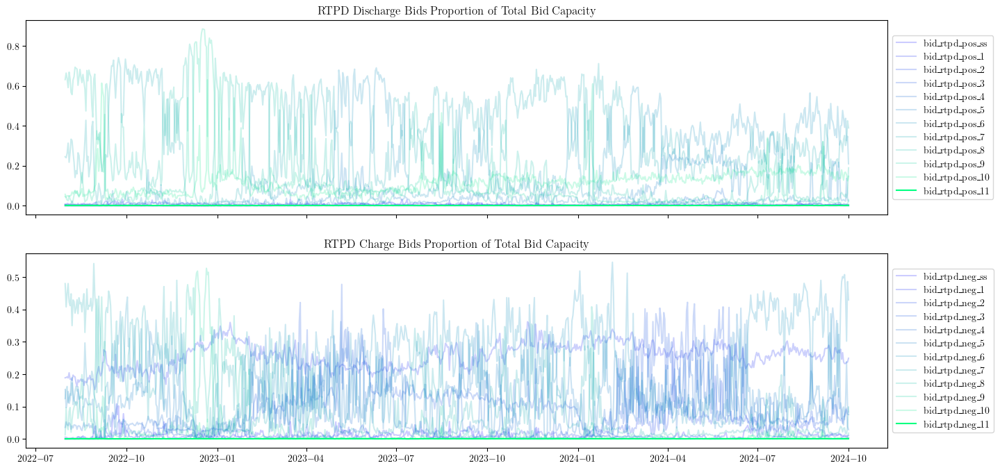

In [137]:
# plot rtpd
fig, axs = plt.subplots(2, 1, figsize=(16, 8), sharex=True)

# set interest segment... all other segments have lower opacities
interest_segment = "11"

# Get the colormap
cmap = plt.get_cmap("winter")
colors = cmap(np.linspace(0, 1, len([col for col in bid_columns if "rtpd_pos" in col])))

# Plot rtpd_pos_x proportions with lowered opacity for non-interest segments
for i, col in enumerate([col for col in bid_columns if "rtpd_pos" in col]):
    if interest_segment in col:
        axs[0].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_rtpd_pos_tot"],
            label=col,
            color=colors[i],
        )
    else:
        axs[0].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_rtpd_pos_tot"],
            label=col,
            color=colors[i],
            alpha=0.2,
        )
axs[0].set_title("RTPD Discharge Bids Proportion of Total Bid Capacity")

# Plot rtpd_neg_x proportions with lowered opacity for non-interest segments
for i, col in enumerate([col for col in bid_columns if "rtpd_neg" in col]):
    if interest_segment in col:
        axs[1].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_rtpd_neg_tot"],
            label=col,
            color=colors[i],
        )
    else:
        axs[1].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_rtpd_neg_tot"],
            label=col,
            color=colors[i],
            alpha=0.2,
        )
axs[1].set_title("RTPD Charge Bids Proportion of Total Bid Capacity")

# Move the legend off the right side of the plot
axs[0].legend(loc="center left", bbox_to_anchor=(1, 0.5))
axs[1].legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()

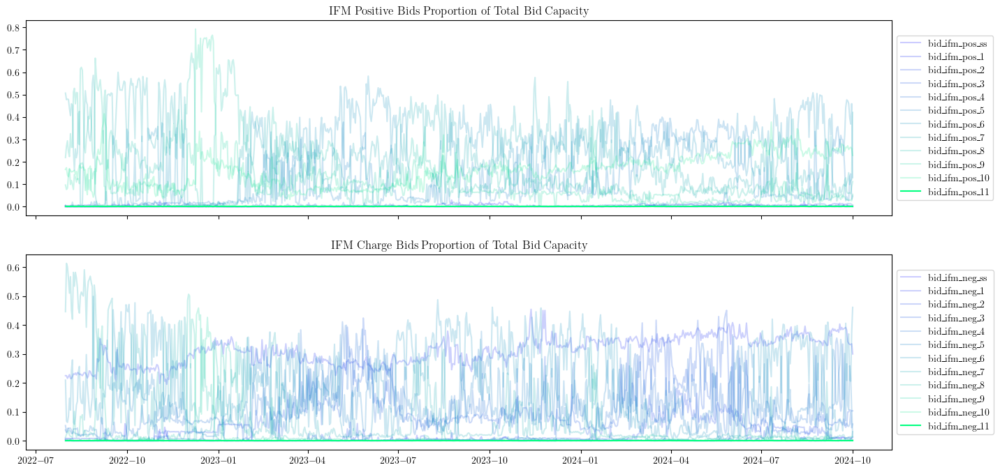

In [138]:
# plot ifm
fig, axs = plt.subplots(2, 1, figsize=(16, 8), sharex=True)

# Plot ifm_pos_x proportions with lowered opacity for non-interest segments
for i, col in enumerate([col for col in bid_columns if "ifm_pos" in col]):
    if interest_segment in col:
        axs[0].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_ifm_pos_tot"],
            label=col,
            color=colors[i],
        )
    else:
        axs[0].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_ifm_pos_tot"],
            label=col,
            color=colors[i],
            alpha=0.2,
        )
axs[0].set_title("IFM Positive Bids Proportion of Total Bid Capacity")

# Plot ifm_neg_x proportions with lowered opacity for non-interest segments
for i, col in enumerate([col for col in bid_columns if "ifm_neg" in col]):
    if interest_segment in col:
        axs[1].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_ifm_neg_tot"],
            label=col,
            color=colors[i],
        )
    else:
        axs[1].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_ifm_neg_tot"],
            label=col,
            color=colors[i],
            alpha=0.2,
        )
axs[1].set_title("IFM Charge Bids Proportion of Total Bid Capacity")

# Move the legend off the right side of the plot
axs[0].legend(loc="center left", bbox_to_anchor=(1, 0.5))
axs[1].legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()

ss


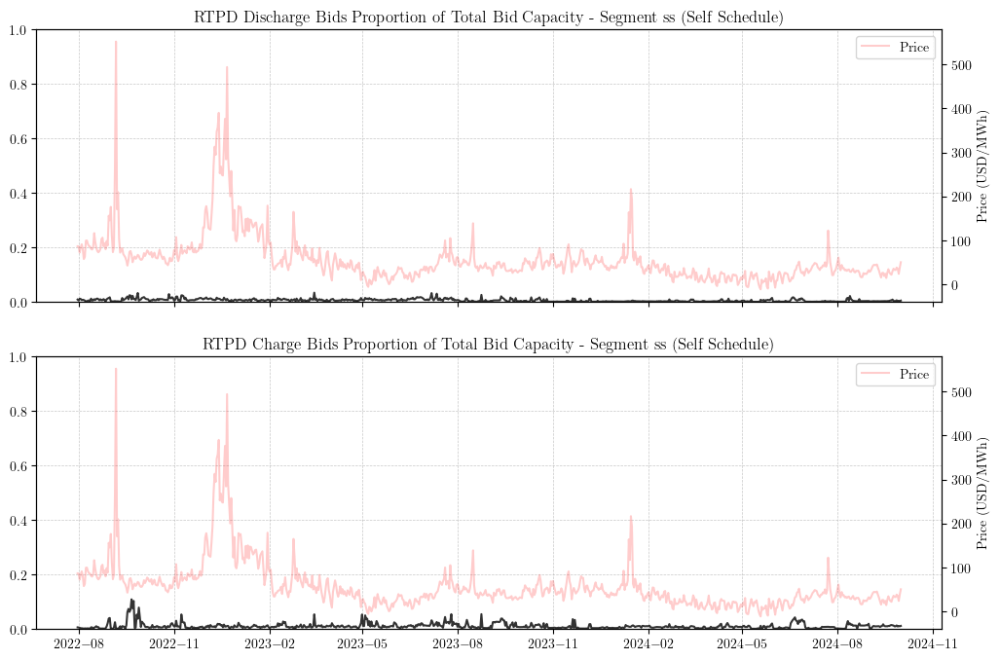

-0.00011355178591170188
1


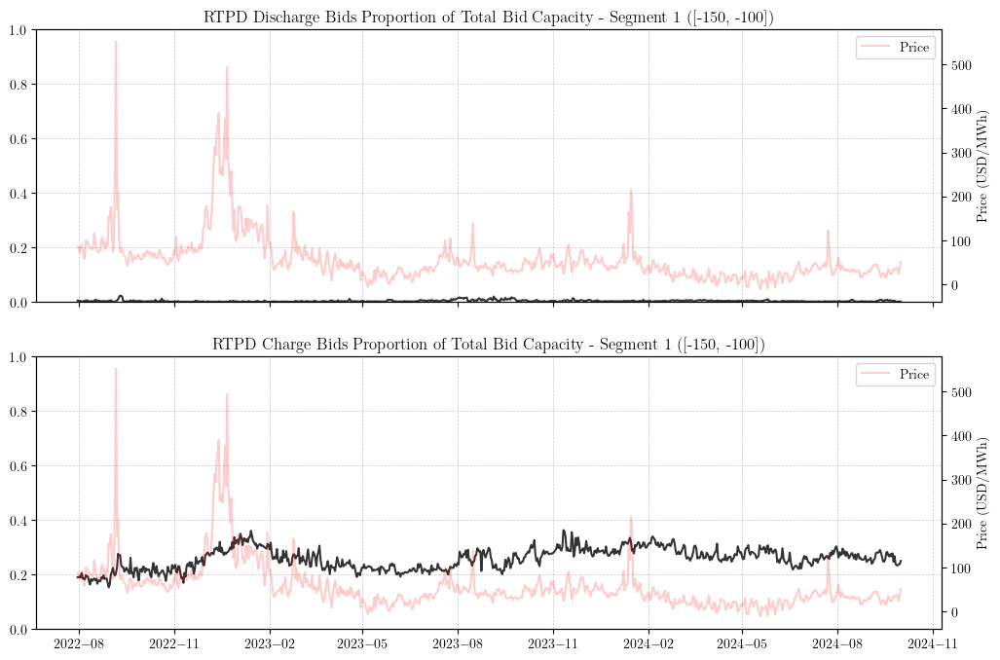

-0.1405205638549434
2


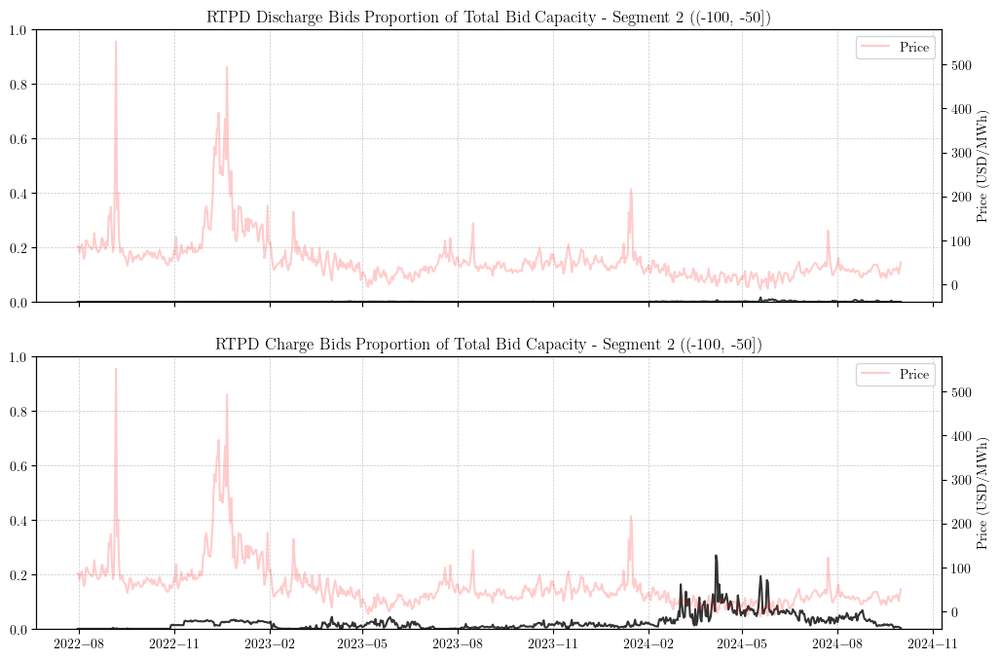

0.0
3


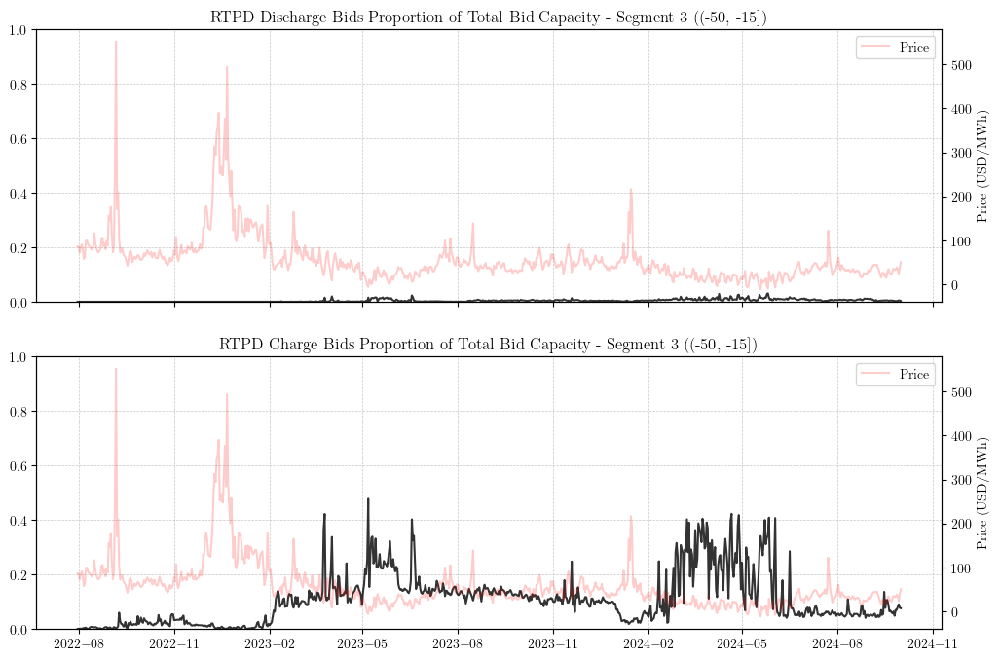

0.0
4


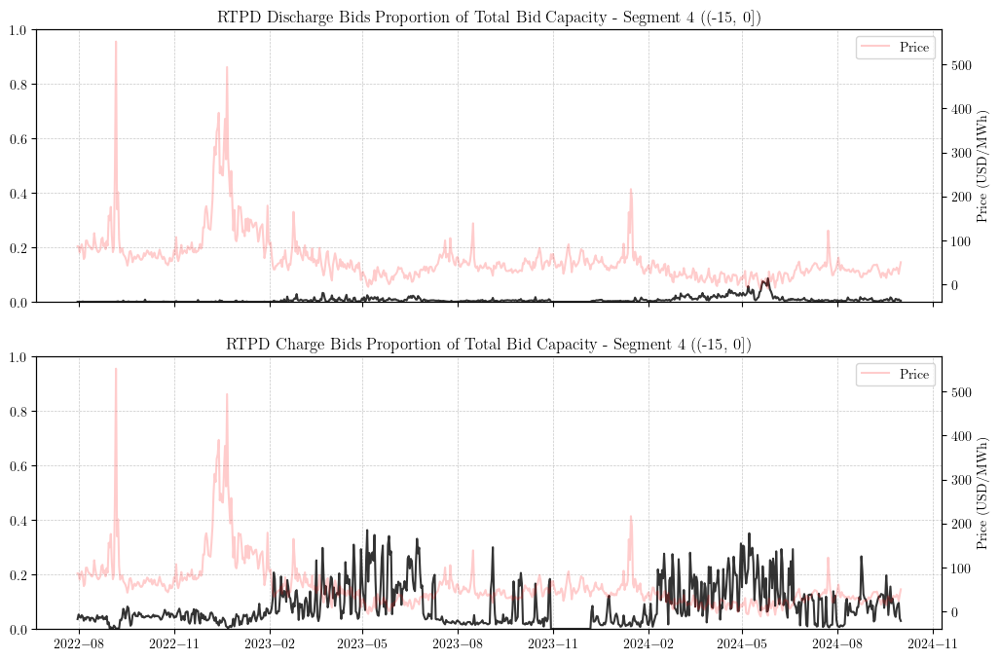

0.0
5


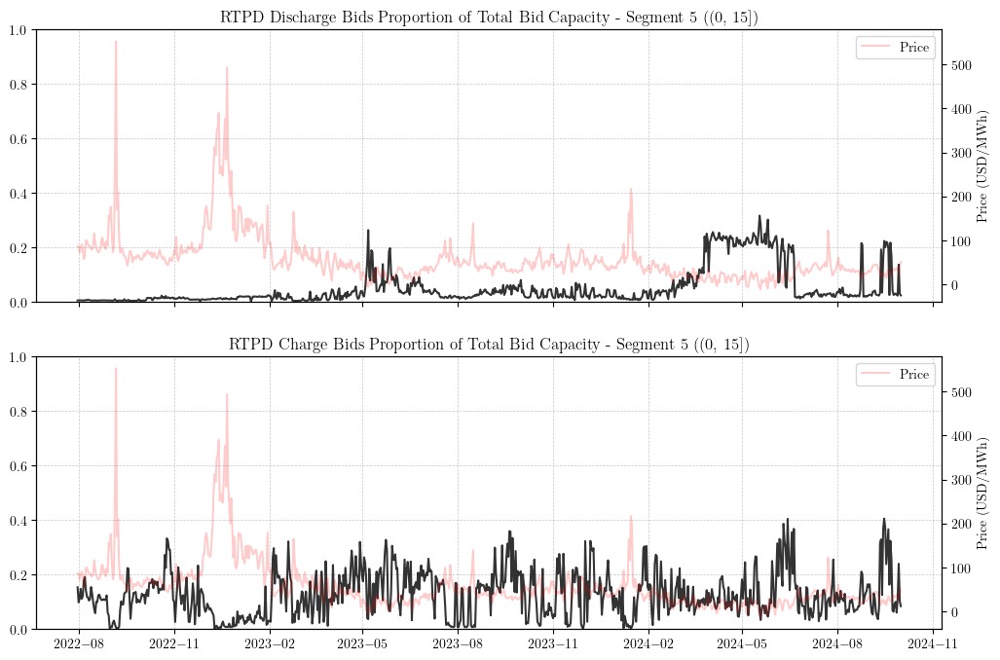

-0.00023496312279750473
6


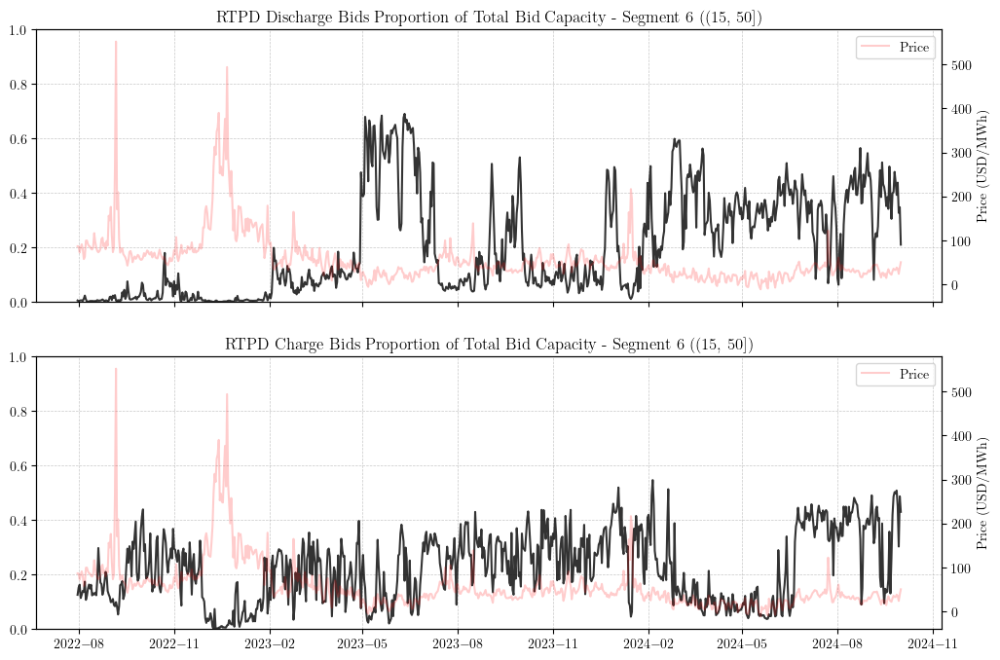

-0.00016383856356761038
7


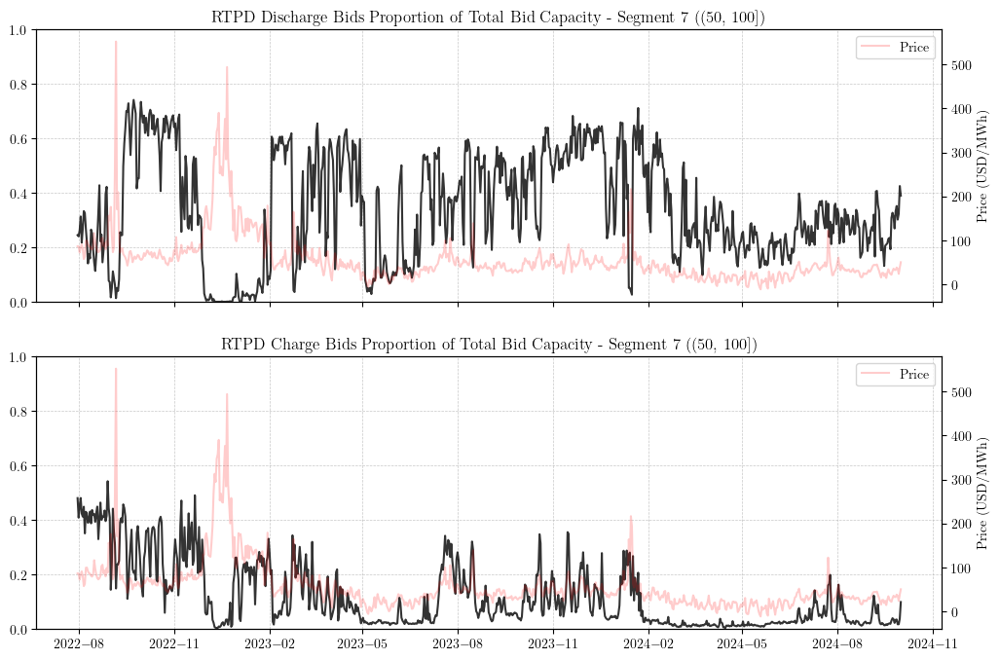

-0.002710089801750762
8


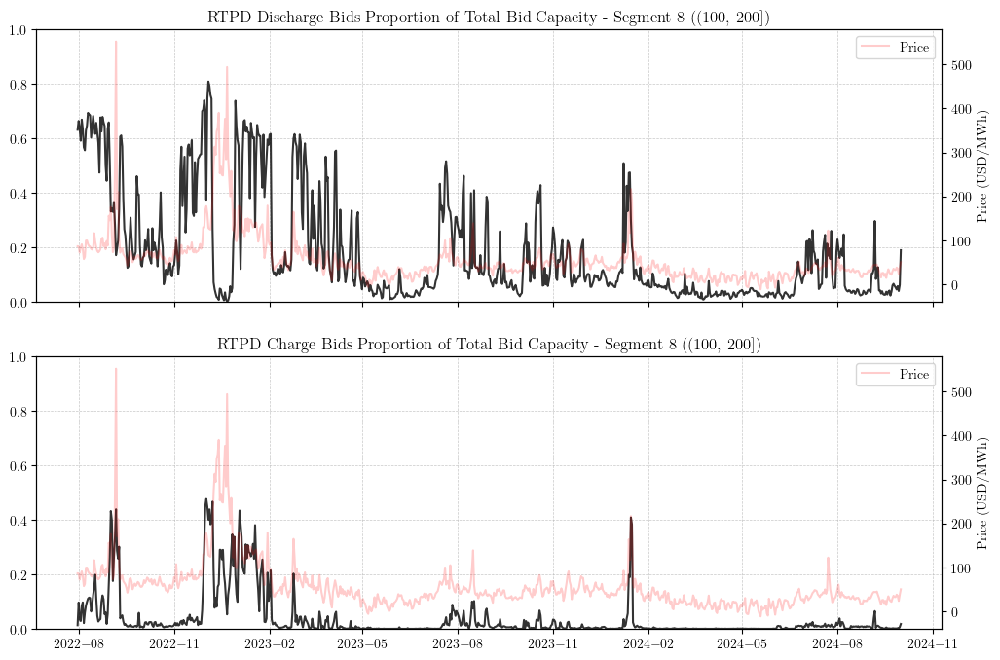

0.0
9


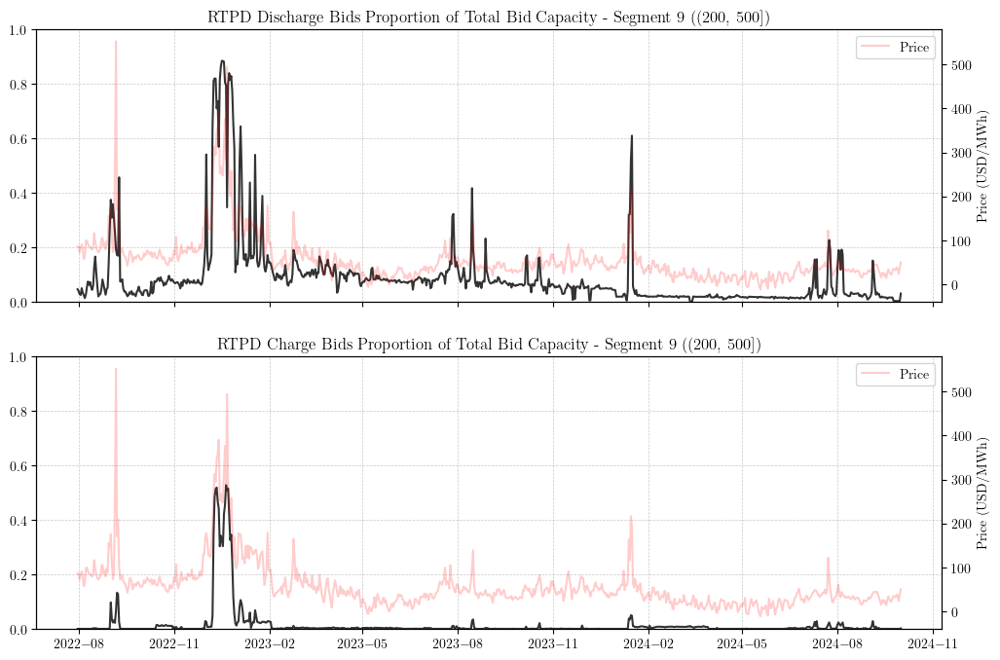

0.0
10


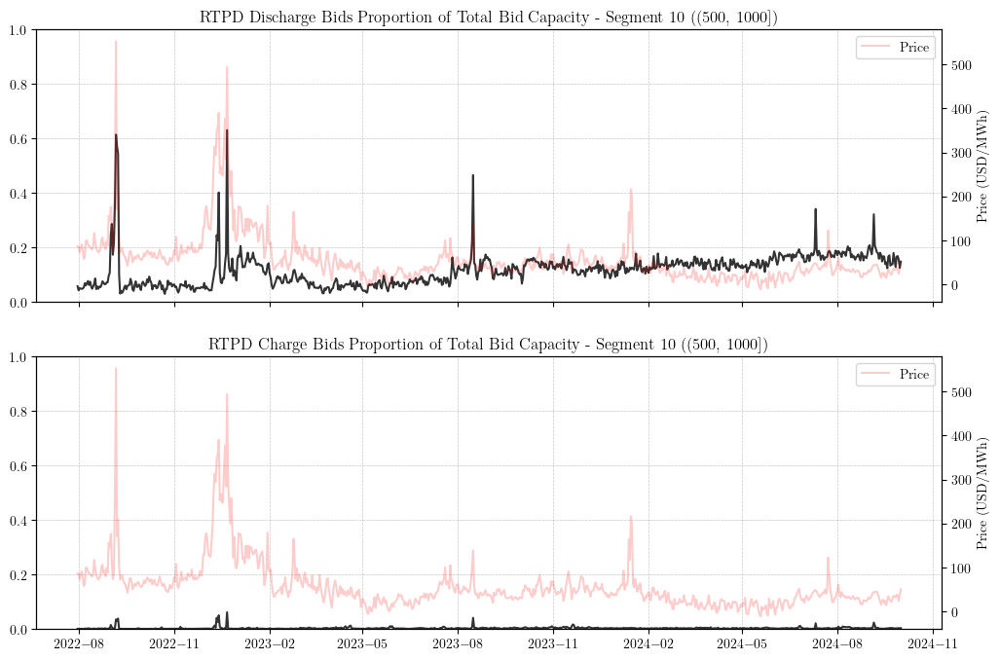

0.0
11


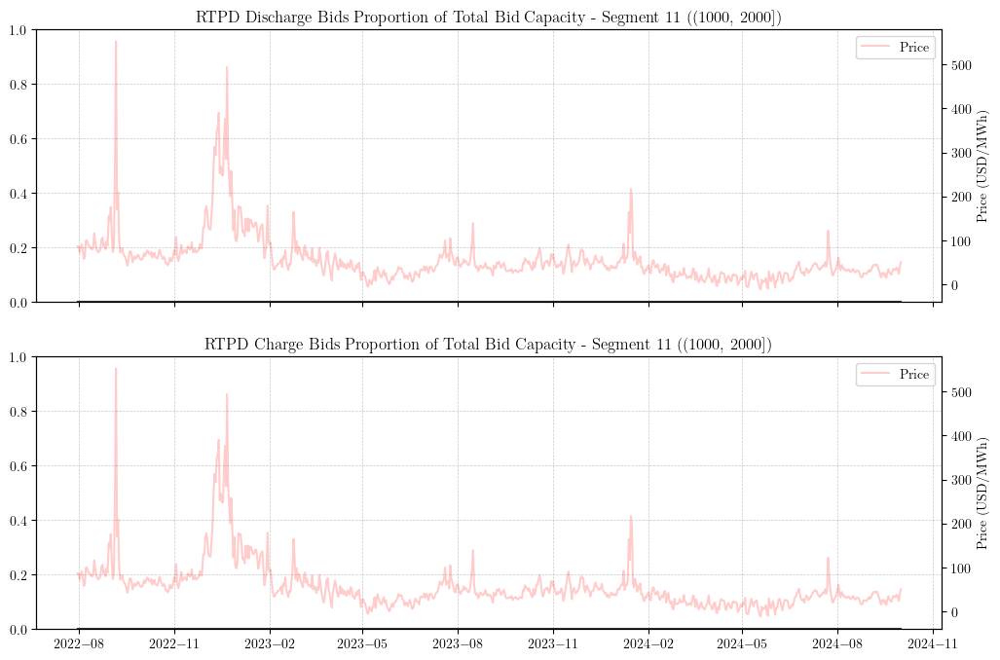

0.0


In [139]:
for interest_segment in ["ss"] + list(str(val + 1) for val in range(11)):
    print(interest_segment)
    # plot rtpd for interest segment
    fig, axs = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    # Plot rtpd_pos_x proportions for interest segment
    for i, col in enumerate(
        [
            col
            for col in bid_columns
            if "rtpd_pos" in col and col.endswith("_" + interest_segment)
        ]
    ):
        axs[0].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_rtpd_pos_tot"],
            label=col,
            color="black",
            alpha=0.8,
        )

    axs[0].set_title(
        f"RTPD Discharge Bids Proportion of Total Bid Capacity - Segment {interest_segment} ({bid_segments[interest_segment]})"
    )
    axs[0].set_ylim(0, 1)  # Adjust y-axis

    # Create a secondary y-axis for price
    ax2_0 = axs[0].twinx()
    ax2_0.plot(
        df_daily_aggregate.index,
        df_daily_aggregate["price"],
        color="red",
        label="Price",
        alpha=0.2,
    )
    ax2_0.set_ylabel("Price (USD/MWh)")
    ax2_0.legend(loc="upper right")

    # Plot rtpd_neg_x proportions for interest segment
    for i, col in enumerate(
        [
            col
            for col in bid_columns
            if "rtpd_neg" in col and col.endswith("_" + interest_segment)
        ]
    ):
        axs[1].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_rtpd_neg_tot"],
            label=col,
            color="black",
            alpha=0.8,
        )
    axs[1].set_title(
        f"RTPD Charge Bids Proportion of Total Bid Capacity - Segment {interest_segment} ({bid_segments[interest_segment]})"
    )
    axs[1].set_ylim(0, 1)  # Adjust y-axis

    # Create a secondary y-axis for price
    ax2_1 = axs[1].twinx()
    ax2_1.plot(
        df_daily_aggregate.index,
        df_daily_aggregate["price"],
        color="red",
        label="Price",
        alpha=0.2,
    )
    ax2_1.set_ylabel("Price (USD/MWh)")
    ax2_1.legend(loc="upper right")

    # Set grid lines
    for ax in axs:
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
        ax.yaxis.set_major_locator(MultipleLocator(0.2))
        ax.grid(True, which="both", linestyle="--", linewidth=0.5, alpha=0.7)

    plt.show()
    print(max(df_daily_aggregate[col] / df_daily_aggregate["bid_rtpd_pos_tot"]))

ss


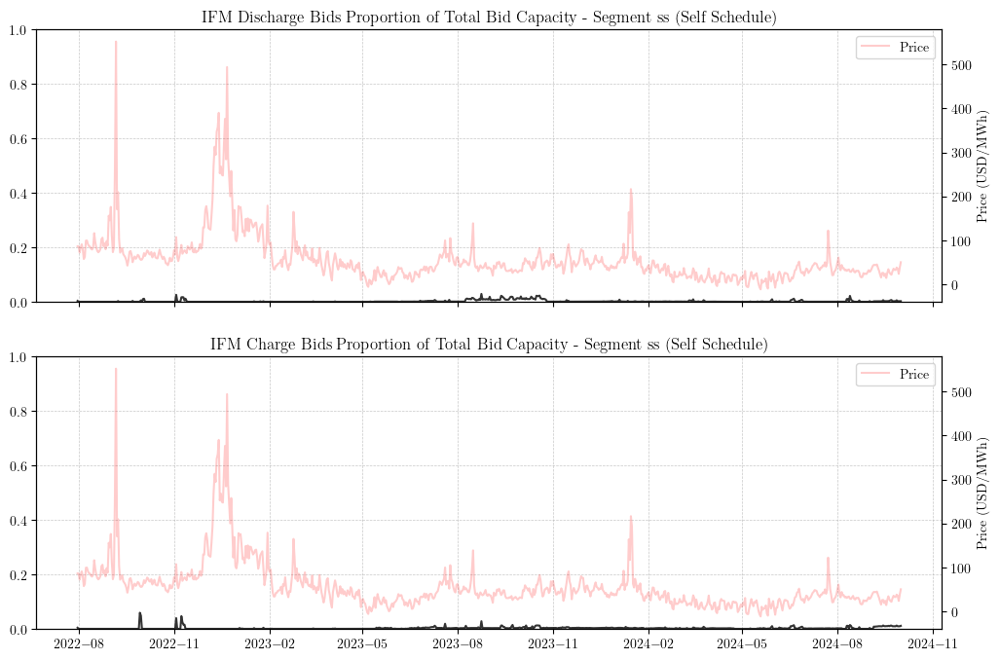

0.0
1


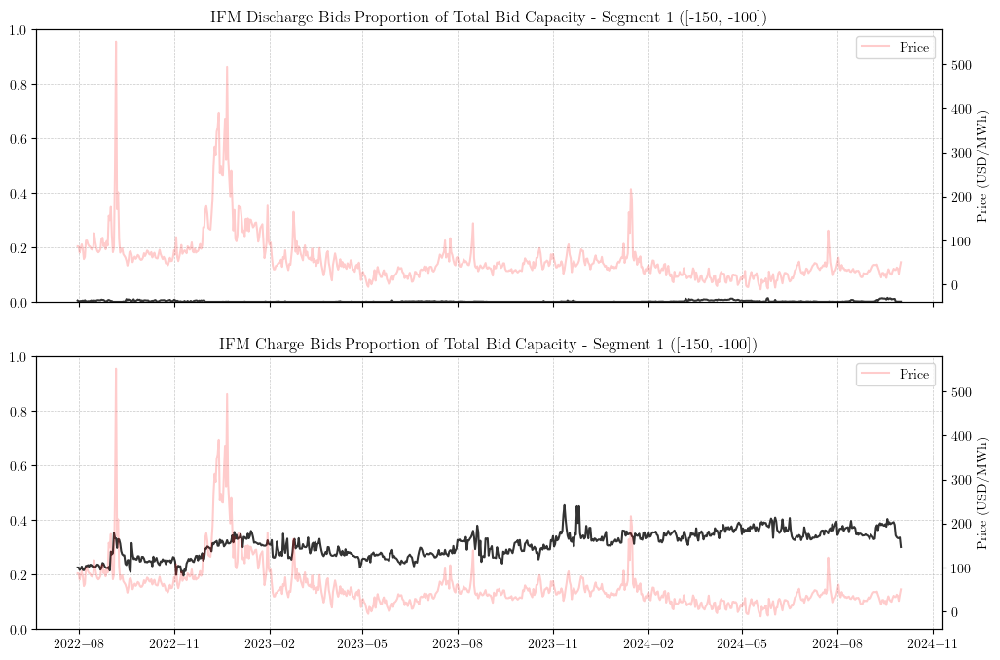

-0.185807462004804
2


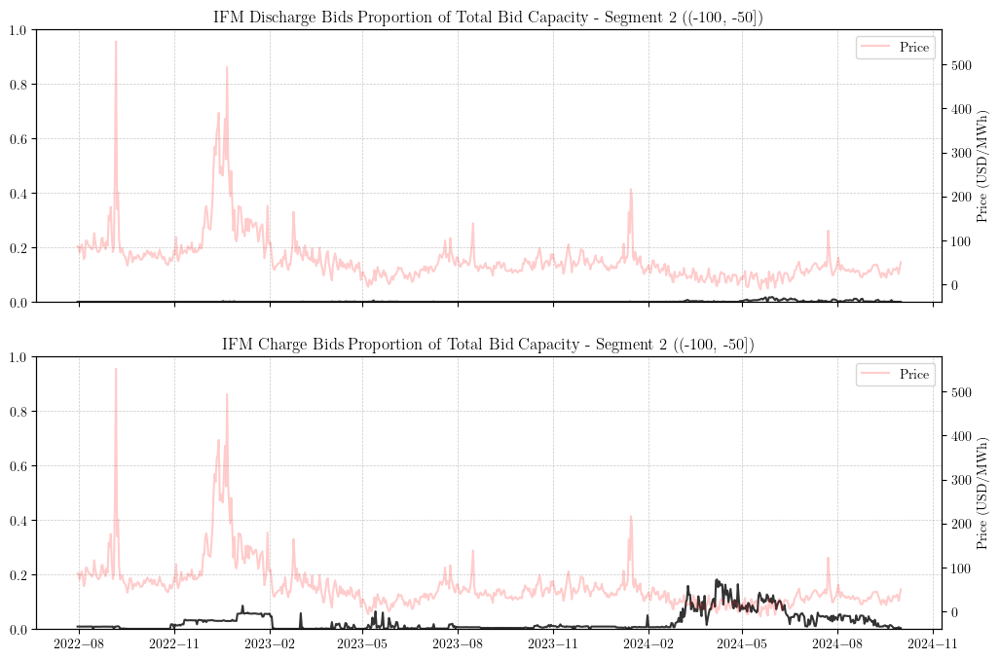

-3.6510762788697904e-06
3


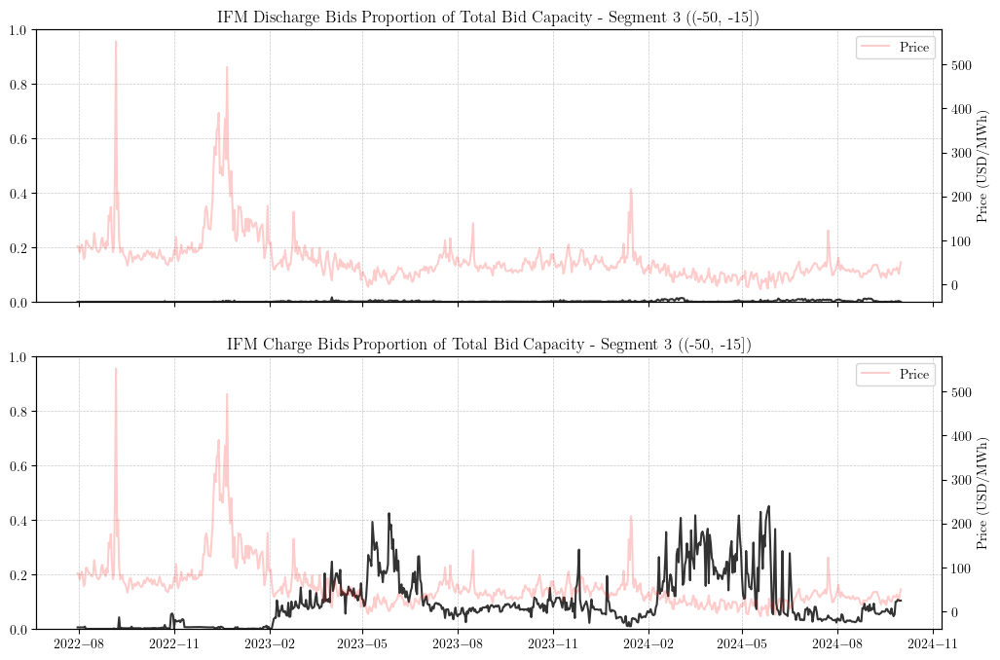

0.0
4


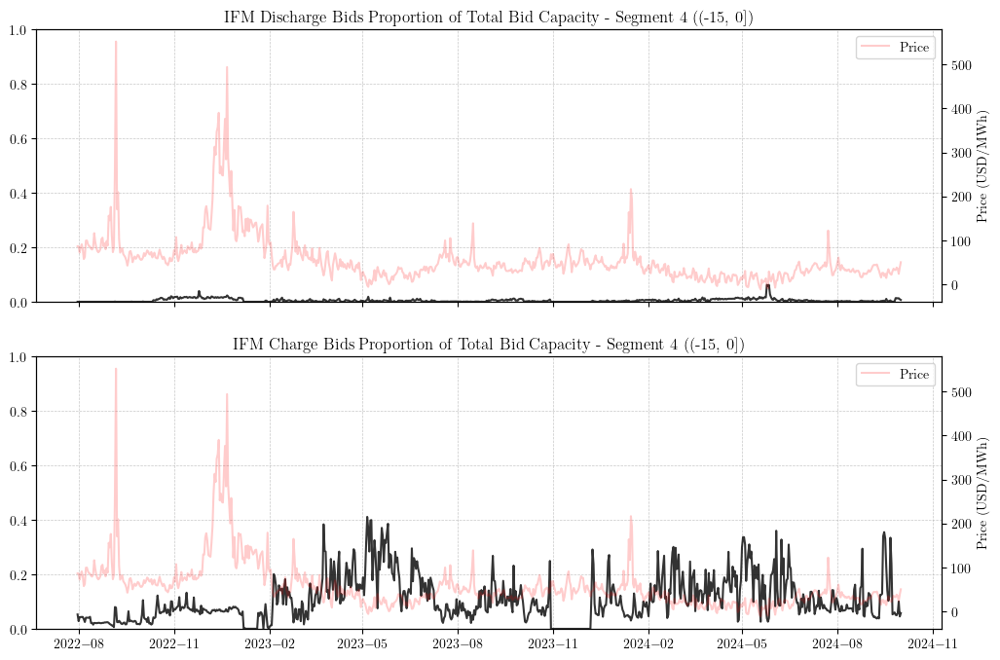

0.0
5


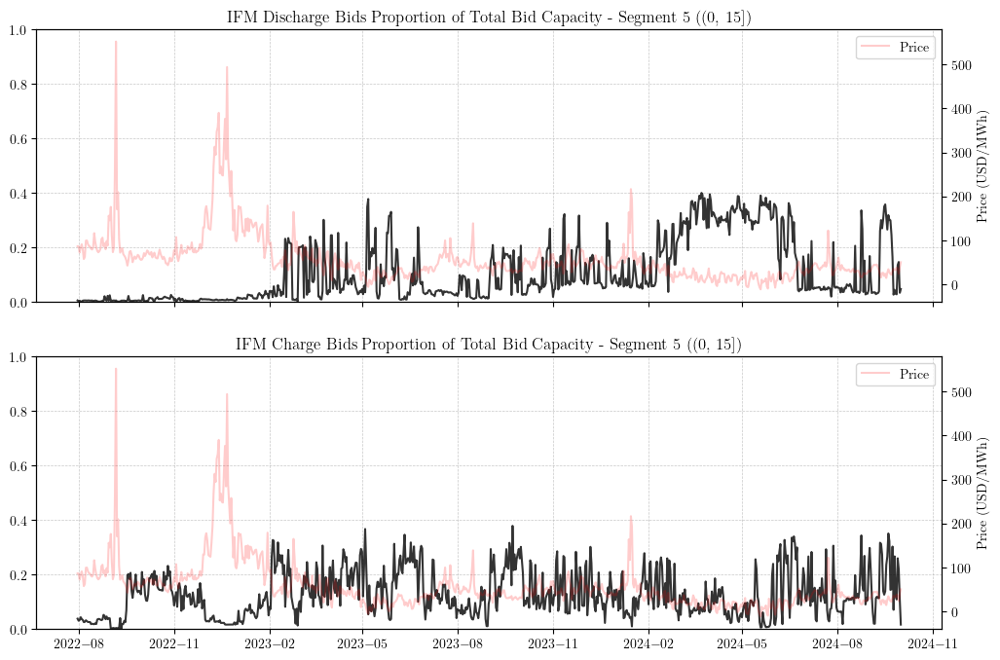

0.0
6


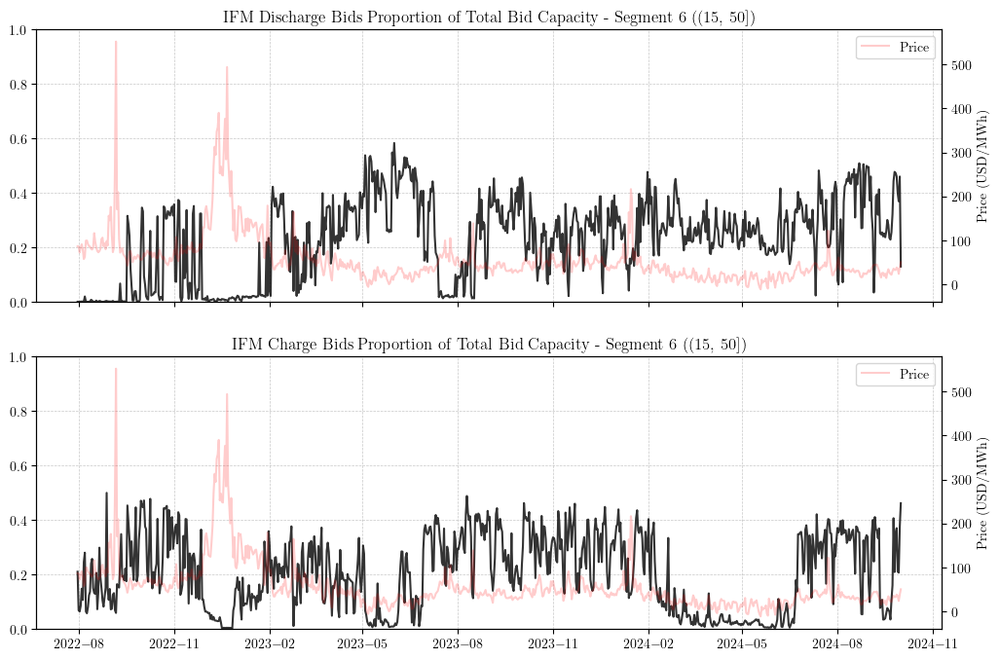

-0.0011755526740509126
7


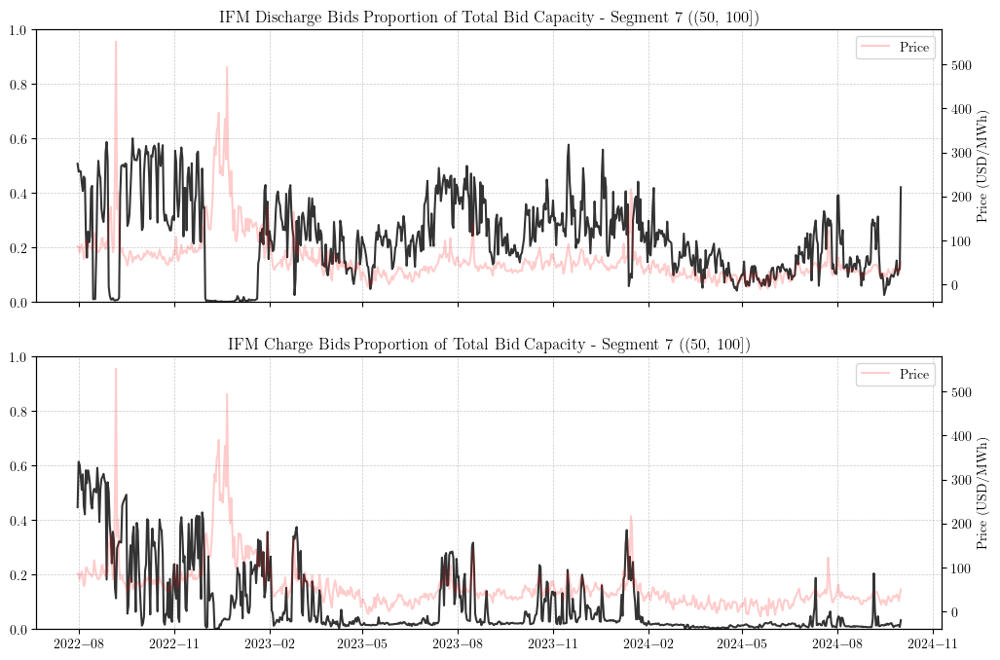

-1.1843867505970491e-05
8


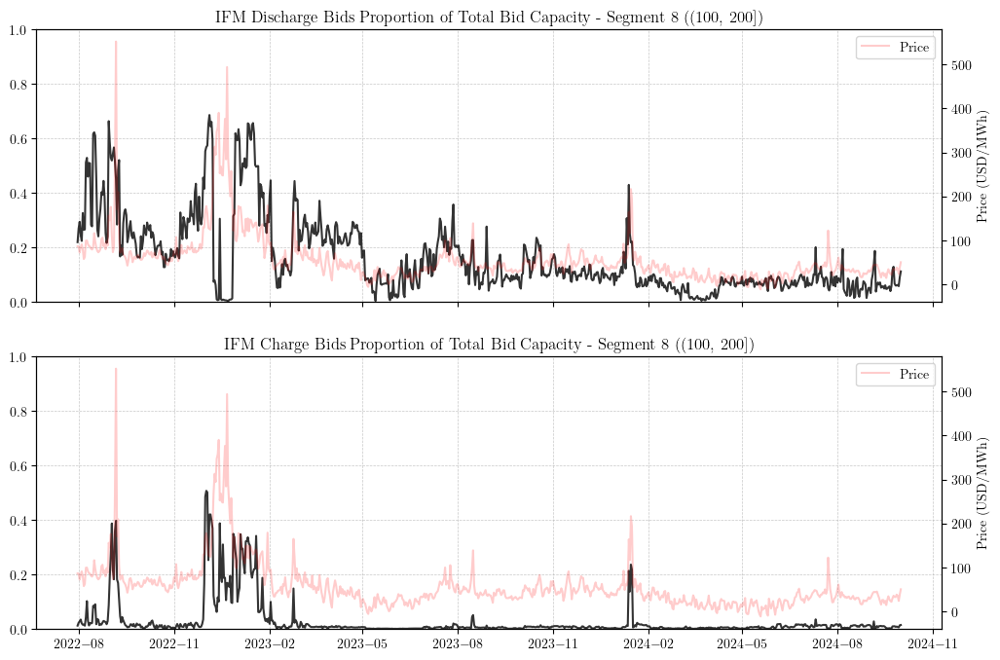

0.0
9


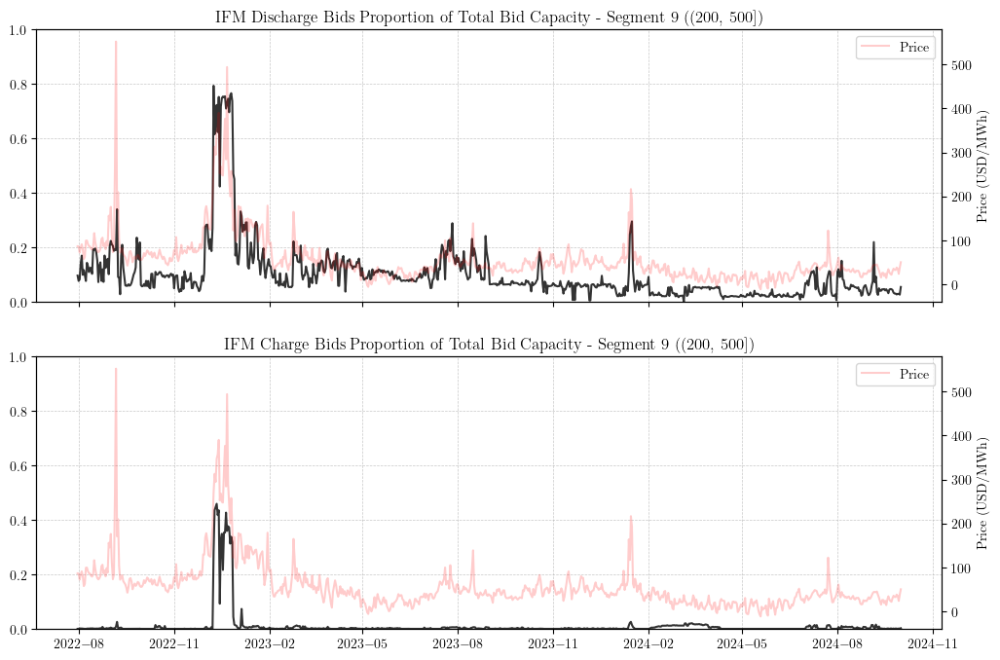

0.0
10


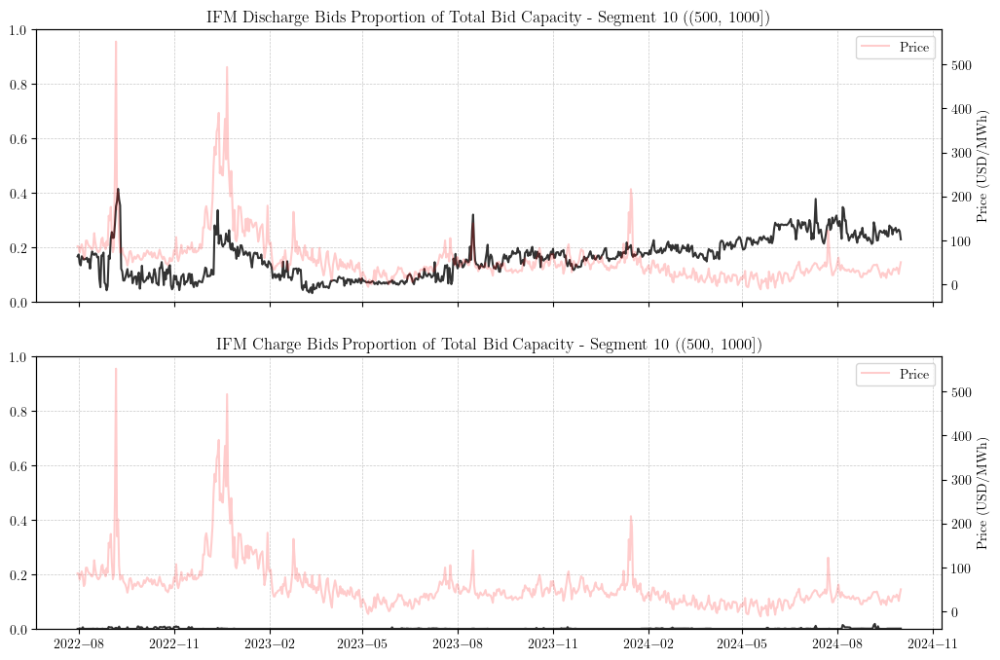

0.0
11


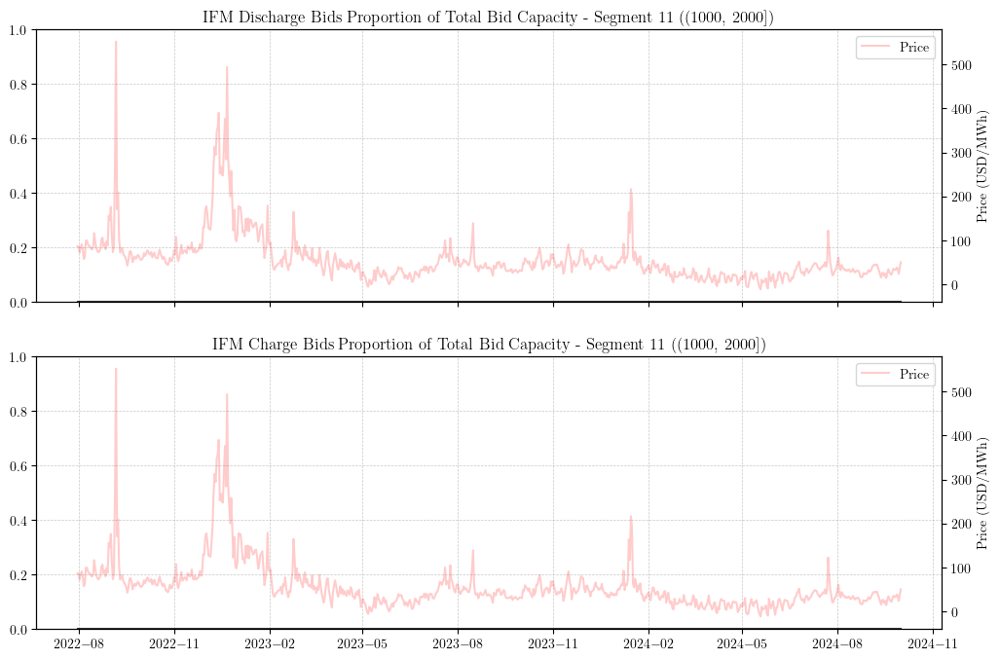

0.0


In [140]:
for interest_segment in ["ss"] + list(str(val + 1) for val in range(11)):
    print(interest_segment)
    # plot ifm for interest segment
    fig, axs = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    # Plot ifm_pos_x proportions for interest segment
    for i, col in enumerate(
        [
            col
            for col in bid_columns
            if "ifm_pos" in col and col.endswith("_" + interest_segment)
        ]
    ):
        axs[0].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_ifm_pos_tot"],
            label=col,
            color="black",
            alpha=0.8,
        )

        # Create a secondary y-axis for price
        ax2_0 = axs[0].twinx()
        ax2_0.plot(
            df_daily_aggregate.index,
            df_daily_aggregate["price"],
            color="red",
            label="Price",
            alpha=0.2,
        )
        ax2_0.set_ylabel("Price (USD/MWh)")
        ax2_0.legend(loc="upper right")
    axs[0].set_title(
        f"IFM Discharge Bids Proportion of Total Bid Capacity - Segment {interest_segment} ({bid_segments[interest_segment]})"
    )
    axs[0].set_ylim(0, 1)  # Adjust y-axis

    # Plot ifm_neg_x proportions for interest segment
    for i, col in enumerate(
        [
            col
            for col in bid_columns
            if "ifm_neg" in col and col.endswith("_" + interest_segment)
        ]
    ):
        axs[1].plot(
            df_daily_aggregate.index,
            df_daily_aggregate[col] / df_daily_aggregate["bid_ifm_neg_tot"],
            label=col,
            color="black",
            alpha=0.8,
        )
    axs[1].set_title(
        f"IFM Charge Bids Proportion of Total Bid Capacity - Segment {interest_segment} ({bid_segments[interest_segment]})"
    )

    # Create a secondary y-axis for price
    ax2_1 = axs[1].twinx()
    ax2_1.plot(
        df_daily_aggregate.index,
        df_daily_aggregate["price"],
        color="red",
        label="Price",
        alpha=0.2,
    )
    ax2_1.set_ylabel("Price (USD/MWh)")
    ax2_1.legend(loc="upper right")
    axs[1].set_ylim(0, 1)  # Adjust y-axis

    # Set grid lines
    for ax in axs:
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
        ax.yaxis.set_major_locator(MultipleLocator(0.2))
        ax.grid(True, which="both", linestyle="--", linewidth=0.5, alpha=0.7)

    plt.show()
    print(max(df_daily_aggregate[col] / df_daily_aggregate["bid_ifm_pos_tot"]))

In [141]:
# Filter columns containing '11'
bid_11_columns = [col for col in df.columns if "11" in col]

# Calculate the sum for each of these columns
bid_11_sums = df[bid_11_columns].sum()

# Print the sums
print(bid_11_sums)

bid_ifm_pos_11     0.0
bid_ifm_neg_11     0.0
bid_rtpd_pos_11    0.0
bid_rtpd_neg_11    0.0
dtype: float64


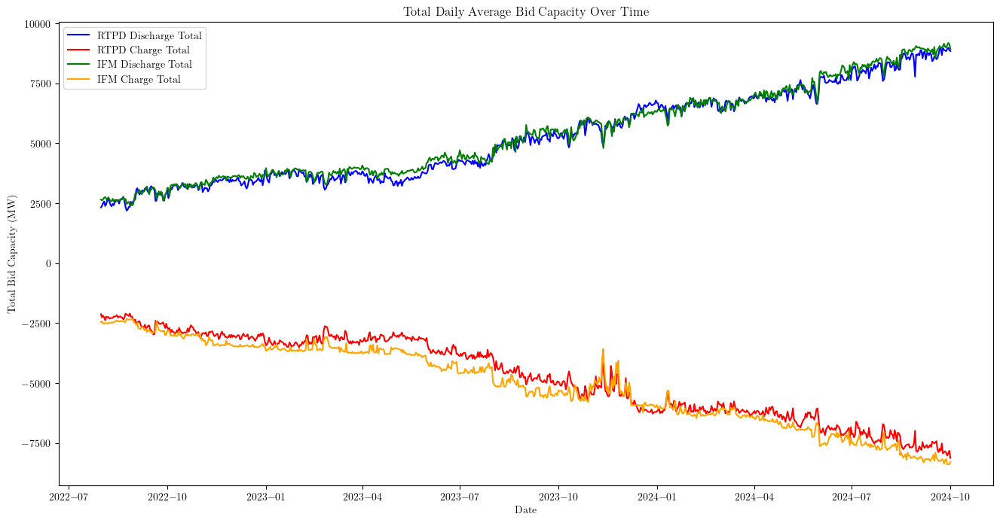

In [142]:
# Plot total bid capacity over time for both Discharge and Charge RTPD and IFM bids
fig, ax = plt.subplots(figsize=(16, 8))

# Plot RTPD Discharge and Charge total bid capacity
ax.plot(
    df_daily_aggregate.index,
    df_daily_aggregate["bid_rtpd_pos_tot"],
    label="RTPD Discharge Total",
    color="blue",
)
ax.plot(
    df_daily_aggregate.index,
    df_daily_aggregate["bid_rtpd_neg_tot"],
    label="RTPD Charge Total",
    color="red",
)

# Plot IFM Discharge and Charge total bid capacity
ax.plot(
    df_daily_aggregate.index,
    df_daily_aggregate["bid_ifm_pos_tot"],
    label="IFM Discharge Total",
    color="green",
)
ax.plot(
    df_daily_aggregate.index,
    df_daily_aggregate["bid_ifm_neg_tot"],
    label="IFM Charge Total",
    color="orange",
)

# Set title and labels
ax.set_title("Total Daily Average Bid Capacity Over Time")
ax.set_xlabel("Date")
ax.set_ylabel("Total Bid Capacity (MW)")

# Add legend
ax.legend(loc="upper left")

plt.show()

In [143]:
print(
    df_daily_aggregate["bid_ifm_pos_tot"][0], df_daily_aggregate["bid_ifm_pos_tot"][-1]
)

2652.240416666667 8935.8875


C:\Users\Astro\AppData\Local\Temp\ipykernel_36072\3844608432.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  df_daily_aggregate["bid_ifm_pos_tot"][0], df_daily_aggregate["bid_ifm_pos_tot"][-1]


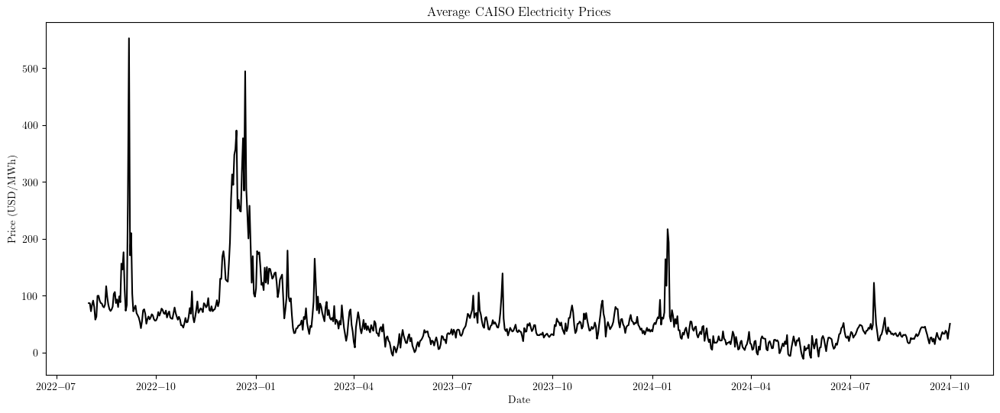

In [144]:
# Plot total bid capacity over time for both Discharge and Charge RTPD and IFM bids
fig, ax = plt.subplots(figsize=(16, 6))

ax.plot(
    df_daily_aggregate.index,
    df_daily_aggregate["price"],
    label="Average CAISO Price",
    color="black",
)
ax.set_xlabel("Date")
ax.set_ylabel("Price (USD/MWh)")
ax.set_title("Average CAISO Electricity Prices")

plt.show()

In [145]:
# identify dates, price spikes, and average prices
start_filter_date = pd.Timestamp("2024-07-01")
end_filter_date = pd.Timestamp("2024-10-01")

df_filtered = df_daily_aggregate[
    (df_daily_aggregate.index > start_filter_date)
    & (df_daily_aggregate.index < end_filter_date)
]
print(df_filtered.index[np.argmax(df_filtered.price)])
print(df_filtered.price[np.argmax(df_filtered.price)])
print(np.mean(df_filtered.price))

2024-07-23 00:00:00
122.47371691071429
34.86647530595227


C:\Users\Astro\AppData\Local\Temp\ipykernel_36072\3339174790.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(df_filtered.price[np.argmax(df_filtered.price)])


In [146]:
def plot_bid_distribution(
    start_date: str = None,
    end_date: str = None,
):
    if end_date == None:
        # Filter the data for the start_date
        df_interest_date = df_daily_aggregate.loc[pd.Timestamp(start_date)]
        date_interest_string = start_date
    else:
        # Filter the data for the date range
        df_interest_date = df_daily_aggregate.loc[
            pd.Timestamp(start_date) : pd.Timestamp(end_date)
        ]
        date_interest_string = f"{start_date} to {end_date}"

        df_interest_date = df_interest_date.mean()

    # Extract the relevant columns and align segments by suffix
    suffixes = ["ss"] + [str(i) for i in range(1, 12)]
    x_markers = [bid_segments[s] for s in suffixes]

    rtpd_pos_columns = [f"bid_rtpd_pos_{suffix}" for suffix in suffixes]
    rtpd_neg_columns = [f"bid_rtpd_neg_{suffix}" for suffix in suffixes]
    ifm_pos_columns = [f"bid_ifm_pos_{suffix}" for suffix in suffixes]
    ifm_neg_columns = [f"bid_ifm_neg_{suffix}" for suffix in suffixes]

    max_y_lim = max(
        max(df_interest_date[rtpd_pos_columns] / df_interest_date["bid_rtpd_pos_tot"]),
        max(df_interest_date[ifm_pos_columns] / df_interest_date["bid_ifm_pos_tot"]),
        max(df_interest_date[rtpd_neg_columns] / df_interest_date["bid_rtpd_neg_tot"]),
        max(df_interest_date[ifm_neg_columns] / df_interest_date["bid_ifm_neg_tot"]),
    )
    max_y_lim = math.ceil(max_y_lim * 10) / 10

    # Create a 2x2 figure
    fig, axs = plt.subplots(
        2, 2, figsize=(12, 8), sharex=True, sharey=False, gridspec_kw={"hspace": 0}
    )

    # Plot the stacked distribution for RTPD positive bids
    (df_interest_date[rtpd_pos_columns] / df_interest_date["bid_rtpd_pos_tot"]).plot(
        kind="bar", stacked=True, ax=axs[0, 0], width=1.0
    )
    axs[0, 0].set_xlabel("Bid Segments")
    axs[0, 0].set_ylabel("Discharge Bid Seg. Prop.")
    axs[0, 0].set_ylim((0, max_y_lim))
    axs[0, 0].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)
    axs[0, 0].grid(True, which="both", axis="x", linestyle="--", linewidth=0.5)

    # Plot the stacked distribution for IFM Discharge bids
    (df_interest_date[ifm_pos_columns] / df_interest_date["bid_ifm_pos_tot"]).plot(
        kind="bar", stacked=True, ax=axs[0, 1], width=1.0
    )
    axs[0, 1].set_ylim((0, max_y_lim))
    axs[0, 1].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)
    axs[0, 1].grid(True, which="both", axis="x", linestyle="--", linewidth=0.5)

    # Plot the stacked distribution for RTPD Charge bids
    (df_interest_date[rtpd_neg_columns] / df_interest_date["bid_rtpd_neg_tot"]).plot(
        kind="bar", stacked=True, ax=axs[1, 0], width=1.0
    )
    axs[1, 0].set_xlabel("RTPD Bid Segments")
    axs[1, 0].set_ylabel("Charge Bid Seg. Prop.")
    axs[1, 0].invert_yaxis()
    axs[1, 0].set_ylim((max_y_lim, 0))
    axs[1, 0].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)
    axs[1, 0].grid(True, which="both", axis="x", linestyle="--", linewidth=0.5)

    # Plot the stacked distribution for IFM Charge bids
    (df_interest_date[ifm_neg_columns] / df_interest_date["bid_ifm_neg_tot"]).plot(
        kind="bar", stacked=True, ax=axs[1, 1], width=1.0
    )
    axs[1, 1].set_xlabel("IFM Bid Segments")
    axs[1, 1].invert_yaxis()
    axs[1, 1].set_ylim((max_y_lim, 0))
    axs[1, 1].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)
    axs[1, 1].grid(True, which="both", axis="x", linestyle="--", linewidth=0.5)

    fig.suptitle(f"RTPD and IFM Bid Segment Composition for {date_interest_string}")
    plt.xticks(np.arange(0, 12), x_markers)

    plt.tight_layout()
    plt.show()

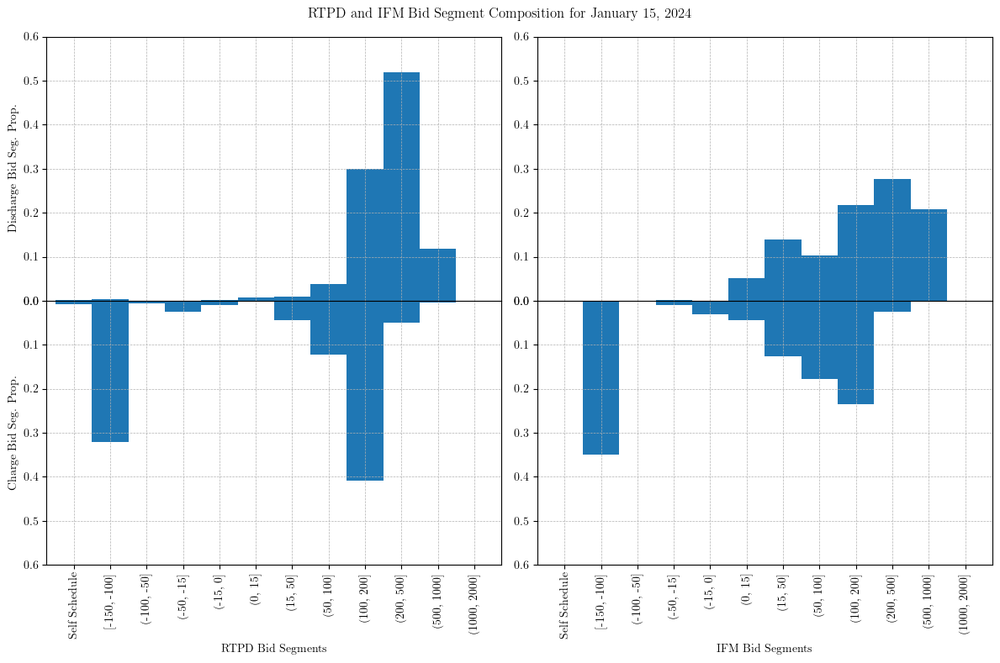

In [147]:
plot_bid_distribution(start_date="January 15, 2024")

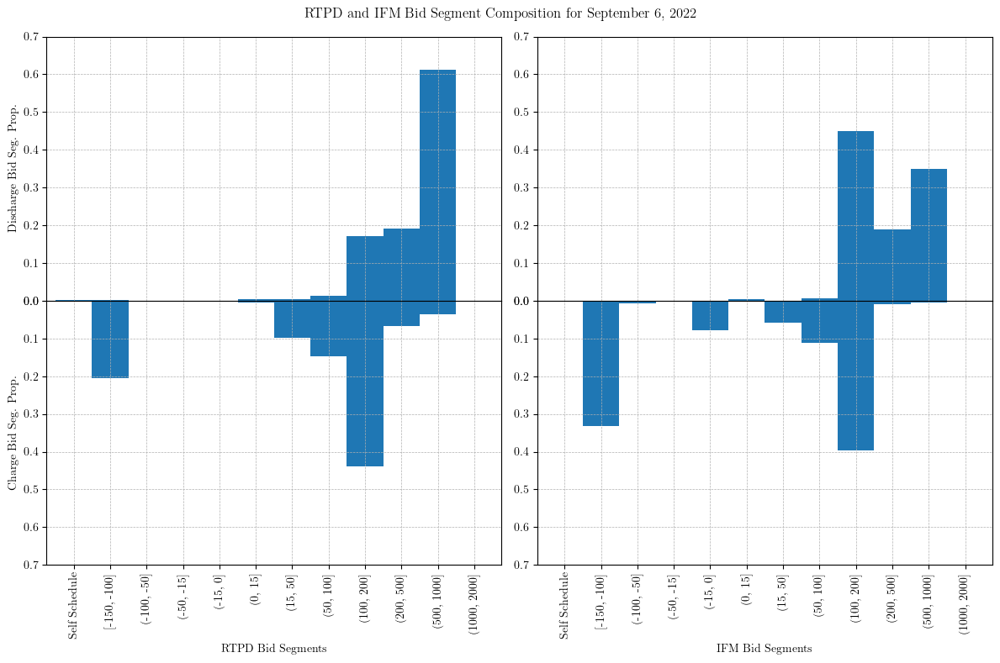

In [148]:
plot_bid_distribution(start_date="September 6, 2022")

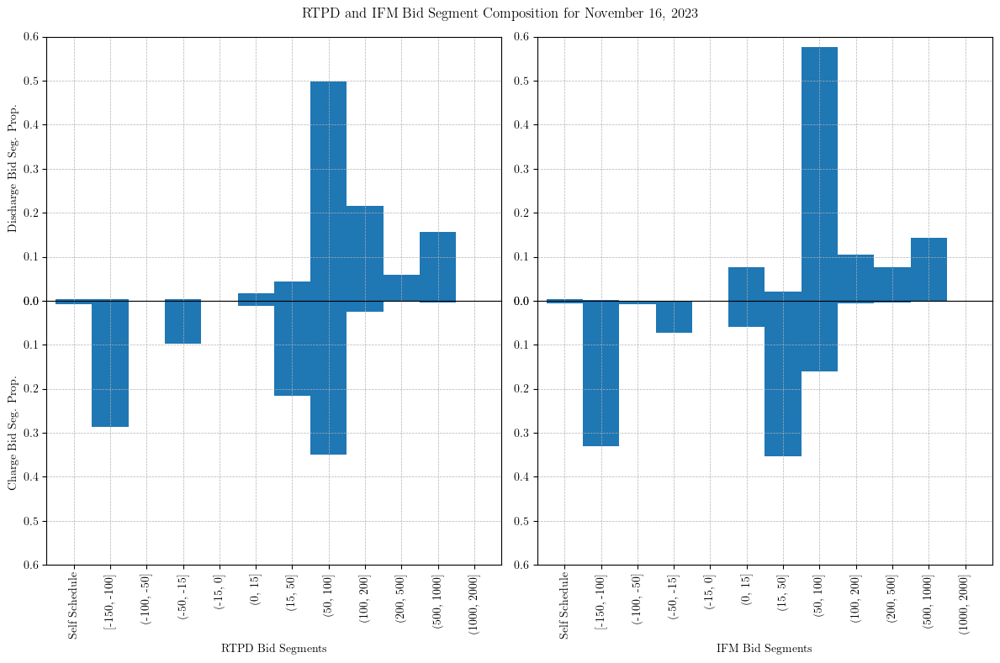

In [149]:
plot_bid_distribution(start_date="November 16, 2023")

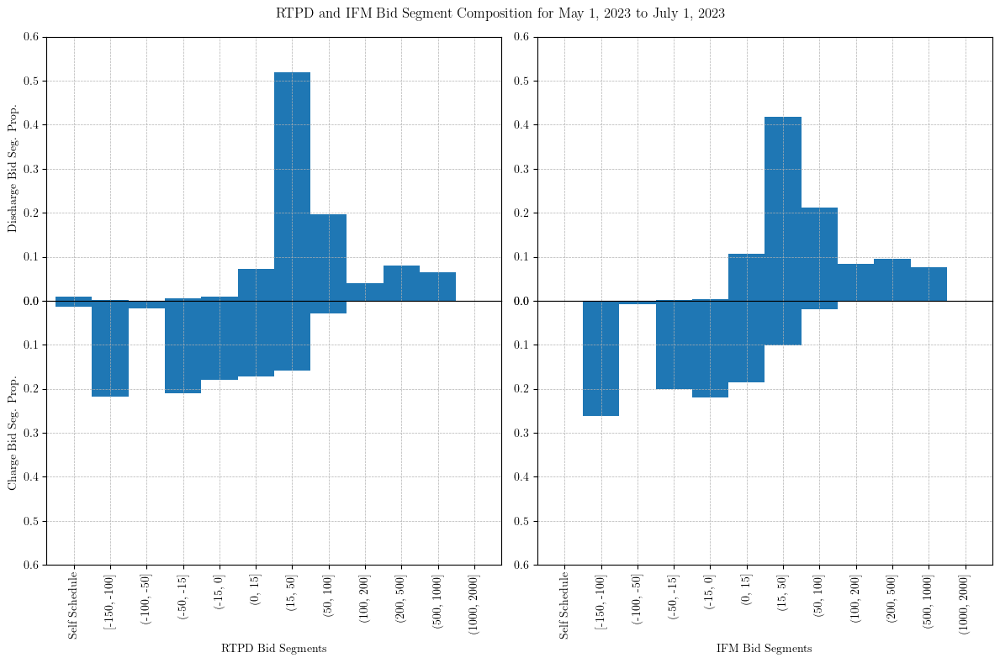

In [150]:
plot_bid_distribution(start_date="May 1, 2023", end_date="July 1, 2023")

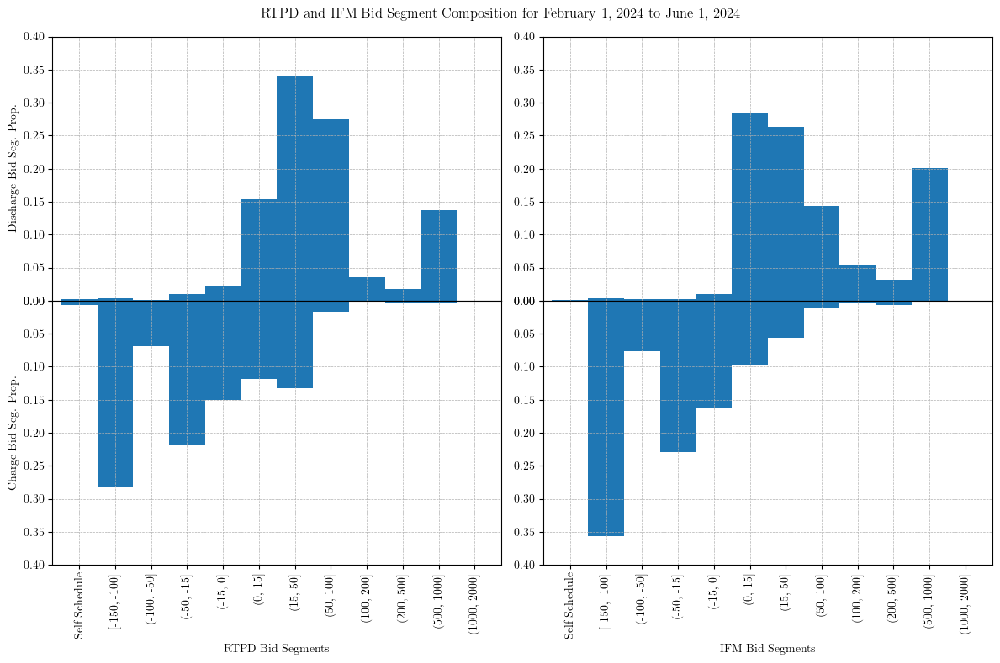

In [151]:
plot_bid_distribution(start_date="February 1, 2024", end_date="June 1, 2024")

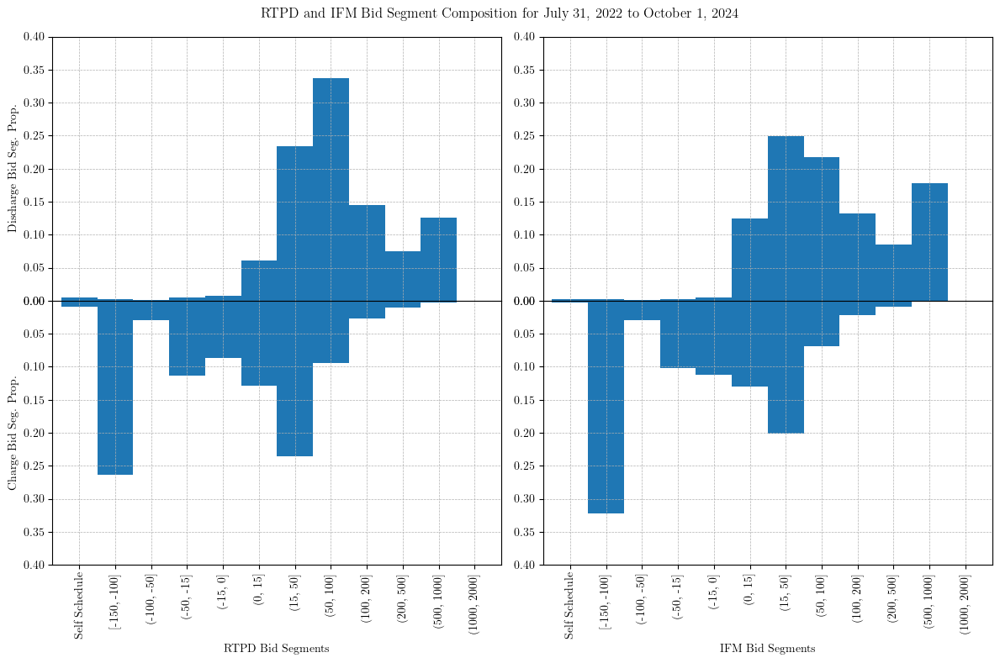

In [152]:
plot_bid_distribution(start_date="July 31, 2022", end_date="October 1, 2024")

In [153]:
bid_segment_edges = [-150, -100, -50, -15, 0, 15, 50, 100, 200, 500, 1000, 2000]
bid_segment_weights = [
    (bid_segment_edges[i] + bid_segment_edges[i + 1]) / 2.0
    for i in range(len(bid_segment_edges) - 1)
]

df_weighted_daily = df_daily_aggregate.copy()
df_weighted_daily["bid_ifm_pos_avg"] = (
    np.abs(df_weighted_daily["bid_ifm_pos_1"]) * bid_segment_weights[0]
    + np.abs(df_weighted_daily["bid_ifm_pos_2"]) * bid_segment_weights[1]
    + np.abs(df_weighted_daily["bid_ifm_pos_3"]) * bid_segment_weights[2]
    + np.abs(df_weighted_daily["bid_ifm_pos_4"]) * bid_segment_weights[3]
    + np.abs(df_weighted_daily["bid_ifm_pos_5"]) * bid_segment_weights[4]
    + np.abs(df_weighted_daily["bid_ifm_pos_6"]) * bid_segment_weights[5]
    + np.abs(df_weighted_daily["bid_ifm_pos_7"]) * bid_segment_weights[6]
    + np.abs(df_weighted_daily["bid_ifm_pos_8"]) * bid_segment_weights[7]
    + np.abs(df_weighted_daily["bid_ifm_pos_9"]) * bid_segment_weights[8]
    + np.abs(df_weighted_daily["bid_ifm_pos_10"]) * bid_segment_weights[9]
    + np.abs(df_weighted_daily["bid_ifm_pos_11"]) * bid_segment_weights[10]
) / np.abs(df_weighted_daily["bid_ifm_pos_tot"])


df_weighted_daily["bid_ifm_neg_avg"] = (
    np.abs(df_weighted_daily["bid_ifm_neg_1"]) * bid_segment_weights[0]
    + np.abs(df_weighted_daily["bid_ifm_neg_2"]) * bid_segment_weights[1]
    + np.abs(df_weighted_daily["bid_ifm_neg_3"]) * bid_segment_weights[2]
    + np.abs(df_weighted_daily["bid_ifm_neg_4"]) * bid_segment_weights[3]
    + np.abs(df_weighted_daily["bid_ifm_neg_5"]) * bid_segment_weights[4]
    + np.abs(df_weighted_daily["bid_ifm_neg_6"]) * bid_segment_weights[5]
    + np.abs(df_weighted_daily["bid_ifm_neg_7"]) * bid_segment_weights[6]
    + np.abs(df_weighted_daily["bid_ifm_neg_8"]) * bid_segment_weights[7]
    + np.abs(df_weighted_daily["bid_ifm_neg_9"]) * bid_segment_weights[8]
    + np.abs(df_weighted_daily["bid_ifm_neg_10"]) * bid_segment_weights[9]
    + np.abs(df_weighted_daily["bid_ifm_neg_11"]) * bid_segment_weights[10]
) / np.abs(df_weighted_daily["bid_ifm_neg_tot"])

df_weighted_daily["bid_rtpd_pos_avg"] = (
    np.abs(df_weighted_daily["bid_rtpd_pos_1"]) * bid_segment_weights[0]
    + np.abs(df_weighted_daily["bid_rtpd_pos_2"]) * bid_segment_weights[1]
    + np.abs(df_weighted_daily["bid_rtpd_pos_3"]) * bid_segment_weights[2]
    + np.abs(df_weighted_daily["bid_rtpd_pos_4"]) * bid_segment_weights[3]
    + np.abs(df_weighted_daily["bid_rtpd_pos_5"]) * bid_segment_weights[4]
    + np.abs(df_weighted_daily["bid_rtpd_pos_6"]) * bid_segment_weights[5]
    + np.abs(df_weighted_daily["bid_rtpd_pos_7"]) * bid_segment_weights[6]
    + np.abs(df_weighted_daily["bid_rtpd_pos_8"]) * bid_segment_weights[7]
    + np.abs(df_weighted_daily["bid_rtpd_pos_9"]) * bid_segment_weights[8]
    + np.abs(df_weighted_daily["bid_rtpd_pos_10"]) * bid_segment_weights[9]
    + np.abs(df_weighted_daily["bid_rtpd_pos_11"]) * bid_segment_weights[10]
) / np.abs(df_weighted_daily["bid_rtpd_pos_tot"])

df_weighted_daily["bid_rtpd_neg_avg"] = (
    np.abs(df_weighted_daily["bid_rtpd_neg_1"]) * bid_segment_weights[0]
    + np.abs(df_weighted_daily["bid_rtpd_neg_2"]) * bid_segment_weights[1]
    + np.abs(df_weighted_daily["bid_rtpd_neg_3"]) * bid_segment_weights[2]
    + np.abs(df_weighted_daily["bid_rtpd_neg_4"]) * bid_segment_weights[3]
    + np.abs(df_weighted_daily["bid_rtpd_neg_5"]) * bid_segment_weights[4]
    + np.abs(df_weighted_daily["bid_rtpd_neg_6"]) * bid_segment_weights[5]
    + np.abs(df_weighted_daily["bid_rtpd_neg_7"]) * bid_segment_weights[6]
    + np.abs(df_weighted_daily["bid_rtpd_neg_8"]) * bid_segment_weights[7]
    + np.abs(df_weighted_daily["bid_rtpd_neg_9"]) * bid_segment_weights[8]
    + np.abs(df_weighted_daily["bid_rtpd_neg_10"]) * bid_segment_weights[9]
    + np.abs(df_weighted_daily["bid_rtpd_neg_11"]) * bid_segment_weights[10]
) / np.abs(df_weighted_daily["bid_rtpd_neg_tot"])

In [154]:
df_weighted_daily

,tot_energy_ifm,tot_energy_ruc,tot_energy_rtpd,tot_energy_rtd,tot_charge_ifm,tot_charge_ruc,tot_charge_rtpd,tot_charge_rtd,as_ru_ifm,as_rd_ifm,...,bid_rtpd_neg_11,price,bid_rtpd_neg_tot,bid_rtpd_pos_tot,bid_ifm_neg_tot,bid_ifm_pos_tot,bid_ifm_pos_avg,bid_ifm_neg_avg,bid_rtpd_pos_avg,bid_rtpd_neg_avg
datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-31,0.791667,0.708333,64.812500,95.944444,4377.291667,4387.458333,4335.729167,4435.652778,235.791667,-554.083333,...,0.0,86.716314,-2126.098229,2327.148750,-2458.290417,2652.240417,228.388841,12.969736,171.251681,19.398876
2022-08-01,-3.375000,-4.958333,86.145833,96.750000,4154.250000,4186.416667,5076.270833,5221.322917,244.333333,-521.333333,...,0.0,86.421258,-2260.615104,2390.197917,-2421.708750,2622.276667,232.601415,22.770133,161.950004,26.623276
2022-08-02,-44.000000,-44.000000,187.375000,157.296167,5084.791667,5084.958333,6269.541667,6429.414634,288.500000,-524.250000,...,0.0,72.452629,-2190.021042,2507.009063,-2522.553333,2653.321667,214.143135,25.423593,162.015868,21.104616
2022-08-03,-39.083333,-39.166667,265.375000,279.536585,4948.916667,4949.041667,6079.364583,6263.031359,337.166667,-472.375000,...,0.0,83.897477,-2262.262917,2576.544583,-2508.805000,2736.400000,220.858420,21.720717,156.935115,21.336007
2022-08-04,-23.416667,-23.416667,40.697917,75.163194,4903.583333,4903.708333,5040.385417,5125.965278,331.666667,-496.875000,...,0.0,91.197719,-2381.238750,2386.981250,-2504.426250,2756.920833,250.487958,17.276369,169.382046,23.478320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-27,58.166667,58.166667,-177.395833,-64.489583,11085.833333,11085.833333,11407.802083,11416.649306,409.041667,-627.833333,...,0.0,38.292945,-7897.778542,8846.215000,-8172.764583,9000.559583,235.680655,-30.063427,170.915653,-11.464884
2024-09-28,22.583333,22.583333,-293.885417,-124.305556,10449.125000,10449.125000,10920.093750,10925.347222,398.833333,-687.666667,...,0.0,35.687148,-8023.951771,8938.120417,-8392.428333,9089.768750,236.292997,-34.212767,172.105910,-14.287778
2024-09-29,-5.041667,-5.041667,-128.364583,-166.444444,10764.583333,10764.583333,14802.458333,14923.947917,445.125000,-674.750000,...,0.0,23.966624,-7934.661042,8990.361042,-8388.011667,9186.057917,238.844174,-34.844577,158.103111,-18.931968


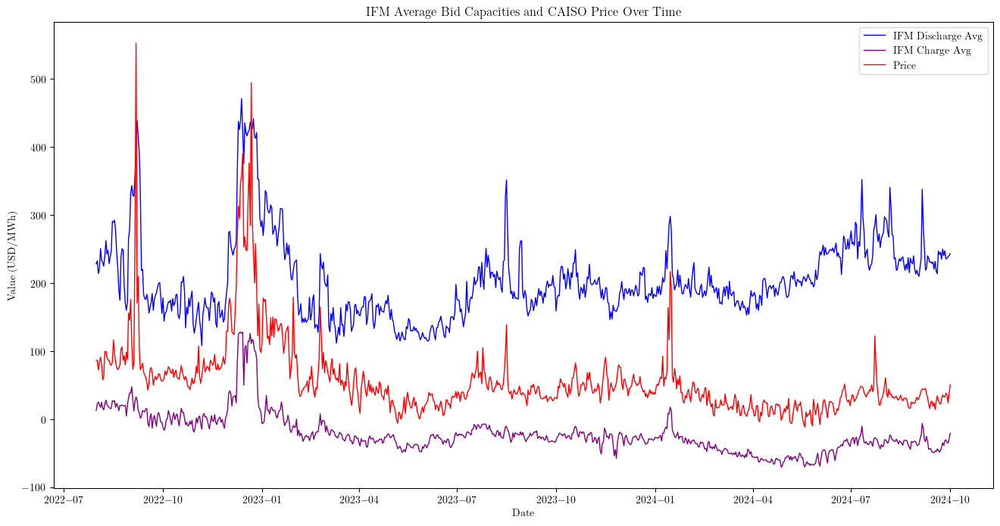

In [155]:
# Plot IFM average bid capacities and price
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot IFM Discharge and Charge average bid capacities
ax1.plot(
    df_weighted_daily.index,
    df_weighted_daily["bid_ifm_pos_avg"],
    label="IFM Discharge Avg",
    color="blue",
    linewidth=1,
)
ax1.plot(
    df_weighted_daily.index,
    df_weighted_daily["bid_ifm_neg_avg"],
    label="IFM Charge Avg",
    color="purple",
    linewidth=1,
)

# Plot price
ax1.plot(
    df_weighted_daily.index,
    df_weighted_daily["price"],
    label="Price",
    color="red",
    linewidth=1,
    alpha=1,
)

# Set title and labels for the y-axis
ax1.set_title("IFM Average Bid Capacities and CAISO Price Over Time")
ax1.set_xlabel("Date")
ax1.set_ylabel("Value (USD/MWh)")

# Add legend
ax1.legend(loc="upper right")

plt.show()

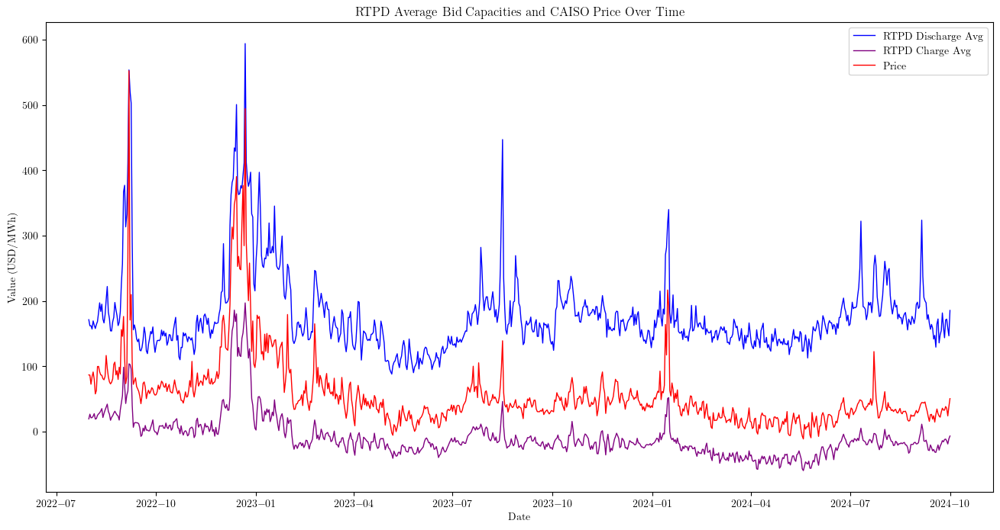

In [156]:
# Plot RTPD average bid capacities and price
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot RTPD Discharge and Charge average bid capacities
ax1.plot(
    df_weighted_daily.index,
    df_weighted_daily["bid_rtpd_pos_avg"],
    label="RTPD Discharge Avg",
    color="blue",
    linewidth=1,
)
ax1.plot(
    df_weighted_daily.index,
    df_weighted_daily["bid_rtpd_neg_avg"],
    label="RTPD Charge Avg",
    color="purple",
    linewidth=1,
)

# Plot price
ax1.plot(
    df_weighted_daily.index,
    df_weighted_daily["price"],
    label="Price",
    color="red",
    linewidth=1,
    alpha=1,
)

# Set title and labels for the y-axis
ax1.set_title("RTPD Average Bid Capacities and CAISO Price Over Time")
ax1.set_xlabel("Date")
ax1.set_ylabel("Value (USD/MWh)")

# Add legend
ax1.legend(loc="upper right")

plt.show()

In [157]:
print(df.resample(AGGREGATION_GRANULARITY).min())

            tot_energy_ifm  tot_energy_ruc  tot_energy_rtpd  tot_energy_rtd  \
datetime                                                                      
2022-07-31         -1400.0         -1400.0          -1161.0         -1205.0   
2022-08-01         -1014.0         -1014.0           -879.0          -839.0   
2022-08-02         -1341.0         -1341.0           -963.0          -956.0   
2022-08-03         -1211.0         -1211.0          -1256.0         -1156.0   
2022-08-04          -917.0          -917.0          -1055.0         -1180.0   
...                    ...             ...              ...             ...   
2024-09-27         -4396.0         -4396.0          -6046.0         -5658.0   
2024-09-28         -4593.0         -4593.0          -6255.0         -6045.0   
2024-09-29         -4761.0         -4761.0          -6266.0         -6392.0   
2024-09-30         -4798.0         -4798.0          -5559.0         -5684.0   
2024-10-01         -5463.0         -5463.0          

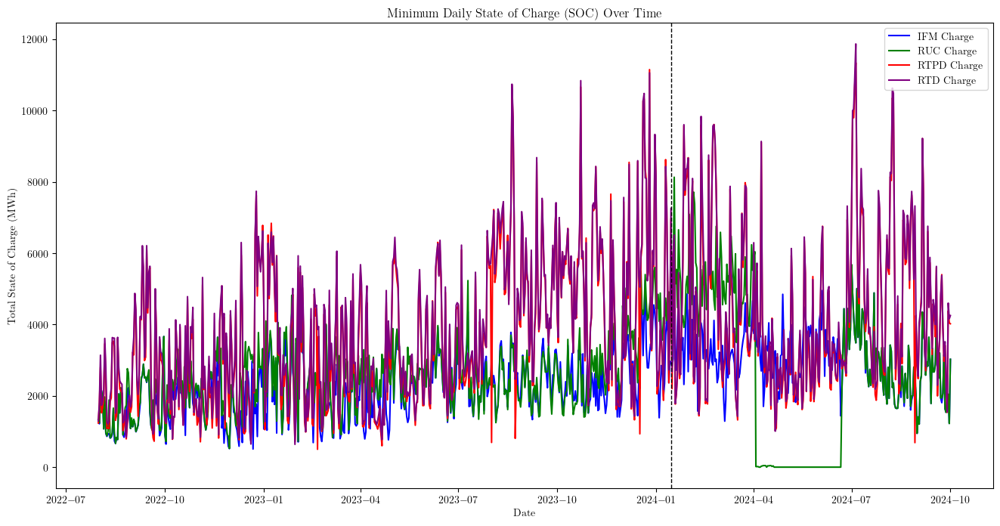

In [158]:
# Aggregate daily SOE
df_daily_soe = df.resample(AGGREGATION_GRANULARITY).min()

# # Filter for January 2024
# df_daily_soe = df_daily_soe.loc["2024-01-01":"2024-01-31"]

# Plot daily SOE
fig, ax = plt.subplots(figsize=(16, 8))

# Plot each SOE component
ax.plot(
    df_daily_soe.index, df_daily_soe["tot_charge_ifm"], label="IFM Charge", color="blue"
)
ax.plot(
    df_daily_soe.index,
    df_daily_soe["tot_charge_ruc"],
    label="RUC Charge",
    color="green",
)
ax.plot(
    df_daily_soe.index,
    df_daily_soe["tot_charge_rtpd"],
    label="RTPD Charge",
    color="red",
)
ax.plot(
    df_daily_soe.index,
    df_daily_soe["tot_charge_rtd"],
    label="RTD Charge",
    color="purple",
)

# Plot a vertical line on January 15, 2024
ax.axvline(pd.Timestamp("2024-01-15"), color="black", linestyle="--", linewidth=1)

# Set title and labels
ax.set_title("Minimum Daily State of Charge (SOC) Over Time")
ax.set_xlabel("Date")
ax.set_ylabel("Total State of Charge (MWh)")

# Add legend
ax.legend(loc="upper right")

plt.show()
# TODO: Check if the RUC SOC is scraped correctly between April-July 2024

## In-Depth Analysis since July 1, 2023

In [159]:
# filter to dates since July11, 2023
recent_df = df_weighted_daily[df_weighted_daily.index >= pd.Timestamp("2023-07-01")]
recent_df.columns

Index(['tot_energy_ifm', 'tot_energy_ruc', 'tot_energy_rtpd', 'tot_energy_rtd',
       'tot_charge_ifm', 'tot_charge_ruc', 'tot_charge_rtpd', 'tot_charge_rtd',
       'as_ru_ifm', 'as_rd_ifm', 'as_sr_ifm', 'as_nr_ifm', 'as_ru_rtpd',
       'as_rd_rtpd', 'as_sr_rtpd', 'as_nr_rtpd', 'tot_energy_hybrid_ifm',
       'tot_energy_hybrid_ruc', 'tot_energy_hybrid_rtpd',
       'tot_energy_hybrid_rtd', 'tot_charge_hybrid_ifm',
       'tot_charge_hybrid_ruc', 'tot_charge_hybrid_rtpd',
       'tot_charge_hybrid_rtd', 'as_ru_hybrid_ifm', 'as_rd_hybrid_ifm',
       'as_sr_hybrid_ifm', 'as_nr_hybrid_ifm', 'as_ru_hybrid_rtpd',
       'as_rd_hybrid_rtpd', 'as_sr_hybrid_rtpd', 'as_nr_hybrid_rtpd',
       'bid_ifm_pos_ss', 'bid_ifm_pos_1', 'bid_ifm_pos_2', 'bid_ifm_pos_3',
       'bid_ifm_pos_4', 'bid_ifm_pos_5', 'bid_ifm_pos_6', 'bid_ifm_pos_7',
       'bid_ifm_pos_8', 'bid_ifm_pos_9', 'bid_ifm_pos_10', 'bid_ifm_pos_11',
       'bid_ifm_neg_ss', 'bid_ifm_neg_1', 'bid_ifm_neg_2', 'bid_ifm_neg_3',
      

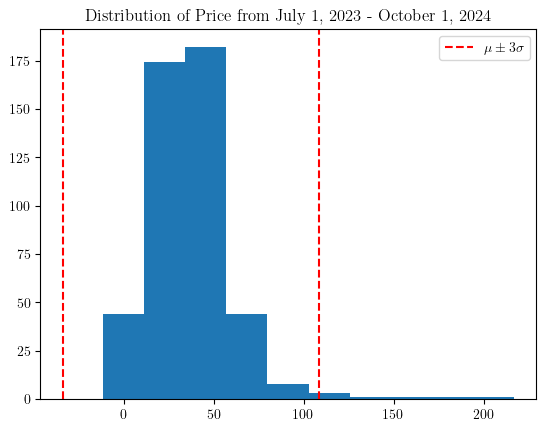

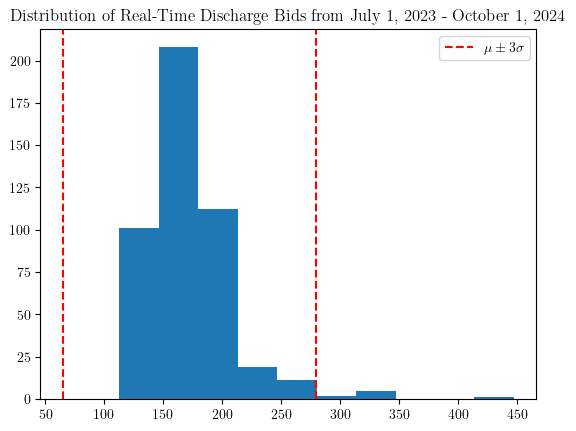

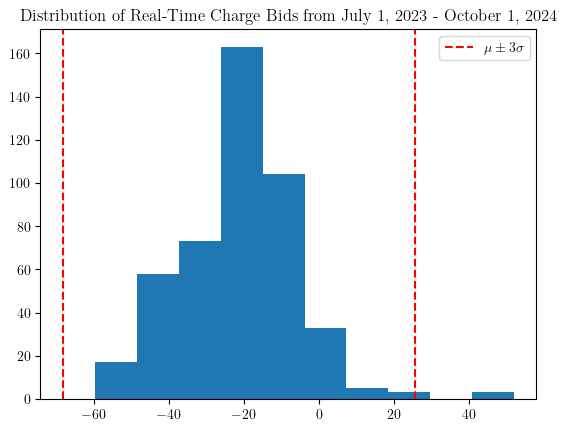

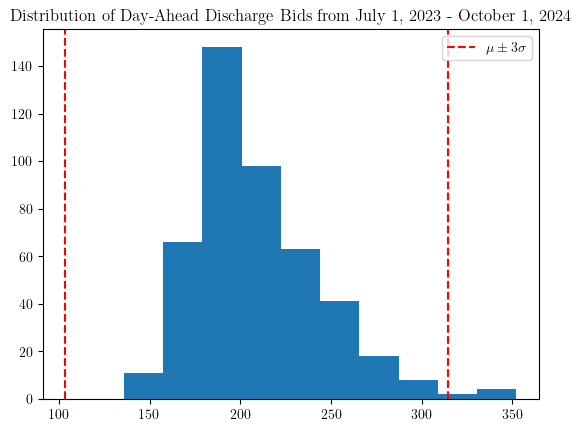

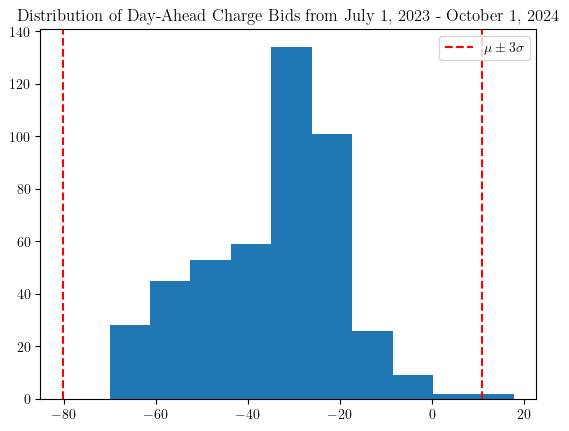

In [160]:
def plot_price_distribution(
    data: pd.DataFrame = None, interest_col: str = None, description: str = None
):
    plt.hist(data[interest_col])
    abnormality_threshold = np.mean(data[interest_col]) + 3 * np.std(data[interest_col])
    plt.axvline(
        x=abnormality_threshold, color="red", linestyle="--", label=r"$\mu \pm 3\sigma$"
    )
    abnormality_lower_threshold = np.mean(data[interest_col]) - 3 * np.std(
        data[interest_col]
    )
    plt.axvline(x=abnormality_lower_threshold, color="red", linestyle="--")
    plt.legend(loc="upper right")
    plt.title(f"Distribution of {description} from July 1, 2023 - October 1, 2024")
    plt.show()


cols = [
    "price",
    "bid_rtpd_pos_avg",
    "bid_rtpd_neg_avg",
    "bid_ifm_pos_avg",
    "bid_ifm_neg_avg",
]
desc = [
    "Price",
    "Real-Time Discharge Bids",
    "Real-Time Charge Bids",
    "Day-Ahead Discharge Bids",
    "Day-Ahead Charge Bids",
]
for col, d in zip(cols, desc):
    plot_price_distribution(recent_df, col, d)

[Timestamp('2023-07-20 00:00:00'), Timestamp('2023-07-25 00:00:00'), Timestamp('2023-08-15 00:00:00'), Timestamp('2023-08-16 00:00:00'), Timestamp('2023-11-16 00:00:00'), Timestamp('2024-01-08 00:00:00'), Timestamp('2024-01-13 00:00:00'), Timestamp('2024-01-14 00:00:00'), Timestamp('2024-01-15 00:00:00'), Timestamp('2024-01-16 00:00:00'), Timestamp('2024-07-23 00:00:00')]


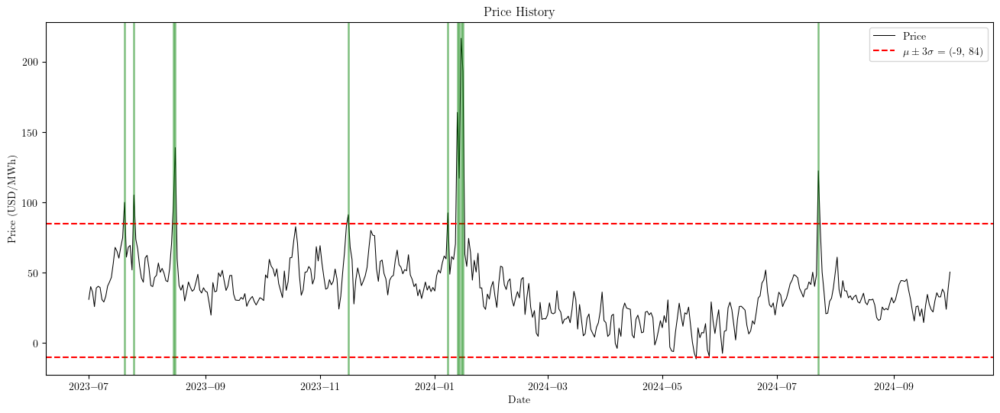

[Timestamp('2023-07-27 00:00:00'), Timestamp('2023-07-28 00:00:00'), Timestamp('2023-08-14 00:00:00'), Timestamp('2023-08-15 00:00:00'), Timestamp('2023-08-16 00:00:00'), Timestamp('2023-08-28 00:00:00'), Timestamp('2024-01-13 00:00:00'), Timestamp('2024-01-14 00:00:00'), Timestamp('2024-01-15 00:00:00'), Timestamp('2024-01-16 00:00:00'), Timestamp('2024-07-10 00:00:00'), Timestamp('2024-07-11 00:00:00'), Timestamp('2024-07-12 00:00:00'), Timestamp('2024-07-23 00:00:00'), Timestamp('2024-07-24 00:00:00'), Timestamp('2024-07-25 00:00:00'), Timestamp('2024-08-02 00:00:00'), Timestamp('2024-08-03 00:00:00'), Timestamp('2024-08-05 00:00:00'), Timestamp('2024-08-06 00:00:00'), Timestamp('2024-09-04 00:00:00'), Timestamp('2024-09-05 00:00:00')]


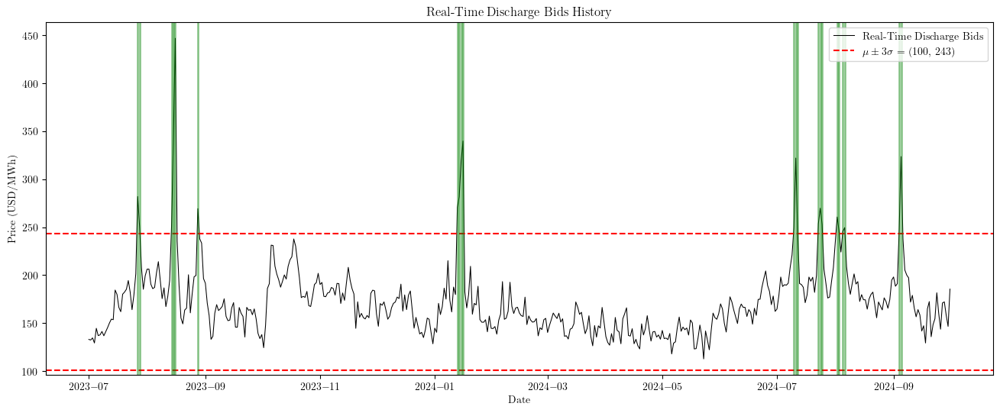

[Timestamp('2023-07-27 00:00:00'), Timestamp('2023-08-15 00:00:00'), Timestamp('2023-08-16 00:00:00'), Timestamp('2023-10-19 00:00:00'), Timestamp('2024-01-13 00:00:00'), Timestamp('2024-01-14 00:00:00'), Timestamp('2024-01-15 00:00:00'), Timestamp('2024-01-16 00:00:00'), Timestamp('2024-09-05 00:00:00')]


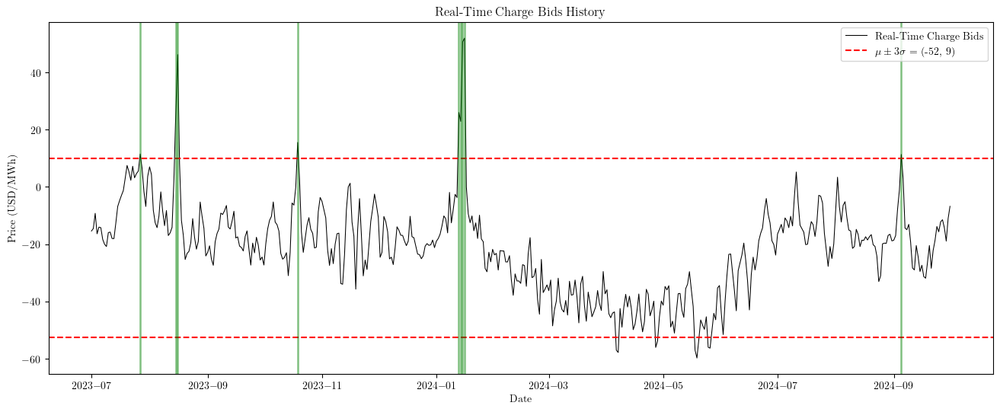

[Timestamp('2023-08-15 00:00:00'), Timestamp('2023-08-16 00:00:00'), Timestamp('2024-01-14 00:00:00'), Timestamp('2024-01-15 00:00:00'), Timestamp('2024-07-05 00:00:00'), Timestamp('2024-07-06 00:00:00'), Timestamp('2024-07-10 00:00:00'), Timestamp('2024-07-11 00:00:00'), Timestamp('2024-07-12 00:00:00'), Timestamp('2024-07-23 00:00:00'), Timestamp('2024-07-24 00:00:00'), Timestamp('2024-08-01 00:00:00'), Timestamp('2024-08-02 00:00:00'), Timestamp('2024-08-03 00:00:00'), Timestamp('2024-08-06 00:00:00'), Timestamp('2024-08-07 00:00:00'), Timestamp('2024-09-05 00:00:00'), Timestamp('2024-09-06 00:00:00')]


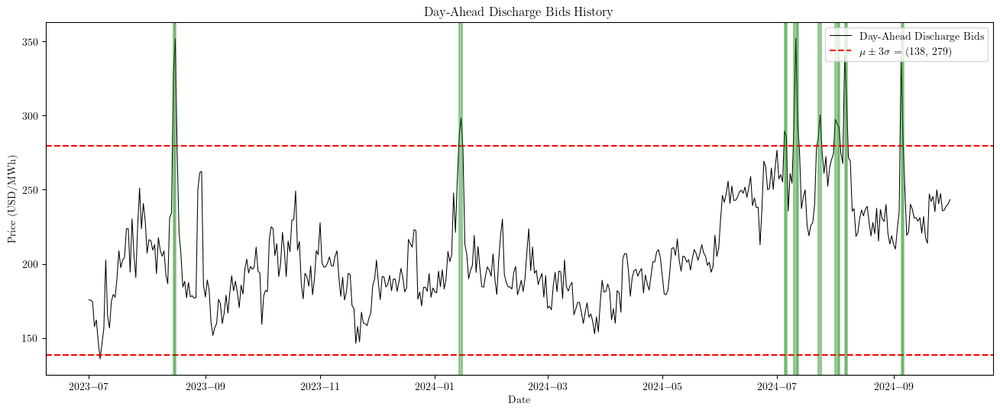

[Timestamp('2024-01-13 00:00:00'), Timestamp('2024-01-14 00:00:00'), Timestamp('2024-01-15 00:00:00'), Timestamp('2024-01-16 00:00:00')]


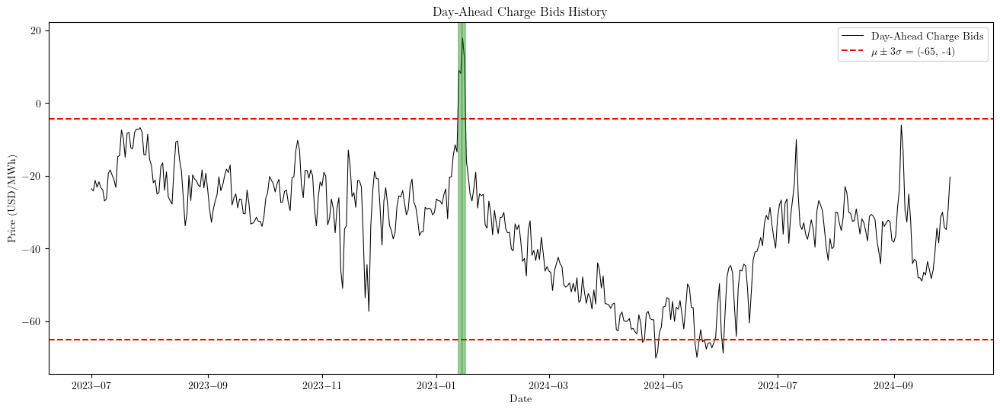

In [197]:
def plot_price_history(
    data: pd.DataFrame = None, interest_col: str = None, description: str = None
):
    # Plot price history with abnormality threshold
    fig, ax = plt.subplots(figsize=(16, 6))

    # Plot the price history
    ax.plot(
        data.index, data[interest_col], label=description, color="black", linewidth=0.75
    )

    abnormality_threshold = np.mean(data[interest_col]) + 2 * np.std(data[interest_col])
    abnormality_lower_threshold = np.mean(data[interest_col]) - 2 * np.std(
        data[interest_col]
    )

    # Plot the horizontal line at abnormality_threshold
    ax.axhline(
        y=abnormality_threshold,
        color="red",
        linestyle="--",
        label=rf"$\mu \pm 3\sigma$ = ({int(abnormality_lower_threshold)}, {int(abnormality_threshold)})",
    )
    ax.axhline(
        y=abnormality_lower_threshold,
        color="red",
        linestyle="--",
        # label=rf"$\mu - 3\sigma$ = {int(abnormality_lower_threshold)}",
    )

    # Plot vertical lines at dates where price exceeds abnormality_threshold
    exceed_dates = data[data[interest_col] > abnormality_threshold].index
    for date in exceed_dates:
        ax.axvline(x=date, color="green", linestyle="-", alpha=0.5, linewidth=1.8)

    # Set title and labels
    ax.set_title(f"{description} History")
    ax.set_xlabel("Date")
    ax.set_ylabel("Price (USD/MWh)")

    # Add legend
    ax.legend(loc="upper right")
    print(list(exceed_dates))

    plt.show()


cols = [
    "price",
    "bid_rtpd_pos_avg",
    "bid_rtpd_neg_avg",
    "bid_ifm_pos_avg",
    "bid_ifm_neg_avg",
]
desc = [
    "Price",
    "Real-Time Discharge Bids",
    "Real-Time Charge Bids",
    "Day-Ahead Discharge Bids",
    "Day-Ahead Charge Bids",
]
for col, d in zip(cols, desc):
    plot_price_history(recent_df, col, d)

In [162]:
def plot_bids_filtered(
    data: pd.DataFrame = None,
    upper_threshold: float = None,
    lower_threshold: float = None,
    start_date: pd.Timestamp = None,
    end_date: pd.Timestamp = None,
    filter_col: str = "price",
    description: str = "",
):

    # filter data for only rows we want in this plot
    filtered_df = data.copy()
    if upper_threshold != None:
        filtered_df = filtered_df[filtered_df[filter_col] <= upper_threshold]
    if lower_threshold != None:
        filtered_df = filtered_df[filtered_df[filter_col] >= lower_threshold]
    if start_date != None:
        filtered_df = filtered_df[filtered_df.index >= start_date]
    if end_date != None:
        filtered_df = filtered_df[filtered_df.index <= end_date]

    # Calculate the average bid distribution for the remaining days
    average_bid_distribution = filtered_df.mean()

    # Extract the relevant columns and align segments by suffix

    suffixes = ["ss"] + [str(i) for i in range(1, 12)]
    x_markers = [bid_segments[s] for s in suffixes]

    rtpd_pos_columns = [f"bid_rtpd_pos_{suffix}" for suffix in suffixes]
    rtpd_neg_columns = [f"bid_rtpd_neg_{suffix}" for suffix in suffixes]
    ifm_pos_columns = [f"bid_ifm_pos_{suffix}" for suffix in suffixes]
    ifm_neg_columns = [f"bid_ifm_neg_{suffix}" for suffix in suffixes]

    max_y_lim = max(
        max(
            average_bid_distribution[rtpd_pos_columns]
            / average_bid_distribution["bid_rtpd_pos_tot"]
        ),
        max(
            average_bid_distribution[ifm_pos_columns]
            / average_bid_distribution["bid_ifm_pos_tot"]
        ),
        max(
            average_bid_distribution[rtpd_neg_columns]
            / average_bid_distribution["bid_rtpd_neg_tot"]
        ),
        max(
            average_bid_distribution[ifm_neg_columns]
            / average_bid_distribution["bid_ifm_neg_tot"]
        ),
    )

    max_y_lim = math.ceil(max_y_lim * 10) / 10
    max_y_lim = 0.5

    # Create a 2x2 figure

    fig, axs = plt.subplots(
        2, 2, figsize=(12, 8), sharex=True, sharey=False, gridspec_kw={"hspace": 0}
    )

    # Plot the stacked distribution for RTPD Discharge bids

    (
        average_bid_distribution[rtpd_pos_columns]
        / average_bid_distribution["bid_rtpd_pos_tot"]
    ).plot(kind="bar", stacked=True, ax=axs[0, 0], width=1.0)

    axs[0, 0].set_xlabel("Bid Segments")

    axs[0, 0].set_ylabel("Discharge Bid Seg. Prop.")

    axs[0, 0].set_ylim((0, max_y_lim))

    axs[0, 0].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)

    axs[0, 0].grid(True, which="both", axis="x", linestyle="--", linewidth=0.5)

    print(
        "RTPD Discharge Witheld:",
        str(
            (
                average_bid_distribution["bid_rtpd_pos_9"]
                + average_bid_distribution["bid_rtpd_pos_10"]
            )
            / average_bid_distribution["bid_rtpd_pos_tot"]
        ),
    )
    print(
        "IFM Discharge Witheld:",
        str(
            (
                average_bid_distribution["bid_ifm_pos_9"]
                + average_bid_distribution["bid_ifm_pos_10"]
            )
            / average_bid_distribution["bid_ifm_pos_tot"]
        ),
    )
    print(
        "RTPD Charge Discharge:",
        str(
            (
                average_bid_distribution["bid_rtpd_neg_5"]
                + average_bid_distribution["bid_rtpd_neg_6"]
                + average_bid_distribution["bid_rtpd_neg_7"]
                + average_bid_distribution["bid_rtpd_neg_8"]
                + average_bid_distribution["bid_rtpd_neg_9"]
                + average_bid_distribution["bid_rtpd_neg_10"]
                + average_bid_distribution["bid_rtpd_neg_11"]
            )
            / average_bid_distribution["bid_rtpd_neg_tot"]
        ),
    )
    print(
        "IFM Charge Discharge:",
        str(
            (
                average_bid_distribution["bid_ifm_neg_5"]
                + average_bid_distribution["bid_ifm_neg_6"]
                + average_bid_distribution["bid_ifm_neg_7"]
                + average_bid_distribution["bid_ifm_neg_8"]
                + average_bid_distribution["bid_ifm_neg_9"]
                + average_bid_distribution["bid_ifm_neg_10"]
                + average_bid_distribution["bid_ifm_neg_11"]
            )
            / average_bid_distribution["bid_ifm_neg_tot"]
        ),
    )

    print()
    print(
        "RTPD Discharge Ratio:",
        average_bid_distribution["bid_rtpd_pos_avg"]
        / average_bid_distribution["price"],
    )
    print(
        "IFM Discharge Ratio:",
        average_bid_distribution["bid_ifm_pos_avg"] / average_bid_distribution["price"],
    )
    print(
        "RTPD Charge Ratio:",
        average_bid_distribution["bid_rtpd_neg_avg"]
        / average_bid_distribution["price"],
    )
    print(
        "IFM Charge Ratio:",
        average_bid_distribution["bid_ifm_neg_avg"] / average_bid_distribution["price"],
    )

    print()
    print(
        "RTPD Discharge Difference:",
        average_bid_distribution["bid_rtpd_pos_avg"]
        - average_bid_distribution["price"],
    )
    print(
        "IFM Discharge Difference:",
        average_bid_distribution["bid_ifm_pos_avg"] - average_bid_distribution["price"],
    )
    print(
        "RTPD Charge Difference:",
        average_bid_distribution["bid_rtpd_neg_avg"]
        - average_bid_distribution["price"],
    )
    print(
        "IFM Charge Difference:",
        average_bid_distribution["bid_ifm_neg_avg"] - average_bid_distribution["price"],
    )
    print()
    print("Average RTPD Discharge Bid:", average_bid_distribution["bid_rtpd_pos_avg"])
    print("Average IFM Discharge Bid:", average_bid_distribution["bid_ifm_pos_avg"])
    print("Average RTPD Charge Bid:", average_bid_distribution["bid_rtpd_neg_avg"])
    print("Average IFM Charge Bid:", average_bid_distribution["bid_ifm_neg_avg"])
    print("Average Price:", average_bid_distribution["price"])

    # calculate the weighted average price excluding segment 10 and 11
    # Calculate the weighted average bid price excluding self-schedule and segments 10 and 11
    def weighted_avg_price(bid_columns, weights, total_bid):
        return sum(bid_columns * weights) / total_bid

    # Define the columns and weights for IFM and RTPD Discharge and Charge segments excluding self-schedule and segments 10 and 11
    ifm_pos_columns_excl = average_bid_distribution[
        [f"bid_ifm_pos_{i}" for i in range(1, 10)]
    ]
    ifm_neg_columns_excl = average_bid_distribution[
        [f"bid_ifm_neg_{i}" for i in range(1, 10)]
    ]
    rtpd_pos_columns_excl = average_bid_distribution[
        [f"bid_rtpd_pos_{i}" for i in range(1, 10)]
    ]
    rtpd_neg_columns_excl = average_bid_distribution[
        [f"bid_rtpd_neg_{i}" for i in range(1, 10)]
    ]

    # Calculate the weighted average prices
    weighted_avg_ifm_pos = weighted_avg_price(
        ifm_pos_columns_excl,
        bid_segment_weights[:9],
        average_bid_distribution["bid_ifm_pos_tot"],
    )
    weighted_avg_ifm_neg = weighted_avg_price(
        ifm_neg_columns_excl,
        bid_segment_weights[:9],
        average_bid_distribution["bid_ifm_neg_tot"],
    )
    weighted_avg_rtpd_pos = weighted_avg_price(
        rtpd_pos_columns_excl,
        bid_segment_weights[:9],
        average_bid_distribution["bid_rtpd_pos_tot"],
    )
    weighted_avg_rtpd_neg = weighted_avg_price(
        rtpd_neg_columns_excl,
        bid_segment_weights[:9],
        average_bid_distribution["bid_rtpd_neg_tot"],
    )

    print()
    print("Weighted Average RTPD Discharge Bid Price:", weighted_avg_rtpd_pos)
    print("Weighted Average IFM Discharge Bid Price:", weighted_avg_ifm_pos)
    print("Weighted Average RTPD Charge Bid Price:", weighted_avg_rtpd_neg)
    print("Weighted Average IFM Charge Bid Price:", weighted_avg_ifm_neg)

    # Plot the stacked distribution for IFM Discharge bids

    (
        average_bid_distribution[ifm_pos_columns]
        / average_bid_distribution["bid_ifm_pos_tot"]
    ).plot(kind="bar", stacked=True, ax=axs[0, 1], width=1.0)

    axs[0, 1].set_ylim((0, max_y_lim))

    axs[0, 1].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)

    axs[0, 1].grid(True, which="both", axis="x", linestyle="--", linewidth=0.5)

    # Plot the stacked distribution for RTPD Charge bids

    (
        average_bid_distribution[rtpd_neg_columns]
        / average_bid_distribution["bid_rtpd_neg_tot"]
    ).plot(kind="bar", stacked=True, ax=axs[1, 0], width=1.0)

    axs[1, 0].set_xlabel("RTPD Bid Segments")

    axs[1, 0].set_ylabel("Charge Bid Seg. Prop.")

    axs[1, 0].invert_yaxis()

    axs[1, 0].set_ylim((max_y_lim, 0))

    axs[1, 0].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)

    axs[1, 0].grid(True, which="both", axis="x", linestyle="--", linewidth=0.5)

    # Plot the stacked distribution for IFM Charge bids

    (
        average_bid_distribution[ifm_neg_columns]
        / average_bid_distribution["bid_ifm_neg_tot"]
    ).plot(kind="bar", stacked=True, ax=axs[1, 1], width=1.0)

    axs[1, 1].set_xlabel("IFM Bid Segments")

    axs[1, 1].invert_yaxis()

    axs[1, 1].set_ylim((max_y_lim, 0))

    axs[1, 1].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)

    axs[1, 1].grid(True, which="both", axis="x", linestyle="--", linewidth=0.5)

    if description != "":
        description = " for " + description

    fig.suptitle(f"RTPD and IFM Bid Segment Composition {description}")

    plt.xticks(np.arange(0, 12), x_markers)

    plt.tight_layout()

    plt.show()

RTPD Discharge Witheld: 0.18289731505735252
IFM Discharge Witheld: 0.2604351828680362
RTPD Charge Discharge: 0.47472106535588376
IFM Charge Discharge: 0.39383476769935133

RTPD Discharge Ratio: 4.85514333993178
IFM Discharge Ratio: 5.947954449304743
RTPD Charge Ratio: -0.6424106737417165
IFM Charge Ratio: -1.0132721900193933

RTPD Discharge Difference: 134.48924182949833
IFM Discharge Difference: 172.61268487766876
RTPD Charge Difference: -57.29658972631293
IFM Charge Difference: -70.23434060869789

Average RTPD Discharge Bid: 169.37490754170454
Average IFM Discharge Bid: 207.49835058987497
Average RTPD Charge Bid: -22.4109240141067
Average IFM Charge Bid: -35.348674896491666
Average Price: 34.88566571220623

Weighted Average RTPD Discharge Bid Price: 63.03696288751018
Weighted Average IFM Discharge Bid Price: 57.38135859653729
Weighted Average RTPD Charge Bid Price: -24.939654076668344
Weighted Average IFM Charge Bid Price: -36.92857587378424


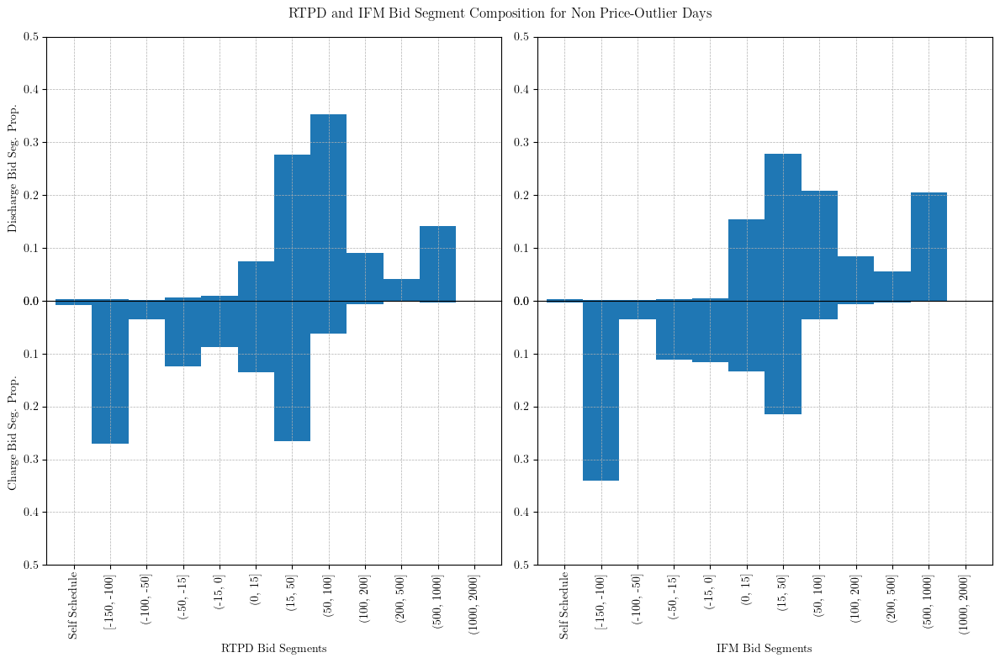

RTPD Discharge Witheld: 0.6571052208041074
IFM Discharge Witheld: 0.4882186841223822
RTPD Charge Discharge: 0.6158416151010883
IFM Charge Discharge: 0.5196487730810692

RTPD Discharge Ratio: 3.21610450694494
IFM Discharge Ratio: 2.5295399902607385
RTPD Charge Ratio: 0.3323346433428035
IFM Charge Ratio: -0.07522914788761205

RTPD Discharge Difference: 308.0048353209302
IFM Discharge Difference: 212.582805251585
RTPD Charge Difference: -92.79533414702779
IFM Charge Difference: -149.44050498951324

Average RTPD Discharge Bid: 446.9896324528747
Average IFM Discharge Bid: 351.56760238352945
Average RTPD Charge Bid: 46.18946298491666
Average IFM Charge Bid: -10.455707857568807
Average Price: 138.98479713194445

Weighted Average RTPD Discharge Bid Price: 98.61476443193277
Weighted Average IFM Discharge Bid Price: 111.76189197122562
Weighted Average RTPD Charge Bid Price: 15.851325904980587
Weighted Average IFM Charge Bid Price: -10.986183929903614


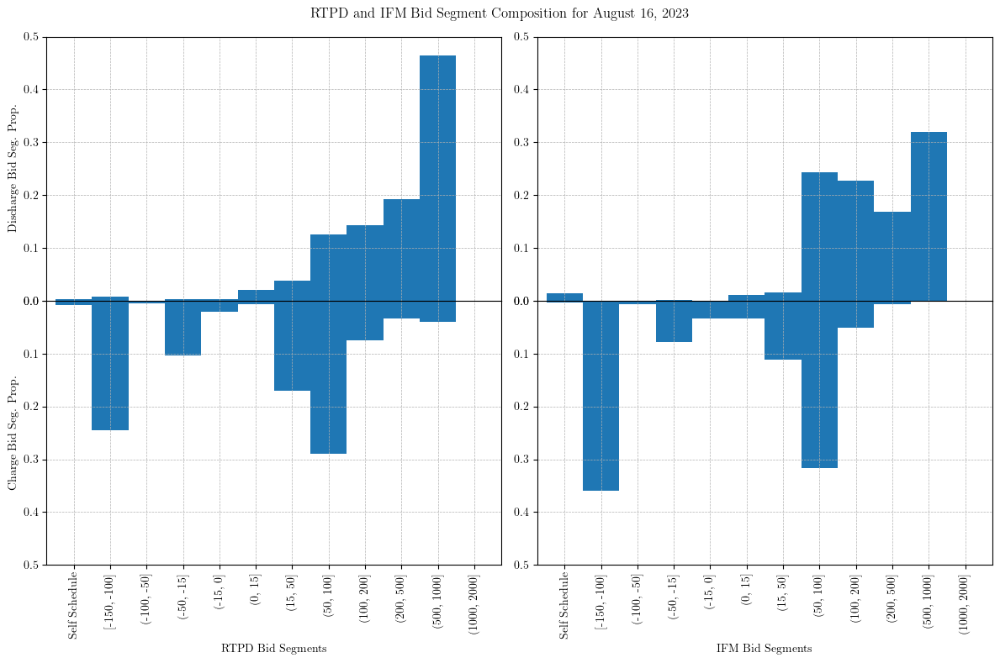

RTPD Discharge Witheld: 0.5633876633995721
IFM Discharge Witheld: 0.42580808189585245
RTPD Charge Discharge: 0.6237466838239905
IFM Charge Discharge: 0.5872139000419877

RTPD Discharge Ratio: 1.7520269210294481
IFM Discharge Ratio: 1.6189131453770904
RTPD Charge Ratio: 0.21913766595483186
IFM Charge Ratio: 0.067830566005733

RTPD Discharge Difference: 129.92267669994524
IFM Discharge Difference: 106.92549727089514
RTPD Charge Difference: -134.90437873479047
IFM Charge Difference: -161.04469749117615

Average RTPD Discharge Bid: 302.6860087919591
Average IFM Discharge Bid: 279.688829362909
Average RTPD Charge Bid: 37.85895335722342
Average IFM Charge Bid: 11.718634600837719
Average Price: 172.76333209201388

Weighted Average RTPD Discharge Bid Price: 212.71785063354278
Weighted Average IFM Discharge Bid Price: 133.4440628586326
Weighted Average RTPD Charge Bid Price: 35.633616111800414
Weighted Average IFM Charge Bid Price: 11.731453458744191


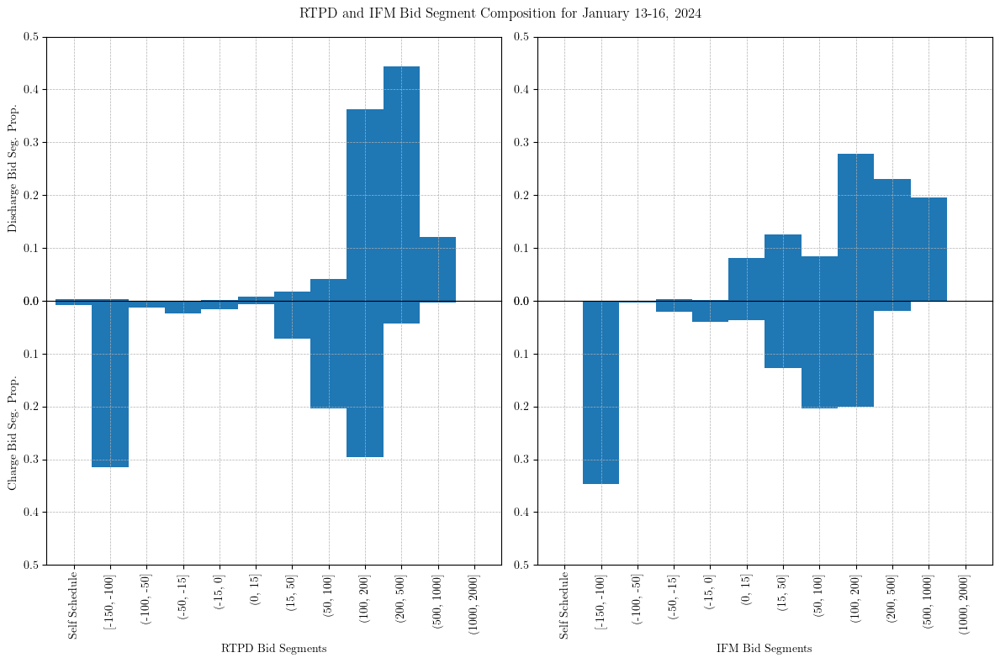

RTPD Discharge Witheld: 0.3623502407984292
IFM Discharge Witheld: 0.3830462314623965
RTPD Charge Discharge: 0.6292177140858565
IFM Charge Discharge: 0.49689405411569165

RTPD Discharge Ratio: 2.070632061758798
IFM Discharge Ratio: 2.325352219413688
RTPD Charge Ratio: -0.023937973641060765
IFM Charge Ratio: -0.2192188216415095

RTPD Discharge Difference: 131.1242880473814
IFM Discharge Difference: 162.32081252745894
RTPD Charge Difference: -125.40548951784571
IFM Charge Difference: -149.32226081393688

Average RTPD Discharge Bid: 253.5980049580957
Average IFM Discharge Bid: 284.79452943817324
Average RTPD Charge Bid: -2.9317726071314167
Average IFM Charge Bid: -26.848543903222602
Average Price: 122.47371691071429

Weighted Average RTPD Discharge Bid Price: 118.31655247908384
Weighted Average IFM Discharge Bid Price: 71.711613425702
Weighted Average RTPD Charge Bid Price: -5.9073832521803356
Weighted Average IFM Charge Bid Price: -26.953116525788417


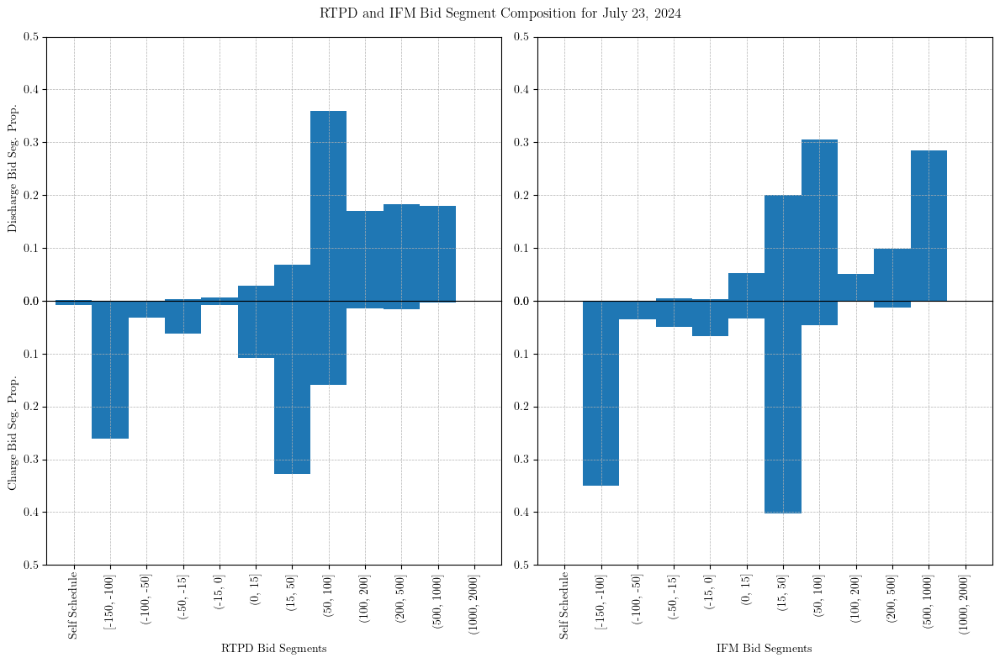

In [163]:
# Average days
plot_bids_filtered(
    data=recent_df,
    upper_threshold=np.mean(df_filtered.price) + 3 * np.std(df_filtered.price),
    lower_threshold=np.mean(df_filtered.price) - 3 * np.std(df_filtered.price),
    filter_col="price",
    description="Non Price-Outlier Days",
)

# Price spike days
plot_bids_filtered(
    data=recent_df,
    start_date=pd.Timestamp("August 16, 2023"),
    end_date=pd.Timestamp("August 16, 2023"),
    filter_col="price",
    description="August 16, 2023",
)
plot_bids_filtered(
    data=recent_df,
    start_date=pd.Timestamp("January 13, 2024"),
    end_date=pd.Timestamp("January 16, 2024"),
    filter_col="price",
    description="January 13-16, 2024",
)
plot_bids_filtered(
    data=recent_df,
    start_date=pd.Timestamp("July 23, 2024"),
    end_date=pd.Timestamp("July 23, 2024"),
    filter_col="price",
    description="July 23, 2024",
)

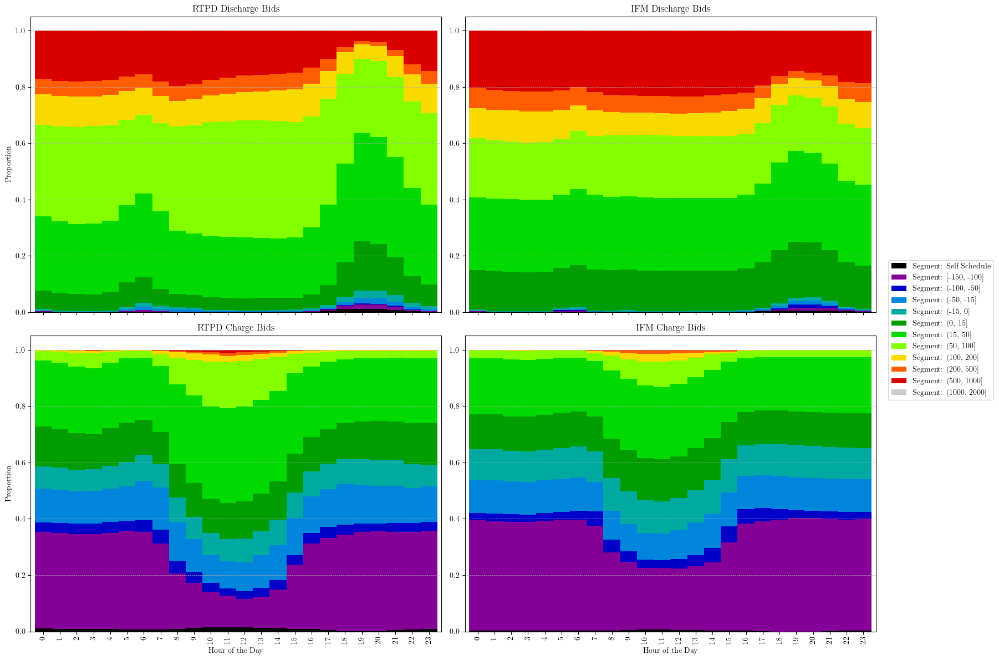

In [164]:
# Filter data since July 1, 2023
df_filtered_hourly = df[df.index >= pd.Timestamp("2023-07-01")]

# Resample data to hourly frequency
df_hourly = df_filtered_hourly.resample("h").mean()

# Extract hour of the day
df_hourly["hour"] = df_hourly.index.hour

# Group by hour and calculate mean for each hour
df_hourly_grouped = df_hourly.groupby("hour").mean()

# Define bid segment columns
suffixes = ["ss"] + [str(i) for i in range(1, 12)]
rtpd_pos_columns = [f"bid_rtpd_pos_{suffix}" for suffix in suffixes]
rtpd_neg_columns = [f"bid_rtpd_neg_{suffix}" for suffix in suffixes]
ifm_pos_columns = [f"bid_ifm_pos_{suffix}" for suffix in suffixes]
ifm_neg_columns = [f"bid_ifm_neg_{suffix}" for suffix in suffixes]

# Plot stacked distributions
fig, axs = plt.subplots(2, 2, figsize=(16, 12), sharex=True)

cmap_selection = "nipy_spectral"

# RTPD Discharge bids
df_hourly_grouped[rtpd_pos_columns].div(
    df_hourly_grouped[rtpd_pos_columns].sum(axis=1), axis=0
).plot(kind="bar", stacked=True, ax=axs[0, 0], width=1.0, colormap=cmap_selection)
axs[0, 0].set_title("RTPD Discharge Bids")
axs[0, 0].set_ylabel("Proportion")
axs[0, 0].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)

# RTPD Charge bids
df_hourly_grouped[rtpd_neg_columns].div(
    df_hourly_grouped[rtpd_neg_columns].sum(axis=1), axis=0
).plot(kind="bar", stacked=True, ax=axs[1, 0], width=1.0, colormap=cmap_selection)
axs[1, 0].set_title("RTPD Charge Bids")
axs[1, 0].set_ylabel("Proportion")
axs[1, 0].set_xlabel("Hour of the Day")
axs[1, 0].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)

# IFM Discharge bids
df_hourly_grouped[ifm_pos_columns].div(
    df_hourly_grouped[ifm_pos_columns].sum(axis=1), axis=0
).plot(kind="bar", stacked=True, ax=axs[0, 1], width=1.0, colormap=cmap_selection)
axs[0, 1].set_title("IFM Discharge Bids")
axs[0, 1].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)

# IFM Charge bids
df_hourly_grouped[ifm_neg_columns].div(
    df_hourly_grouped[ifm_neg_columns].sum(axis=1), axis=0
).plot(kind="bar", stacked=True, ax=axs[1, 1], width=1.0, colormap=cmap_selection)
axs[1, 1].set_title("IFM Charge Bids")
axs[1, 1].set_xlabel("Hour of the Day")
axs[1, 1].grid(True, which="both", axis="y", linestyle="--", linewidth=0.5)

# Create a single legend
handles, labels = axs[0, 0].get_legend_handles_labels()
for ax in axs.flat:
    ax.legend().remove()
legend_labels = [f"Segment: {bid_segments[suffix]}" for suffix in suffixes]
fig.legend(handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5))

plt.tight_layout()
plt.show()

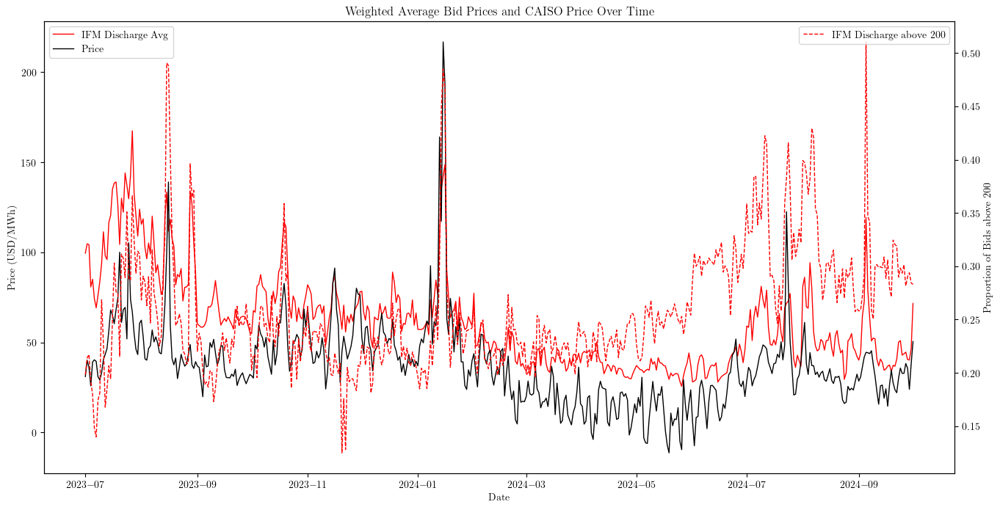

In [182]:
# Filter data since July 1, 2023
df_filtered = recent_df.copy()

# Calculate the weighted average bid price for IFM and RTPD
df_filtered["weighted_avg_ifm_pos"] = (
    df_filtered[[f"bid_ifm_pos_{i}" for i in range(1, 10)]].dot(bid_segment_weights[:9])
    / df_filtered["bid_ifm_pos_tot"]
)
df_filtered["weighted_avg_ifm_neg"] = (
    df_filtered[[f"bid_ifm_neg_{i}" for i in range(1, 10)]].dot(bid_segment_weights[:9])
    / df_filtered["bid_ifm_neg_tot"]
)
df_filtered["weighted_avg_rtpd_pos"] = (
    df_filtered[[f"bid_rtpd_pos_{i}" for i in range(1, 10)]].dot(
        bid_segment_weights[:9]
    )
    / df_filtered["bid_rtpd_pos_tot"]
)
df_filtered["weighted_avg_rtpd_neg"] = (
    df_filtered[[f"bid_rtpd_neg_{i}" for i in range(1, 10)]].dot(
        bid_segment_weights[:9]
    )
    / df_filtered["bid_rtpd_neg_tot"]
)

# Calculate the proportion of bids in segment 9 and 10
df_filtered["ifm_pos_segment_9_10"] = (
    df_filtered["bid_ifm_pos_9"] + df_filtered["bid_ifm_pos_10"]
) / df_filtered["bid_ifm_pos_tot"]
df_filtered["ifm_neg_segment_9_10"] = (
    df_filtered["bid_ifm_neg_9"] + df_filtered["bid_ifm_neg_10"]
) / df_filtered["bid_ifm_neg_tot"]
df_filtered["rtpd_pos_segment_9_10"] = (
    df_filtered["bid_rtpd_pos_9"] + df_filtered["bid_rtpd_pos_10"]
) / df_filtered["bid_rtpd_pos_tot"]
df_filtered["rtpd_neg_segment_9_10"] = (
    df_filtered["bid_rtpd_neg_9"] + df_filtered["bid_rtpd_neg_10"]
) / df_filtered["bid_rtpd_neg_tot"]

# Plot the data
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot weighted average bid prices and price
ax1.plot(
    df_filtered.index,
    df_filtered["weighted_avg_ifm_pos"],
    label="IFM Discharge Avg",
    color="red",
    linewidth=1,
)
# ax1.plot(
#     df_filtered.index,
#     df_filtered["weighted_avg_ifm_neg"],
#     label="IFM Charge Avg",
#     color="purple",
#     linewidth=1,
# )
ax1.plot(
    df_filtered.index,
    df_filtered["price"],
    label="Price",
    color="black",
    linewidth=1,
    alpha=1,
)

# Set title and labels for the y-axis
ax1.set_title("Weighted Average Bid Prices and CAISO Price Over Time")
ax1.set_xlabel("Date")
ax1.set_ylabel("Price (USD/MWh)")

# Add legend
ax1.legend(loc="upper left")

# Create a twin axis to plot the proportion of bids in segment 9 and 10
ax2 = ax1.twinx()
ax2.plot(
    df_filtered.index,
    df_filtered["ifm_pos_segment_9_10"],
    label="IFM Discharge above 200",
    color="red",
    linestyle="--",
    linewidth=1,
)
# ax2.plot(
#     df_filtered.index,
#     df_filtered["ifm_neg_segment_9_10"],
#     label="IFM Charge above 200",
#     color="purple",
#     linestyle="--",
#     linewidth=1,
# )

# Set labels for the twin y-axis
ax2.set_ylabel("Proportion of Bids above 200")

# Add legend for the twin axis
ax2.legend(loc="upper right")

plt.show()

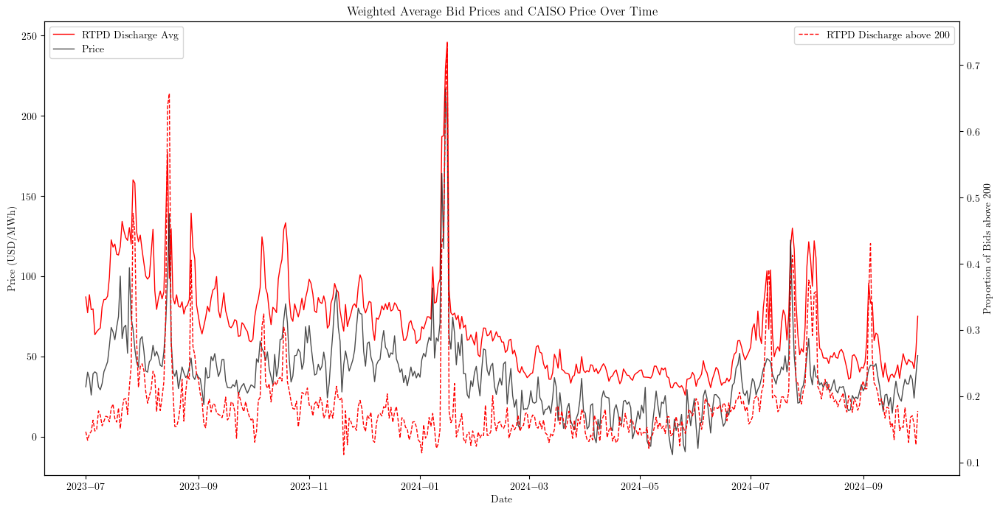

In [181]:
# Filter data since July 1, 2023
df_filtered = recent_df.copy()

# Calculate the weighted average bid price for IFM and RTPD
df_filtered["weighted_avg_ifm_pos"] = (
    df_filtered[[f"bid_ifm_pos_{i}" for i in range(1, 10)]].dot(bid_segment_weights[:9])
    / df_filtered["bid_ifm_pos_tot"]
)
df_filtered["weighted_avg_ifm_neg"] = (
    df_filtered[[f"bid_ifm_neg_{i}" for i in range(1, 10)]].dot(bid_segment_weights[:9])
    / df_filtered["bid_ifm_neg_tot"]
)
df_filtered["weighted_avg_rtpd_pos"] = (
    df_filtered[[f"bid_rtpd_pos_{i}" for i in range(1, 10)]].dot(
        bid_segment_weights[:9]
    )
    / df_filtered["bid_rtpd_pos_tot"]
)
df_filtered["weighted_avg_rtpd_neg"] = (
    df_filtered[[f"bid_rtpd_neg_{i}" for i in range(1, 10)]].dot(
        bid_segment_weights[:9]
    )
    / df_filtered["bid_rtpd_neg_tot"]
)

# Calculate the proportion of bids in segment 9 and 10
df_filtered["ifm_pos_segment_9_10"] = (
    df_filtered["bid_ifm_pos_9"] + df_filtered["bid_ifm_pos_10"]
) / df_filtered["bid_ifm_pos_tot"]
df_filtered["ifm_neg_segment_9_10"] = (
    df_filtered["bid_ifm_neg_9"] + df_filtered["bid_ifm_neg_10"]
) / df_filtered["bid_ifm_neg_tot"]
df_filtered["rtpd_pos_segment_9_10"] = (
    df_filtered["bid_rtpd_pos_9"] + df_filtered["bid_rtpd_pos_10"]
) / df_filtered["bid_rtpd_pos_tot"]
df_filtered["rtpd_neg_segment_9_10"] = (
    df_filtered["bid_rtpd_neg_9"] + df_filtered["bid_rtpd_neg_10"]
) / df_filtered["bid_rtpd_neg_tot"]

# Plot the data
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot weighted average bid prices and price
ax1.plot(
    df_filtered.index,
    df_filtered["weighted_avg_rtpd_pos"],
    label="RTPD Discharge Avg",
    color="red",
    linewidth=1,
)
ax1.plot(
    df_filtered.index,
    df_filtered["price"],
    label="Price",
    color="black",
    linewidth=1,
    alpha=0.7,
)

# Set title and labels for the y-axis
ax1.set_title("Weighted Average Bid Prices and CAISO Price Over Time")
ax1.set_xlabel("Date")
ax1.set_ylabel("Price (USD/MWh)")

# Add legend
ax1.legend(loc="upper left")

# Create a twin axis to plot the proportion of bids in segment 9 and 10
ax2 = ax1.twinx()
ax2.plot(
    df_filtered.index,
    df_filtered["rtpd_pos_segment_9_10"],
    label="RTPD Discharge above 200",
    color="red",
    linestyle="--",
    linewidth=1,
)

# Set labels for the twin y-axis
ax2.set_ylabel("Proportion of Bids above 200")

# Add legend for the twin axis
ax2.legend(loc="upper right")

plt.show()

In [192]:
def plot_weighted_price_prop(
    data: pd.DataFrame = None,
    start_date: pd.Timestamp = None,
    end_date: pd.Timestamp = None,
    market: str = "rtpd",
    granularity: str = "D",
):
    """
    Plots weighted bid price, price, and proportion of total discharge bids over $200 over a given time-period.
    """

    price_spike_days = [
        pd.Timestamp("August 16, 2023"),
        pd.Timestamp("January 13, 2024"),
        pd.Timestamp("January 14, 2024"),
        pd.Timestamp("January 15, 2024"),
        pd.Timestamp("January 16, 2024"),
        pd.Timestamp("July 23, 2024"),
    ]

    df_filtered = data.copy()
    market = market.lower()
    market_upper = market.upper()

    # aggregate over certain granularities
    df_filtered = df_filtered.resample(granularity).mean()

    # filter by dates
    if start_date != None:
        df_filtered = df_filtered[df_filtered.index >= start_date]
    if end_date != None:
        df_filtered = df_filtered[df_filtered.index <= end_date + pd.Timedelta(days=1)]

    # Calculate the weighted average bid price for IFM and RTPD
    df_filtered[f"weighted_avg_{market}_pos"] = (
        df_filtered[[f"bid_{market}_pos_{i}" for i in range(1, 10)]].dot(
            bid_segment_weights[:9]
        )
        / df_filtered[f"bid_{market}_pos_tot"]
    )

    # Calculate the proportion of bids in segment 9 and 10
    df_filtered[f"{market}_pos_segment_9_10"] = (
        df_filtered[f"bid_{market}_pos_9"] + df_filtered[f"bid_{market}_pos_10"]
    ) / df_filtered[f"bid_{market}_pos_tot"]

    # Plot the data
    fig, ax1 = plt.subplots(figsize=(16, 8))

    # Plot weighted average bid prices and price
    ax1.plot(
        df_filtered.index,
        df_filtered[f"weighted_avg_{market}_pos"],
        label=f"{market_upper} Discharge Avg",
        color="red",
        linewidth=1,
    )
    ax1.plot(
        df_filtered.index,
        df_filtered["price"],
        label="Price",
        color="black",
        linewidth=1,
        alpha=0.7,
    )

    # Set title and labels for the y-axis
    ax1.set_title(
        f"Weighted Average {market_upper} Bid Prices and CAISO Price Over Time"
    )
    ax1.set_xlabel("Date")
    ax1.set_ylabel("Price (USD/MWh)")

    # Add legend
    ax1.legend(loc="upper left")

    # Create a twin axis to plot the proportion of bids in segment 9 and 10
    ax2 = ax1.twinx()
    ax2.plot(
        df_filtered.index,
        df_filtered[f"{market}_pos_segment_9_10"],
        label=f"{market_upper} Discharge above 200",
        color="red",
        linestyle="--",
        linewidth=1,
    )

    print(
        np.mean(
            df_filtered[~df_filtered.index.isin(price_spike_days)][
                f"{market}_pos_segment_9_10"
            ]
        )
    )
    print(
        np.mean(
            df_filtered[df_filtered.index.isin(price_spike_days)][
                f"{market}_pos_segment_9_10"
            ]
        )
    )

    # Set labels for the twin y-axis
    ax2.set_ylabel("Proportion of Bids above 200")

    # Add legend for the twin axis
    ax2.legend(loc="upper right")

    plt.show()

0.18433042175883546
0.5448201537014217


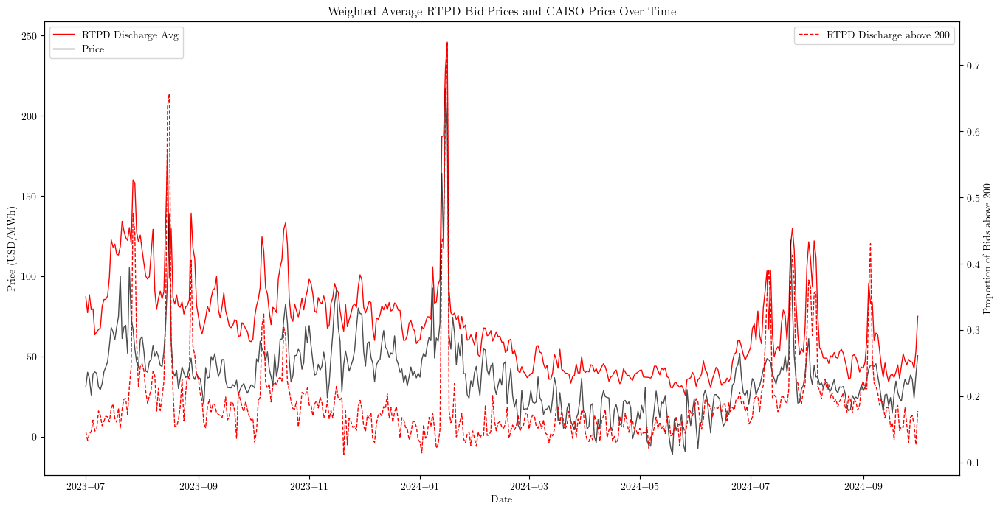

0.2561370899688025
0.4292189224257122


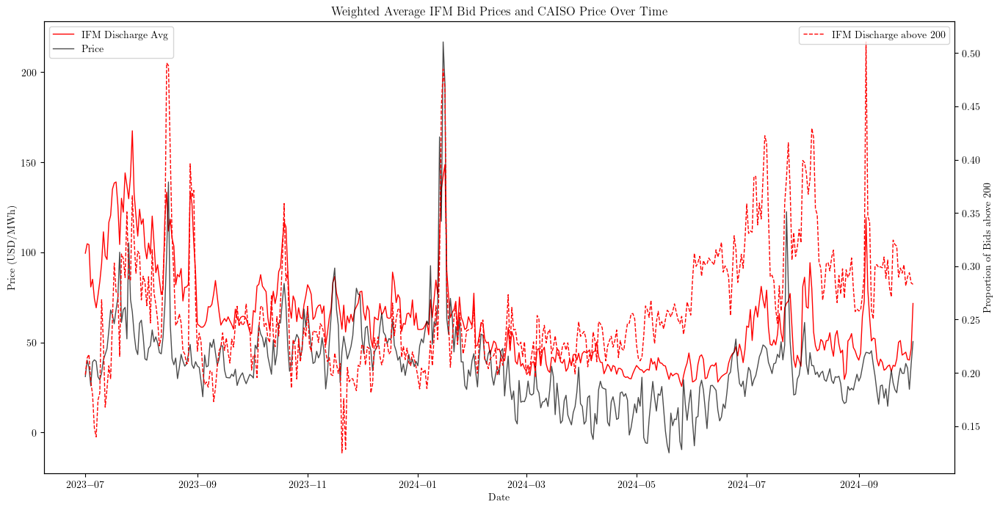

0.6469618981908679
0.55531741390991


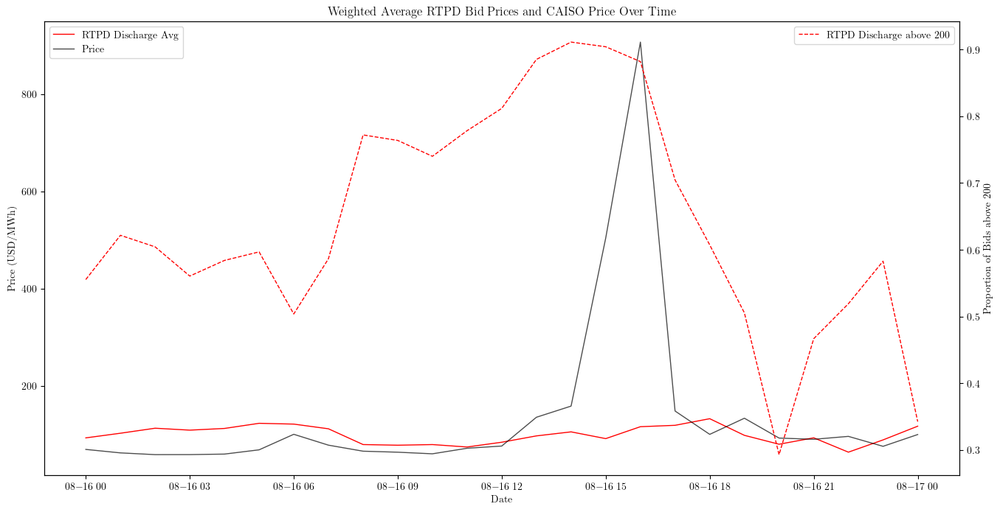

0.4872519877894399
0.48597983150118024


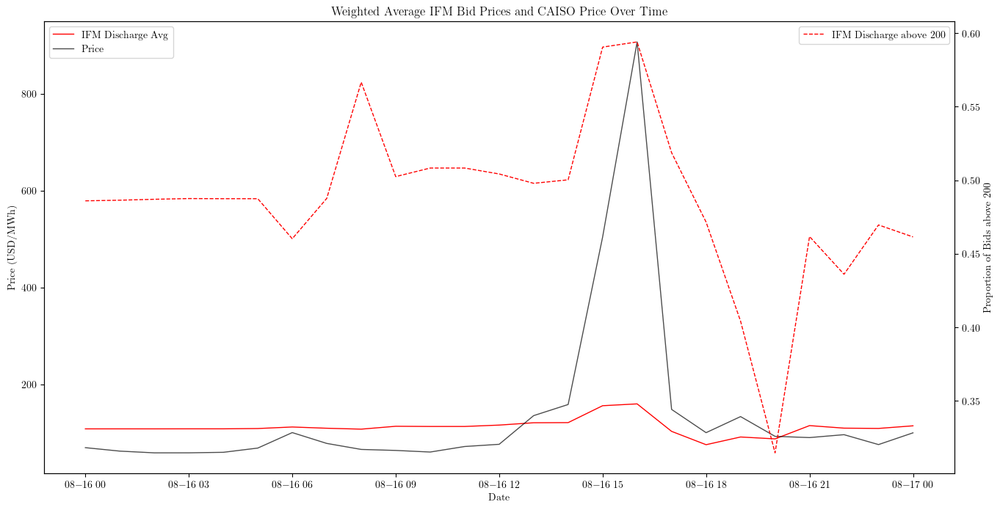

0.5593061445708144
0.5806051684469846


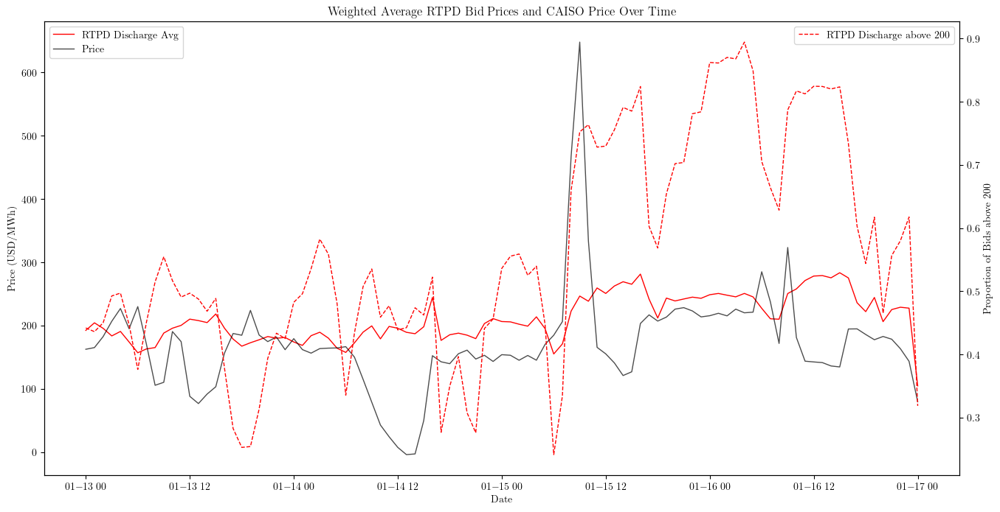

0.42484494765939074
0.4325220604295339


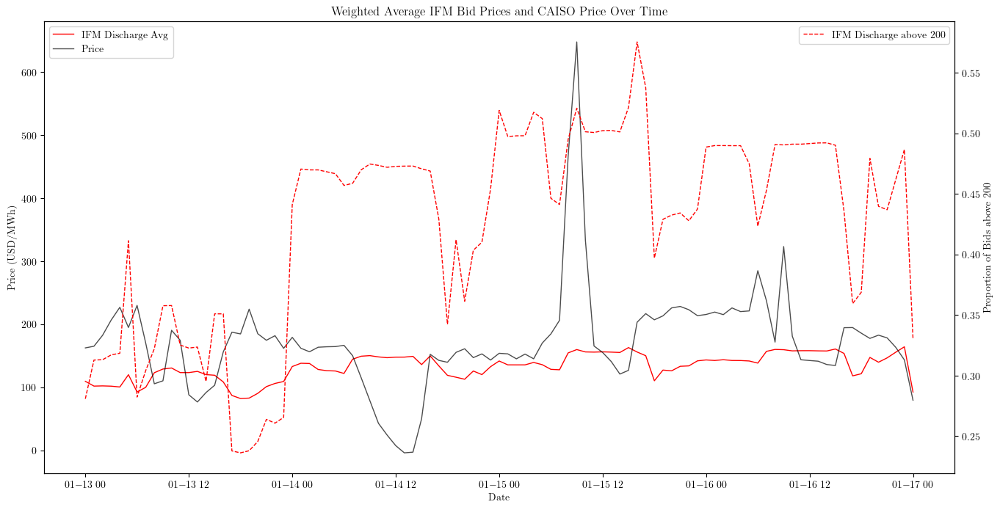

0.36620587380898256
0.42675895318685164


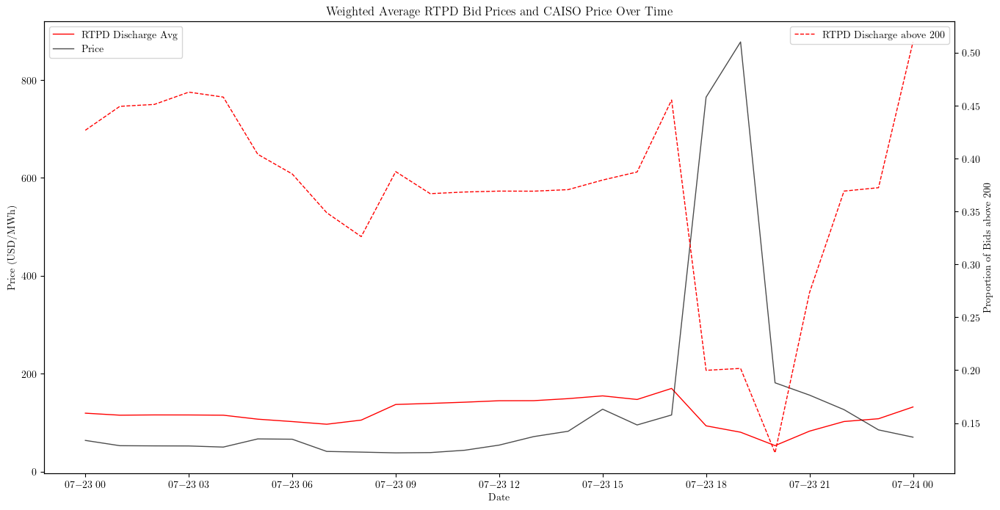

0.38569350411181896
0.3928303101856821


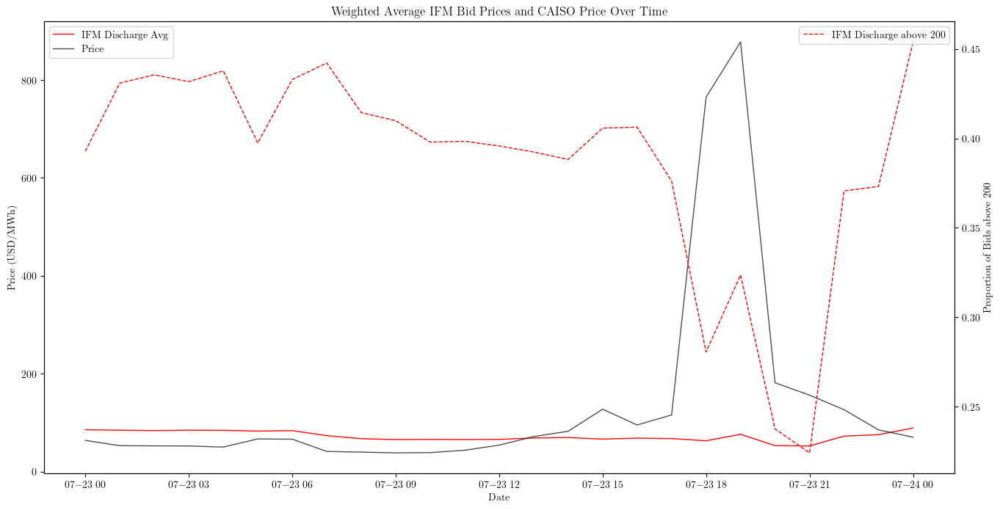

In [193]:
plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("July 1, 2023"),
    end_date=None,
    market="rtpd",
    granularity="D",
)

plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("July 1, 2023"),
    end_date=None,
    market="ifm",
    granularity="D",
)
#
plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("August 16, 2023"),
    end_date=pd.Timestamp("August 16, 2023"),
    market="rtpd",
    granularity="h",
)

plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("August 16, 2023"),
    end_date=pd.Timestamp("August 16, 2023"),
    market="ifm",
    granularity="h",
)
#
plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("January 13, 2024"),
    end_date=pd.Timestamp("January 16, 2024"),
    market="rtpd",
    granularity="h",
)

plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("January 13, 2024"),
    end_date=pd.Timestamp("January 16, 2024"),
    market="ifm",
    granularity="h",
)
#
plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("July 23, 2024"),
    end_date=pd.Timestamp("July 23, 2024"),
    market="rtpd",
    granularity="h",
)

plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("July 23, 2024"),
    end_date=pd.Timestamp("July 23, 2024"),
    market="ifm",
    granularity="h",
)

0.2320990068556735
0.6571052208041074


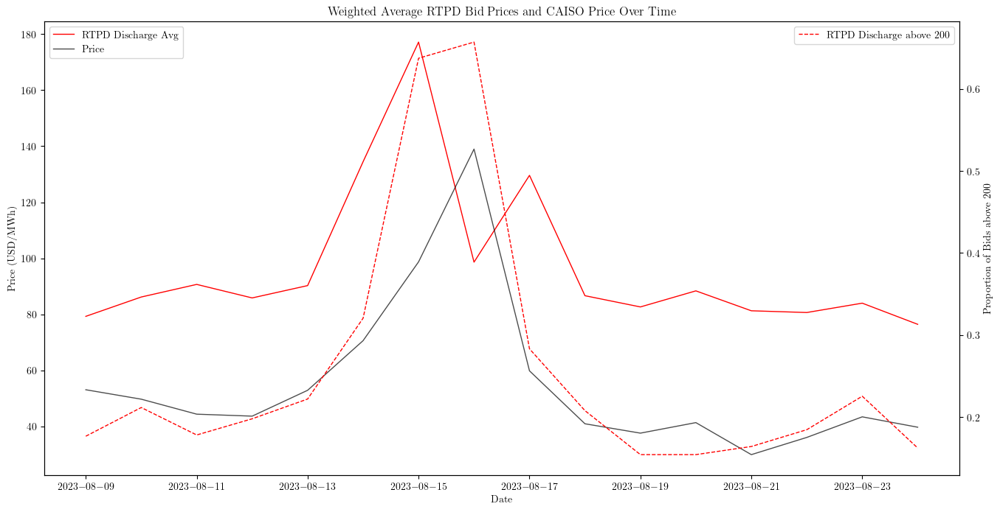

0.2879371004895787
0.4882186841223822


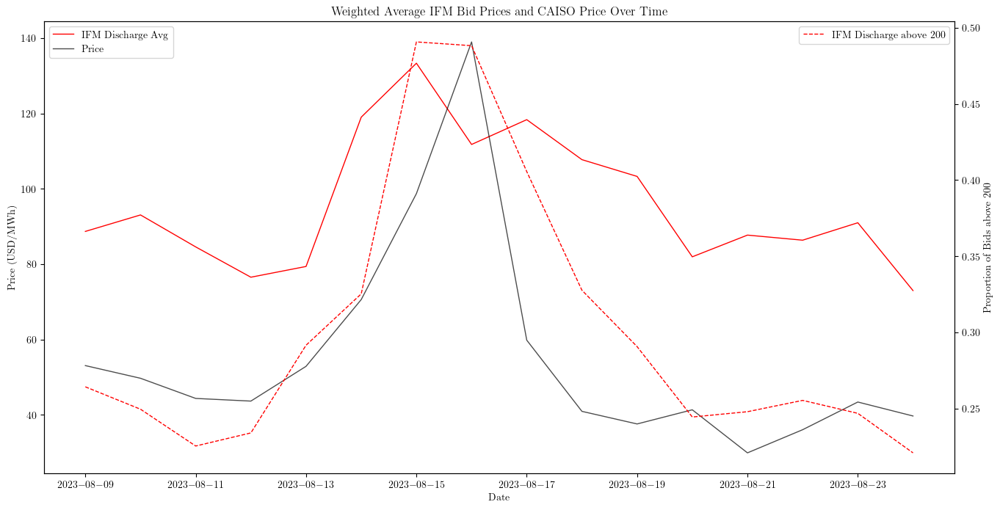

0.15933679266866727
0.5623663651514983


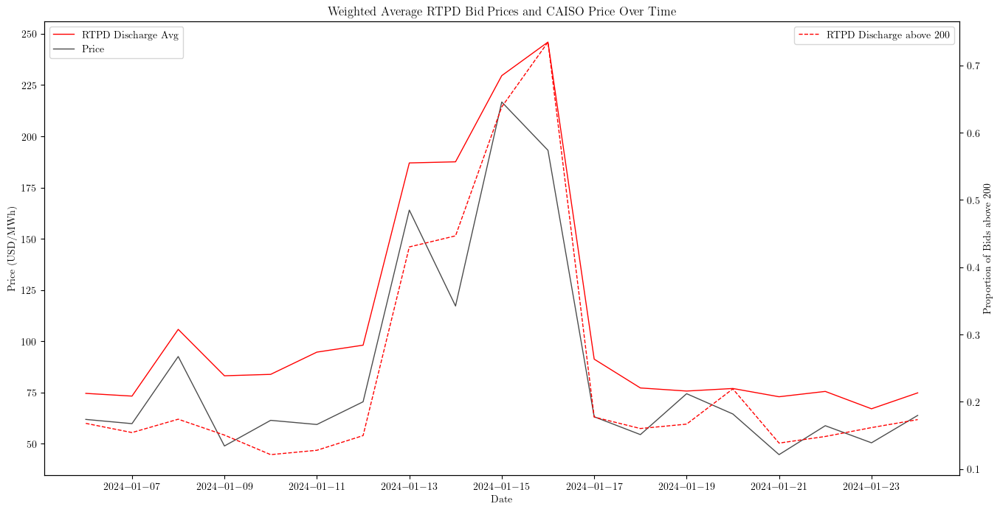

0.2341889516465981
0.42601215474237364


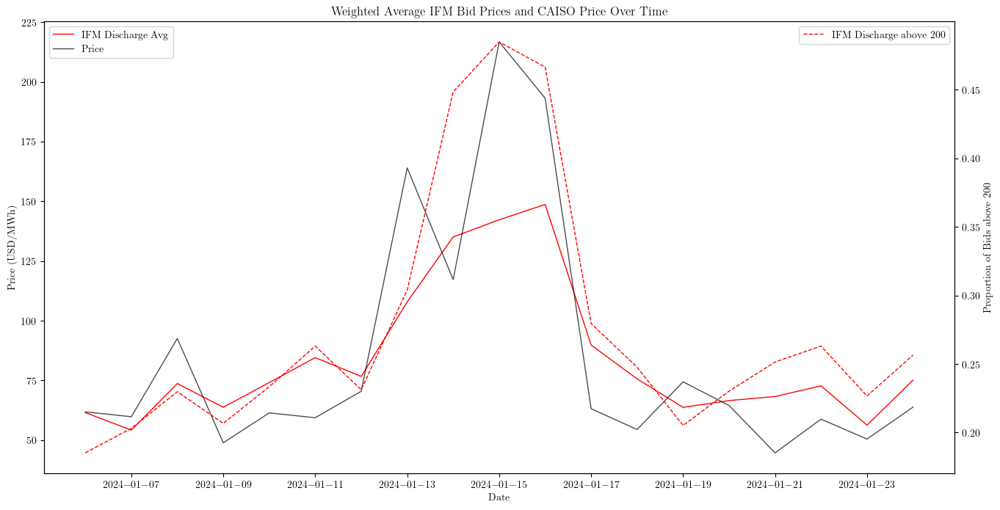

0.2253811833993156
0.3623502407984292


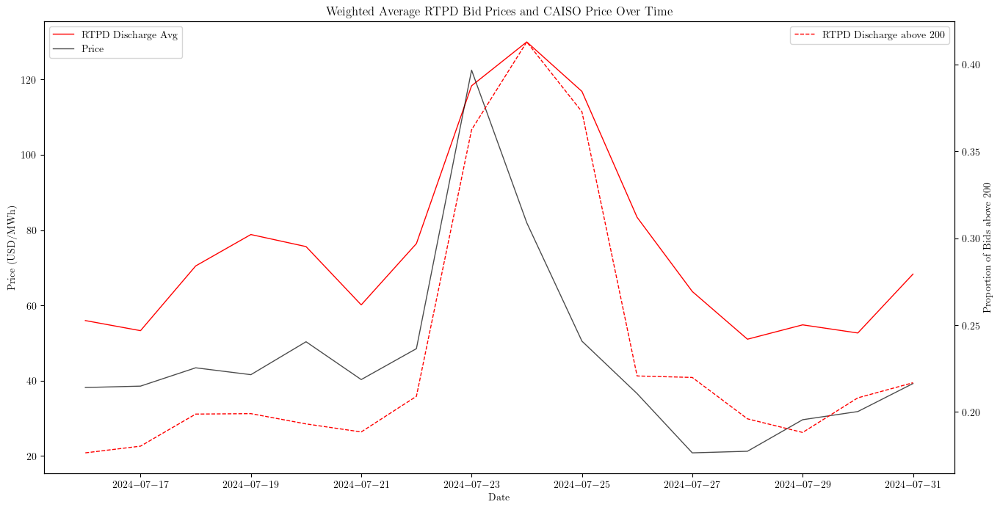

0.31221138584748437
0.3830462314623965


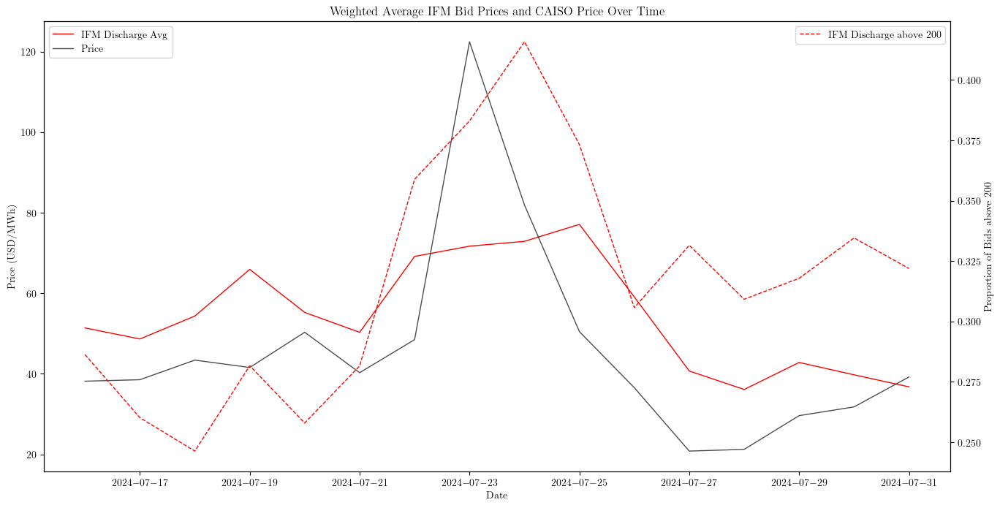

In [194]:
#
plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("August 16, 2023") - pd.Timedelta(weeks=1),
    end_date=pd.Timestamp("August 16, 2023") + pd.Timedelta(weeks=1),
    market="rtpd",
    granularity="D",
)

plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("August 16, 2023") - pd.Timedelta(weeks=1),
    end_date=pd.Timestamp("August 16, 2023") + pd.Timedelta(weeks=1),
    market="ifm",
    granularity="D",
)
#
plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("January 13, 2024") - pd.Timedelta(weeks=1),
    end_date=pd.Timestamp("January 16, 2024") + pd.Timedelta(weeks=1),
    market="rtpd",
    granularity="D",
)

plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("January 13, 2024") - pd.Timedelta(weeks=1),
    end_date=pd.Timestamp("January 16, 2024") + pd.Timedelta(weeks=1),
    market="ifm",
    granularity="D",
)
#
plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("July 23, 2024") - pd.Timedelta(weeks=1),
    end_date=pd.Timestamp("July 23, 2024") + pd.Timedelta(weeks=1),
    market="rtpd",
    granularity="D",
)

plot_weighted_price_prop(
    data=df_aggregate,
    start_date=pd.Timestamp("July 23, 2024") - pd.Timedelta(weeks=1),
    end_date=pd.Timestamp("July 23, 2024") + pd.Timedelta(weeks=1),
    market="ifm",
    granularity="D",
)

In [195]:
def add_average_bid_columns(df, bid_segment_weights):
    """
    Adds 'average_bid' columns to the dataframe as weighted sums of bid segments.

    Parameters:
    df (pd.DataFrame): The input dataframe containing bid segments.
    bid_segment_weights (list): The weights for each bid segment.

    Returns:
    pd.DataFrame: The dataframe with added 'average_bid' columns.
    """
    # Define the bid segment columns
    bid_columns = {
        "ifm_pos": [f"bid_ifm_pos_{i}" for i in range(1, 10)],
        "ifm_neg": [f"bid_ifm_neg_{i}" for i in range(1, 10)],
        "rtpd_pos": [f"bid_rtpd_pos_{i}" for i in range(1, 10)],
        "rtpd_neg": [f"bid_rtpd_neg_{i}" for i in range(1, 10)],
    }

    # Calculate the weighted average bid prices
    for key, columns in bid_columns.items():
        df[f"average_bid_{key}"] = np.abs(df[columns]).dot(
            bid_segment_weights[:9]
        ) / np.abs(df[f"bid_{key}_tot"])

    return df


# Example usage
df_with_avg_bids = add_average_bid_columns(df_aggregate, bid_segment_weights)

# Only keep data after July 1, 2023
df_with_avg_bids = df_with_avg_bids[
    df_with_avg_bids.index >= pd.Timestamp("July 1, 2023")
]

C:\Users\Astro\AppData\Local\Temp\ipykernel_36072\614910136.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_with_avg_bids["is_price_spike"] = df_with_avg_bids.index.isin(price_spike_days)


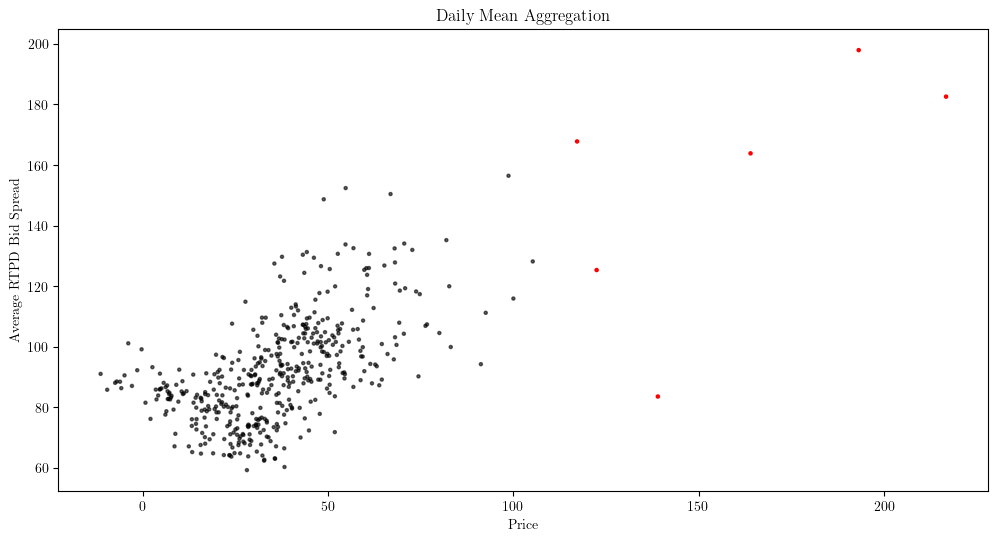

C:\Users\Astro\AppData\Local\Temp\ipykernel_36072\614910136.py:29: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_hourly = df_with_avg_bids.resample("H").mean()


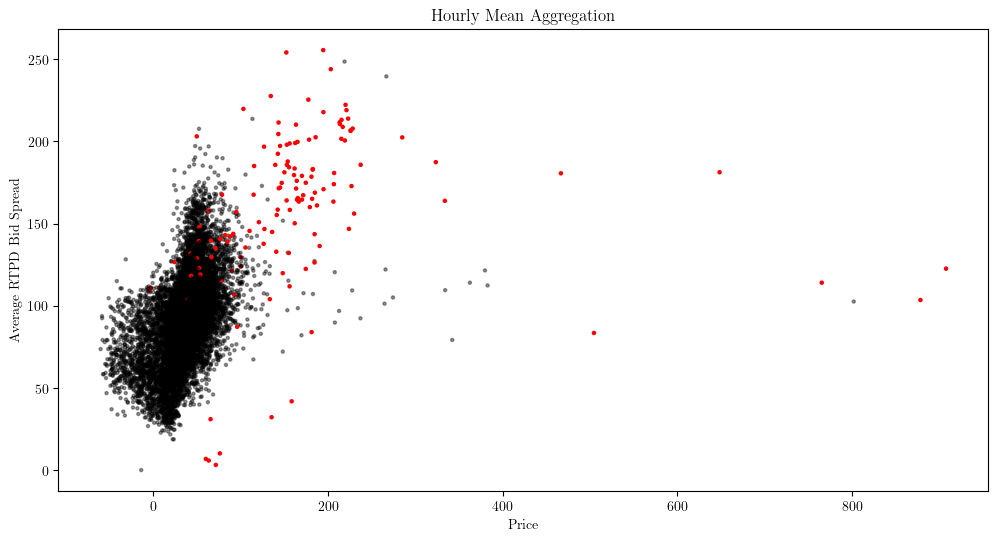

In [196]:
price_spike_days = [
    pd.Timestamp("August 16, 2023"),
    pd.Timestamp("January 13, 2024"),
    pd.Timestamp("January 14, 2024"),
    pd.Timestamp("January 15, 2024"),
    pd.Timestamp("January 16, 2024"),
    pd.Timestamp("July 23, 2024"),
]
# Identify price spike days
df_with_avg_bids["is_price_spike"] = df_with_avg_bids.index.isin(price_spike_days)

# Daily mean aggregation with color differentiation
df_daily = df_with_avg_bids.resample("D").mean()
df_daily["is_price_spike"] = df_daily.index.isin(price_spike_days)
plt.figure(figsize=(12, 6))
plt.scatter(
    df_daily["price"],
    df_daily["average_bid_rtpd_pos"] - df_daily["average_bid_rtpd_neg"],
    c=df_daily["is_price_spike"].apply(lambda x: "red" if x else "black"),
    alpha=df_daily["is_price_spike"].apply(lambda x: 1.0 if x else 0.6),
    s=5,
)
plt.title("Daily Mean Aggregation")
plt.xlabel("Price")
plt.ylabel("Average RTPD Bid Spread")
plt.show()

# Hourly mean aggregation with color differentiation
df_hourly = df_with_avg_bids.resample("H").mean()
df_hourly["is_price_spike"] = df_hourly.index.floor("D").isin(price_spike_days)
plt.figure(figsize=(12, 6))
plt.scatter(
    df_hourly["price"],
    df_hourly["average_bid_rtpd_pos"] - df_hourly["average_bid_rtpd_neg"],
    c=df_hourly["is_price_spike"].apply(lambda x: "red" if x else "black"),
    alpha=df_hourly["is_price_spike"].apply(lambda x: 1.0 if x else 0.4),
    s=5,
)
plt.title("Hourly Mean Aggregation")
plt.xlabel("Price")
plt.ylabel("Average RTPD Bid Spread")
plt.show()

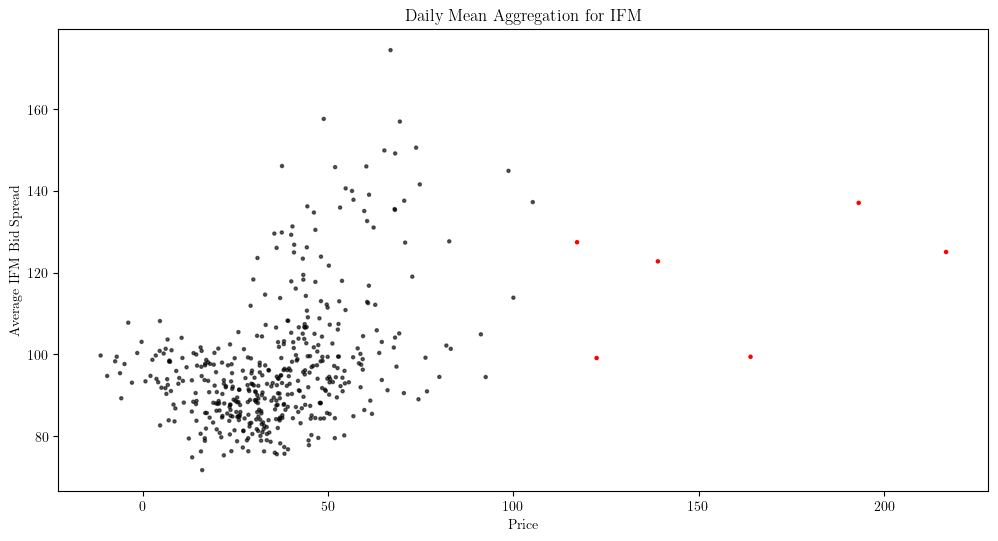

C:\Users\Astro\AppData\Local\Temp\ipykernel_36072\27307554.py:26: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_hourly = df_with_avg_bids.resample("H").mean()


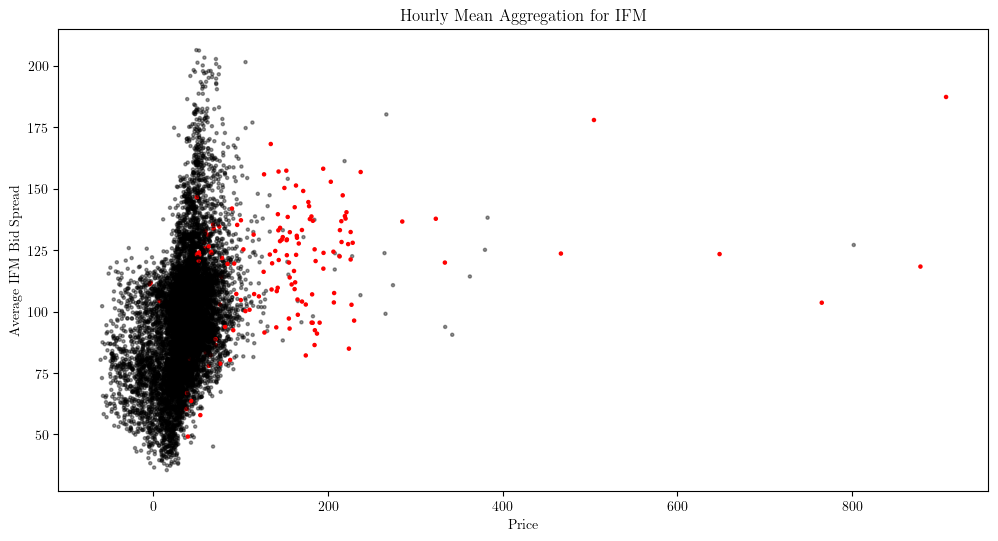

In [172]:
price_spike_days = [
    pd.Timestamp("August 16, 2023"),
    pd.Timestamp("January 13, 2024"),
    pd.Timestamp("January 14, 2024"),
    pd.Timestamp("January 15, 2024"),
    pd.Timestamp("January 16, 2024"),
    pd.Timestamp("July 23, 2024"),
]
# Daily mean aggregation with color differentiation for IFM
df_daily = df_with_avg_bids.resample("D").mean()
df_daily["is_price_spike"] = df_daily.index.isin(price_spike_days)
plt.figure(figsize=(12, 6))
plt.scatter(
    df_daily["price"],
    df_daily["average_bid_ifm_pos"] - df_daily["average_bid_ifm_neg"],
    c=df_daily["is_price_spike"].apply(lambda x: "red" if x else "black"),
    alpha=df_daily["is_price_spike"].apply(lambda x: 1.0 if x else 0.6),
    s=5,
)
plt.title("Daily Mean Aggregation for IFM")
plt.xlabel("Price")
plt.ylabel("Average IFM Bid Spread")
plt.show()

# Hourly mean aggregation with color differentiation for IFM
df_hourly = df_with_avg_bids.resample("H").mean()
df_hourly["is_price_spike"] = df_hourly.index.floor("D").isin(price_spike_days)
plt.figure(figsize=(12, 6))
plt.scatter(
    df_hourly["price"],
    df_hourly["average_bid_ifm_pos"] - df_hourly["average_bid_ifm_neg"],
    c=df_hourly["is_price_spike"].apply(lambda x: "red" if x else "black"),
    alpha=df_hourly["is_price_spike"].apply(lambda x: 1.0 if x else 0.4),
    s=5,
)
plt.title("Hourly Mean Aggregation for IFM")
plt.xlabel("Price")
plt.ylabel("Average IFM Bid Spread")
plt.show()

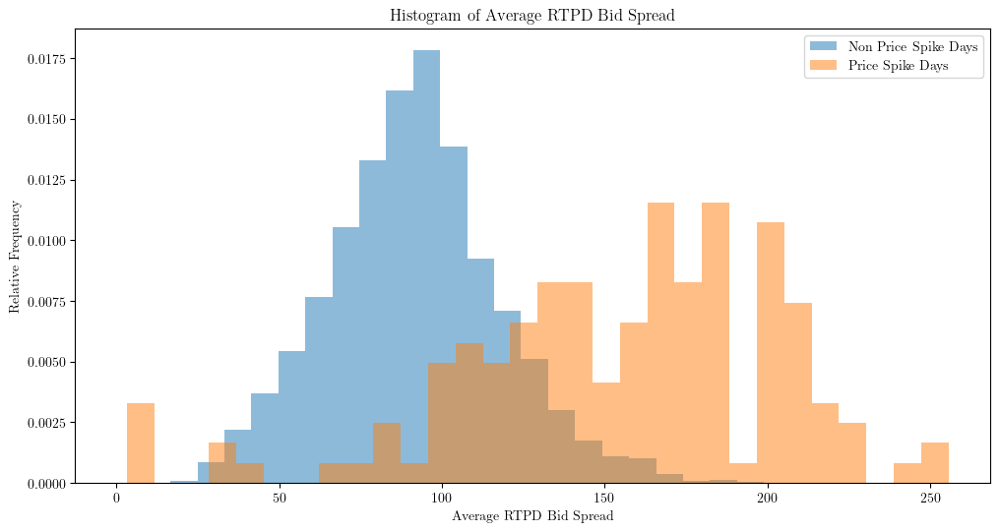

Non Price Spike Days - Mean: 92.35647288516508, Std Dev: 27.677414749534456
Non Price Spike Days - Mean: 91.54634291451579, Std Dev: 26.340180434678917
Price Spike Days - Mean: 153.5044079614656, Std Dev: 49.45798751782297


In [173]:
price_spike_days = [
    pd.Timestamp("August 16, 2023"),
    pd.Timestamp("January 13, 2024"),
    pd.Timestamp("January 14, 2024"),
    pd.Timestamp("January 15, 2024"),
    pd.Timestamp("January 16, 2024"),
    pd.Timestamp("July 23, 2024"),
]
# Hourly mean aggregation with color differentiation
df_hourly = df_with_avg_bids.resample("h").mean()
df_hourly["is_price_spike"] = df_hourly.index.floor("D").isin(price_spike_days)

# Calculate the average RTPD bid spread
df_hourly["average_rtpd_bid_spread"] = (
    df_hourly["average_bid_rtpd_pos"] - df_hourly["average_bid_rtpd_neg"]
)

# Separate the data into price spike days and non-price spike days
price_spike_days = df_hourly[df_hourly["is_price_spike"]]
non_price_spike_days = df_hourly[~df_hourly["is_price_spike"]]

# Plot the histograms
plt.figure(figsize=(12, 6))

# # Histogram for all days
# plt.hist(
#     df_hourly["average_rtpd_bid_spread"],
#     bins=30,
#     alpha=0.5,
#     label="Overall Distribution",
#     density=True,
# )

# Histogram for non-price spike days
plt.hist(
    non_price_spike_days["average_rtpd_bid_spread"],
    bins=30,
    alpha=0.5,
    label="Non Price Spike Days",
    density=True,
)

# Histogram for price spike days
plt.hist(
    price_spike_days["average_rtpd_bid_spread"],
    bins=30,
    alpha=0.5,
    label="Price Spike Days",
    density=True,
)

# Add title and labels
plt.title("Histogram of Average RTPD Bid Spread")
plt.xlabel("Average RTPD Bid Spread")
plt.ylabel("Relative Frequency")
plt.legend()

# Show the plot
plt.show()

# Calculate and print the mean and standard deviation for non-price spike days
mean_overall = df_hourly["average_rtpd_bid_spread"].mean()
std_overall = df_hourly["average_rtpd_bid_spread"].std()
print(f"Non Price Spike Days - Mean: {mean_overall}, Std Dev: {std_overall}")

# Calculate and print the mean and standard deviation for non-price spike days
mean_non_spike = non_price_spike_days["average_rtpd_bid_spread"].mean()
std_non_spike = non_price_spike_days["average_rtpd_bid_spread"].std()
print(f"Non Price Spike Days - Mean: {mean_non_spike}, Std Dev: {std_non_spike}")

# Calculate and print the mean and standard deviation for price spike days
mean_spike = price_spike_days["average_rtpd_bid_spread"].mean()
std_spike = price_spike_days["average_rtpd_bid_spread"].std()
print(f"Price Spike Days - Mean: {mean_spike}, Std Dev: {std_spike}")

In [174]:
# Separate the data into price spike days and non-price spike days
price_spike_days_data = df_hourly[df_hourly["is_price_spike"]][
    "average_rtpd_bid_spread"
].dropna()
non_price_spike_days_data = df_hourly[~df_hourly["is_price_spike"]][
    "average_rtpd_bid_spread"
].dropna()

# Perform the Kolmogorov-Smirnov test
ks_statistic, p_value = ks_2samp(price_spike_days_data, non_price_spike_days_data)

print(f"KS Statistic: {ks_statistic}")
print(f"P-value: {p_value}")

KS Statistic: 0.6581638911890085
P-value: 7.445479940942187e-61


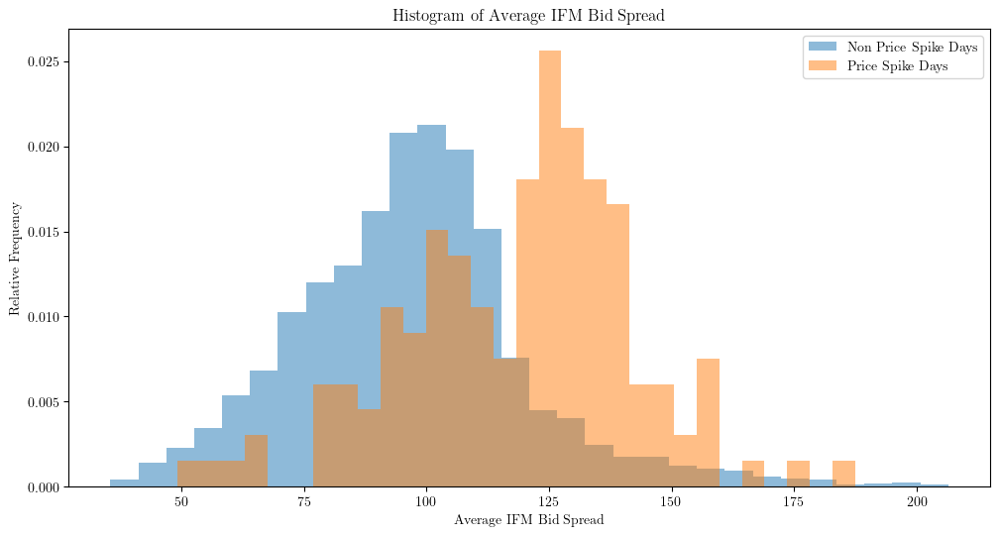

Non Price Spike Days - Mean: 97.29558351769533, Std Dev: 23.646263215795845
Non Price Spike Days - Mean: 97.01489112520323, Std Dev: 23.52091349024595
Price Spike Days - Mean: 118.48590989812402, Std Dev: 23.544019363243745


In [175]:
# Calculate the average IFM bid spread
df_hourly["average_ifm_bid_spread"] = (
    df_hourly["average_bid_ifm_pos"] - df_hourly["average_bid_ifm_neg"]
)

# Separate the data into price spike days and non-price spike days
price_spike_days_ifm = df_hourly[df_hourly["is_price_spike"]]
non_price_spike_days_ifm = df_hourly[~df_hourly["is_price_spike"]]

# Plot the histograms
plt.figure(figsize=(12, 6))

# Histogram for all days
# plt.hist(
#     df_hourly["average_ifm_bid_spread"],
#     bins=30,
#     alpha=0.5,
#     label="Overall Distribution",
#     density=True,
# )

# Histogram for non-price spike days
plt.hist(
    non_price_spike_days_ifm["average_ifm_bid_spread"],
    bins=30,
    alpha=0.5,
    label="Non Price Spike Days",
    density=True,
)

# Histogram for price spike days
plt.hist(
    price_spike_days_ifm["average_ifm_bid_spread"],
    bins=30,
    alpha=0.5,
    label="Price Spike Days",
    density=True,
)

# Add title and labels
plt.title("Histogram of Average IFM Bid Spread")
plt.xlabel("Average IFM Bid Spread")
plt.ylabel("Relative Frequency")
plt.legend()

# Show the plot
plt.show()

# Calculate and print the mean and standard deviation for non-price spike days
mean_overall = df_hourly["average_ifm_bid_spread"].mean()
std_overall = df_hourly["average_ifm_bid_spread"].std()
print(f"Non Price Spike Days - Mean: {mean_overall}, Std Dev: {std_overall}")

# Calculate and print the mean and standard deviation for non-price spike days
mean_non_spike = non_price_spike_days_ifm["average_ifm_bid_spread"].mean()
std_non_spike = non_price_spike_days_ifm["average_ifm_bid_spread"].std()
print(f"Non Price Spike Days - Mean: {mean_non_spike}, Std Dev: {std_non_spike}")

# Calculate and print the mean and standard deviation for price spike days
mean_spike = price_spike_days_ifm["average_ifm_bid_spread"].mean()
std_spike = price_spike_days_ifm["average_ifm_bid_spread"].std()
print(f"Price Spike Days - Mean: {mean_spike}, Std Dev: {std_spike}")

In [176]:
# Separate the data into price spike days and non-price spike days
price_spike_days_data = df_hourly[df_hourly["is_price_spike"]][
    "average_ifm_bid_spread"
].dropna()
non_price_spike_days_data = df_hourly[~df_hourly["is_price_spike"]][
    "average_ifm_bid_spread"
].dropna()

# Perform the Kolmogorov-Smirnov test
ks_statistic, p_value = ks_2samp(price_spike_days_data, non_price_spike_days_data)

print(f"KS Statistic: {ks_statistic}")
print(f"P-value: {p_value}")

KS Statistic: 0.45808994879342596
P-value: 9.064690328475746e-28


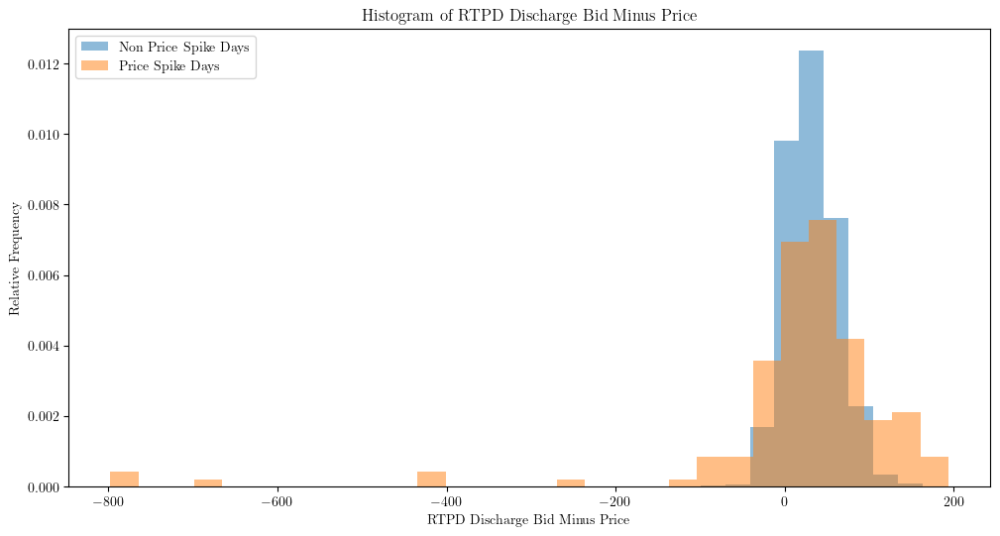

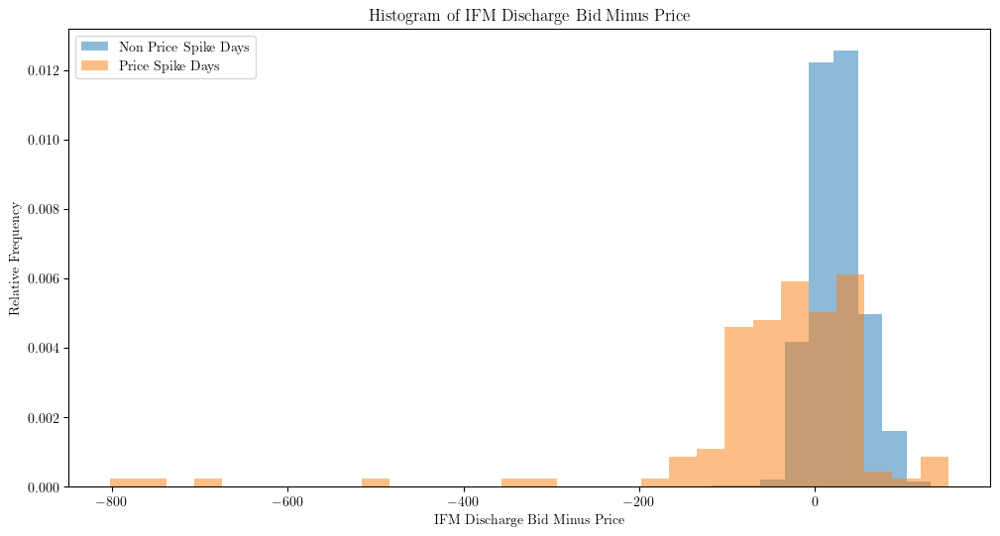

RTPD - KS Statistic: 0.15217005102092981, P-value: 0.0024564938295795293
IFM - KS Statistic: 0.48408426368952684, P-value: 3.7005773532217264e-31


In [190]:
# Calculate the average discharge bid minus price for RTPD and IFM
df_hourly["rtpd_discharge_bid_minus_price"] = (
    df_hourly["average_bid_rtpd_pos"] - df_hourly["price"]
)
df_hourly["ifm_discharge_bid_minus_price"] = (
    df_hourly["average_bid_ifm_pos"] - df_hourly["price"]
)

# Separate the data into price spike days and non-price spike days for RTPD
price_spike_days_rtpd = df_hourly[df_hourly["is_price_spike"]][
    "rtpd_discharge_bid_minus_price"
].dropna()
non_price_spike_days_rtpd = df_hourly[~df_hourly["is_price_spike"]][
    "rtpd_discharge_bid_minus_price"
].dropna()

# Separate the data into price spike days and non-price spike days for IFM
price_spike_days_ifm = df_hourly[df_hourly["is_price_spike"]][
    "ifm_discharge_bid_minus_price"
].dropna()
non_price_spike_days_ifm = df_hourly[~df_hourly["is_price_spike"]][
    "ifm_discharge_bid_minus_price"
].dropna()

# Plot the histograms for RTPD
plt.figure(figsize=(12, 6))
plt.hist(
    non_price_spike_days_rtpd,
    bins=30,
    alpha=0.5,
    label="Non Price Spike Days",
    density=True,
)
plt.hist(
    price_spike_days_rtpd, bins=30, alpha=0.5, label="Price Spike Days", density=True
)
plt.title("Histogram of RTPD Discharge Bid Minus Price")
plt.xlabel("RTPD Discharge Bid Minus Price")
plt.ylabel("Relative Frequency")
plt.legend()
plt.show()

# Plot the histograms for IFM
plt.figure(figsize=(12, 6))
plt.hist(
    non_price_spike_days_ifm,
    bins=30,
    alpha=0.5,
    label="Non Price Spike Days",
    density=True,
)
plt.hist(
    price_spike_days_ifm, bins=30, alpha=0.5, label="Price Spike Days", density=True
)
plt.title("Histogram of IFM Discharge Bid Minus Price")
plt.xlabel("IFM Discharge Bid Minus Price")
plt.ylabel("Relative Frequency")
plt.legend()
plt.show()

# Perform the Kolmogorov-Smirnov test for RTPD
ks_statistic_rtpd, p_value_rtpd = ks_2samp(
    price_spike_days_rtpd, non_price_spike_days_rtpd
)
print(f"RTPD - KS Statistic: {ks_statistic_rtpd}, P-value: {p_value_rtpd}")

# Perform the Kolmogorov-Smirnov test for IFM
ks_statistic_ifm, p_value_ifm = ks_2samp(price_spike_days_ifm, non_price_spike_days_ifm)
print(f"IFM - KS Statistic: {ks_statistic_ifm}, P-value: {p_value_ifm}")

In [178]:
df_daily_aggregate_current = add_average_bid_columns(
    df_daily_aggregate.copy(), bid_segment_weights
)
df_daily_aggregate_current = df_daily_aggregate_current[
    df_daily_aggregate_current.index >= pd.Timestamp("July 1, 2023")
]

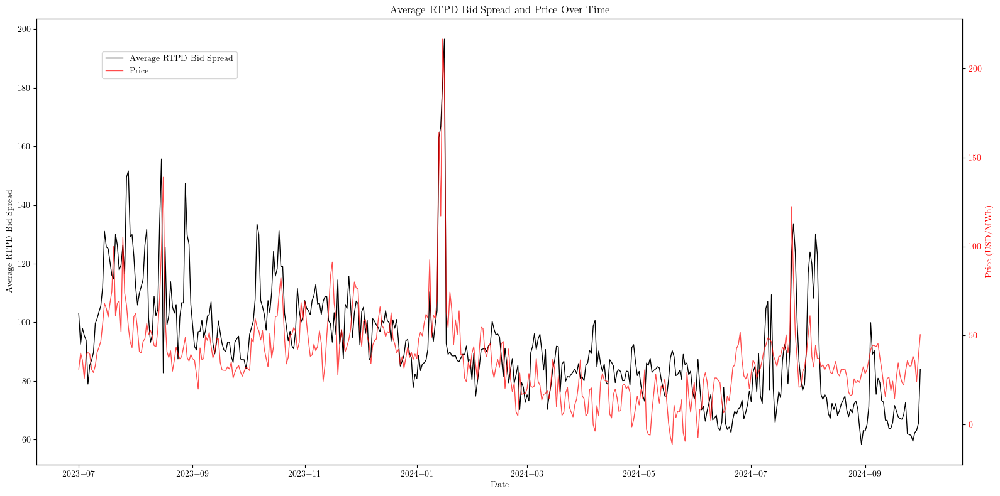

In [179]:
# Plot the data
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot average_bid_rtpd_pos - average_bid_rtpd_neg
ax1.plot(
    df_daily_aggregate_current.index,
    df_daily_aggregate_current["average_bid_rtpd_pos"]
    - df_daily_aggregate_current["average_bid_rtpd_neg"],
    label="Average RTPD Bid Spread",
    color="black",
    linewidth=1,
)
ax1.set_xlabel("Date")
ax1.set_ylabel("Average RTPD Bid Spread", color="black")
ax1.tick_params(axis="y", labelcolor="black")

# Create a twin axis to plot the price
ax2 = ax1.twinx()
ax2.plot(
    df_daily_aggregate_current.index,
    df_daily_aggregate_current["price"],
    label="Price",
    color="red",
    linewidth=1,
    alpha=0.7,
)
ax2.set_ylabel("Price (USD/MWh)", color="red")
ax2.tick_params(axis="y", labelcolor="red")

# Set title
plt.title("Average RTPD Bid Spread and Price Over Time")

# Add legends
fig.tight_layout()
fig.legend(loc="upper left", bbox_to_anchor=(0.1, 0.9))

plt.show()

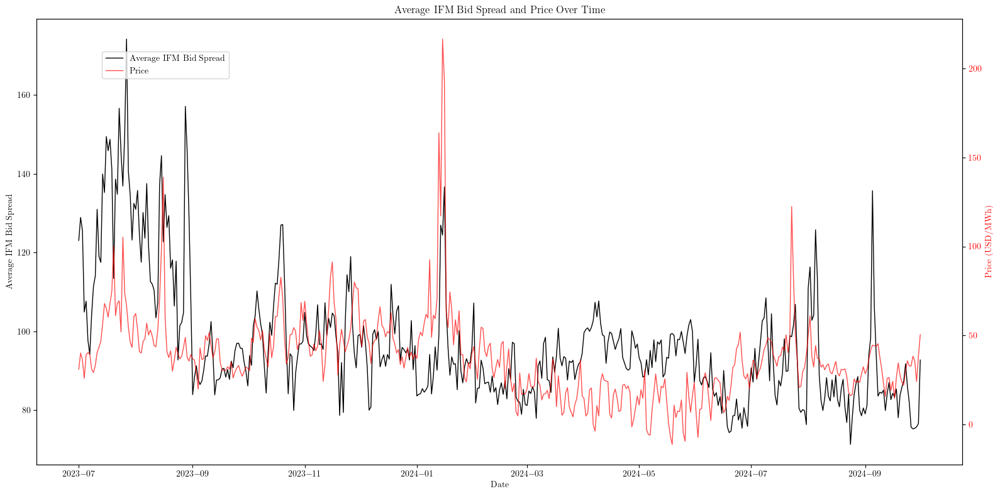

In [180]:
# Plot the data
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot average_bid_rtpd_pos - average_bid_rtpd_neg
ax1.plot(
    df_daily_aggregate_current.index,
    df_daily_aggregate_current["average_bid_ifm_pos"]
    - df_daily_aggregate_current["average_bid_ifm_neg"],
    label="Average IFM Bid Spread",
    color="black",
    linewidth=1,
)
ax1.set_xlabel("Date")
ax1.set_ylabel("Average IFM Bid Spread", color="black")
ax1.tick_params(axis="y", labelcolor="black")

# Create a twin axis to plot the price
ax2 = ax1.twinx()
ax2.plot(
    df_daily_aggregate_current.index,
    df_daily_aggregate_current["price"],
    label="Price",
    color="red",
    linewidth=1,
    alpha=0.7,
)
ax2.set_ylabel("Price (USD/MWh)", color="red")
ax2.tick_params(axis="y", labelcolor="red")

# Set title
plt.title("Average IFM Bid Spread and Price Over Time")

# Add legends
fig.tight_layout()
fig.legend(loc="upper left", bbox_to_anchor=(0.1, 0.9))

plt.show()